In [1]:
from qecsim.model import Decoder, cli_description
from qecsim.model import DecoderFTP
from qecsim.models.rotatedplanar import RotatedPlanarCode
from qecsim.models.toric import ToricCode
import math

import qecsim
from qecsim import paulitools as pt
from qecsim.models.generic import DepolarizingErrorModel, CenterSliceErrorModel, BitFlipErrorModel
from qecsim.models.generic import BiasedYXErrorModel, PhaseFlipErrorModel
from qecsim.models.rotatedplanar import RotatedPlanarCode

from enum import Enum
from copy import deepcopy
import numpy as np
import inspect
import random 
from numpy import random
from numpy.random import default_rng
import matplotlib.pyplot as plt
import numpy

In [2]:
my_code = ToricCode(5, 5)
my_error_model = CenterSliceErrorModel(lim=(0, 0, 1), pos = 1)
# set physical error probability to 10%
error_probability = .1
rng = default_rng()
# error: random error based on error probability
error = my_error_model.generate(my_code, error_probability, rng)
print("pauli error = \n{}".format(my_code.new_pauli(error)))
#my_error_model.__init__(lim=(0, 1, 0), pos = 1)

pauli error = 
┼─·─┼─·─┼─·─┼─·─┼─·
·   ·   ·   ·   ·  
┼─·─┼─·─┼─·─┼─·─┼─·
·   ·   ·   ·   Z  
┼─·─┼─·─┼─·─┼─·─┼─·
·   ·   ·   ·   ·  
┼─·─┼─·─┼─·─┼─·─┼─·
·   ·   ·   ·   ·  
┼─Z─┼─·─┼─Z─┼─·─┼─·
·   ·   ·   ·   ·  


In [3]:
# Indices are in the format (lattice, row, column).
# Qubit sites (i.e. edges) are indexed with lattice=0 and lattice=1 \
# indicating horizontal and vertical edges, respectively, on the primal lattice.

# Site indices on a 3 x 3 toric lattice (primal lattice edges shown):
#--|----(0,0,0)----|----(0,0,1)----|----(0,0,2)--
#  |               |               |
#(1,0,0)         (1,0,1)         (1,0,2)
#  |               |               |
#--|----(0,1,0)----|----(0,1,1)----|----(0,1,2)--
#  |               |               |
#(1,1,0)         (1,1,1)         (1,1,2)
#  |               |               |
#--|----(0,2,0)----|----(0,2,1)----|----(0,2,2)--
#  |               |               |
#(1,2,0)         (1,2,1)         (1,2,2)
#  |               |               |

# Stabilizer plaquettes are indexed by their northern edge with lattice=0 \ 
# indicating plaquettes on the primal lattice, and lattice=1 indicating \
# plaquettes on the dual lattice. (Equivalently, vertices are indicated \ 
# by their northern edge with lattice=0 indicating vertices on the dual \
# lattice, and lattice=1 indicating vertices on the primal lattice.)
# Plaquette indices on the primal 3 x 3 lattice (primal lattice edges shown):
#--|---------------|---------------|-------------
#  |               |               |
#  |    (0,0,0)    |    (0,0,1)    |    (0,0,2)
#  |               |               |
#--|---------------|---------------|-------------
#  |               |               |
#  |    (0,1,0)    |    (0,1,1)    |    (0,1,2)
#  |               |               |
#--|---------------|---------------|-------------
#  |               |               |
#  |    (0,2,0)    |    (0,2,1)    |    (0,2,2)
#  |               |               |

#Plaquette indices on the dual 3 x 3 lattice (dual lattice edges shown):
#(1,2,0)    :    (1,2,1)    :    (1,2,2)    :
#           :               :               :
# - - - - - : - - - - - - - : - - - - - - - : - -
#           :               :               :
#(1,0,0)    :    (1,0,1)    :    (1,0,2)    :
#           :               :               :
# - - - - - : - - - - - - - : - - - - - - - : - -
#           :               :               :
#(1,1,0)    :    (1,1,1)    :    (1,1,2)    :
#           :               :               :
# - - - - - : - - - - - - - : - - - - - - - : - -
#           :               :               :

import numpy as np

class edgeState(Enum):
    Unoccupied = 0
    HalfGrown = 0.5
    Grown = 1    

class Vertex():
    def __init__(self, coordinate):
        #print("coordinate[0] = ", coordinate)
        self.x = coordinate[0]
        self.y = coordinate[1]
        self.root = self
        self.edges = []
        self.rank = 1 # size of the cluster tree
        self.syndrome = 0 # is error on it
        self.clusterBelong = None # belong to which cluster
        self.child = [] # for spanning tree and peeling algorithm
        self.used = 0  # for spanning tree
    
    def getX(self):

        return self.x
    
    def getY(self):
        return self.y

    def coordinate(self):
        return (self.x, self.y)
    
    def invert(self):
        #print("invert self: self.syndrome before = ", self.syndrome, "self = ", self)        
        self.syndrome = 1-self.syndrome
        #print("invert self: self.syndrome after = ", self.syndrome, "self = ", self)            
    def getChild(self):
        return self.child
    
    def addChild(self,c):
        self.child.append(c)
    
    def isSyndrome(self):
        return self.syndrome==1
    
    def rootClusterBelong(self):
        return self.getRoot().clusterBelong
    
    def addedge(self, e):
        self.edges.append(e)
    
    def calcMidCoordinate(self, v, codeLength=[]):
        if isinstance(v, BoundaryCondition):
            return v.calcMidCoordinate(self)
        #print("v = ", v)
        #print("self = ", self)
        #print("codeLength = ", codeLength)
        if codeLength!=[]:
            #print("inside codeLength!=[]")
            if (self.x==0 and v.x==codeLength[0]-1) or \
            (v.x==0 and self.x==codeLength[0]-1):
                midX = codeLength[0]-0.5;
            else: 
                midX = (self.x+v.x)/2
                
            if (self.y==0 and v.y==codeLength[1]-1) or \
            (v.y==0 and self.y==codeLength[1]-1):
                midY = codeLength[1]-0.5;
            else:
                midY = (self.y+v.y)/2
        else:            
            midX = (self.x+v.x)/2
            midY = (self.y+v.y)/2            
        return (midX, midY)
    
    def plaq2node(self,v): # to change node in this class
        return (v[0]+0.5,v[1]+0.5)
    
    def unionVertex(self, v):
        """unify two vertices
        Args:
            v (Vertex): vertex to unify with self
        Returns:
            int: 0 => union to self 
                 1 => union to v
        """
        # tell which rank is bigger
        r1 = self.getRoot()
        r2 = v.getRoot()
        if r1.rank > r2.rank:
            r2.root = r1
            r1.rank += r2.rank
            return 0
        else:
            r1.root = r2
            r2.rank += r1.rank
            return 1

    def getRoot(self):
        if self != self.root:
            self.root = self.root.getRoot()
        return self.root
    
    def grow(self):
        """grow each edge self connect
        Returns:
            list: edge which become Grown
            list: new boundary vertex
        """
        fusionList = []
        newBoundaryList = []
        for edge in self.edges:
            #print("edge = ", edge, " , edge.state = ", edge.state)
            if edge.grow():
                fusionList.append(edge)
                newBoundaryList.append(edge.anotherVertex(self))
        return fusionList, newBoundaryList
    
    def isInsideVertex(self):
        for e in self.edges:
            if e.state != edgeState.Grown:
                return False
        return True
        
    def __eq__(self, __o):
        if isinstance(__o, Vertex):
            return (self.x == __o.x and self.y == __o.y)
        return False
    
    def __hash__(self):
        return hash(self.coordinate())
    
    def __str__(self):
        return "("+str(self.x)+","+str(self.y)+")" # +":"+str(self.syndrome)
    
    def __repr__(self):
        return str(self)
    
class BoundaryCondition(Vertex):
    """This class aims to handle odd syndrome in decoder
    * when even syndrome, we need a trivial boundary vertex
    * when odd syndrome, we need a nontrivial imaginary syndrome vertex
    * all boundary vertex will merge into **one** imaginary vertex
    For example, stabilizer plaquette types and indices on a 3 x 3 lattice:
                 -------
                /   Z   \
               |  (0,2)  |
               +---------+---------+-----
               |    X    |    Z    |  X  \
               |  (0,1)  |  (1,1)  |(2,1) |
               |         |         |     /
          -----+---------+---------+-----
         /  X  |    Z    |    X    |
        |(-1,0)|  (0,0)  |  (1,0)  |
         \     |         |         |
          -----x---------+---------+
               \         |    Z    |\
                \         \ (1,-1)/  \
                 \         -------    \
                  b                    b
                  (0,-1)
    if 'X' error happen, (-1,0) is the only syndrome, we need to add syndrome (0,-1) so that the decoder
    can decode by (-1,0) to (0,-1) successfully
    * Notice: there are several imaginary vertex, when we need its position to decode, we choose the nearest
      boundary vertex
    """
    
    def __init__(self, position,t):
        super().__init__(position)
        self.type = t
    # overide
    def calcMidCoordinate(self, v, codeLength=[]):
        # print(v,self.type)
        if self.type == 'X':
            if v.getY() == 0: # low line
                return (v.getX()+0.5,v.getY()-0.5)
            else: # high line
                return (v.getX()-0.5,v.getY()+0.5)
        if self.type == 'Z':
            if v.getX() == 0: # left line
                return (v.getX()-0.5,v.getY()-0.5)
            else: # right line
                return (v.getX()+0.5,v.getY()+0.5)
            
    def __str__(self):
        return "BoundaryVertex"    
        
class Edge(): 
    def __init__(self, a:Vertex, b:Vertex): # u->v
        self.u = a
        self.v = b
        self.state = edgeState.Unoccupied
        a.addedge(self)
        b.addedge(self)
        
    def fstVertex(self):
        return self.u
    def lstVertex(self):
        return self.v
    
    def anotherVertex(self, othervertex):
        if self.v == othervertex:
            return self.u
        if self.u == othervertex:
            return self.v
        return None

    def grow(self):
        """grow half edge
        Returns:
            bool: is it become Grown
        """

        if self.state == edgeState.Unoccupied:
            self.state = edgeState.HalfGrown
            return False
        elif self.state == edgeState.HalfGrown:
            self.state = edgeState.Grown
            return True
        elif self.state == edgeState.Grown:
            return False
    
    def __eq__(self,o):
        if isinstance(o, Edge):
            return (self.u == o.u and self.v == o.v) or (self.u == o.v and self.v == o.u)
        return False
    
    def __str__(self):
        return str(self.u)+"->"+str(self.v)
    
    def __repr__(self):
        return str(self)
    
class Graph():
    def __init__(self,code,type=[],edgeList=[]):
        """createGraph
        * build vertex according to surface code
        * build edge connected by vertex according to surface code
        Args:
            code (RotatedPlanarCode): Surface Code
            type (function): decoder 'Z' or 'X' error
        """
        #def __init__(self, Code, Syndromex=[], Syndromez=[]):
        #print("coordinate[0] = ", coordinate)
        #self.code = Code
        #self.clusterBelong = None # belong to which cluster
        #self.child = [] # for spanning tree and peeling algorithm
        
        self.vertices = dict()
        self.edges = []
        self.code = code
        
        if isinstance(code, RotatedPlanarCode):
            print("code._plaquette_indices = ", code._plaquette_indices)
            #print("type code._plaquette_indices = ", type(code._plaquette_indices))
            plaquettes = code._plaquette_indices
            #print("plaquettes = ", plaquettes)
            # set vertices
            for p in plaquettes:
                #print("p = ", p)
                #X-type stabilizer plaquette indices satisfy (x-y) % 2 == 1.                
                #Z-type stabilizer plaquette indices satisfy (x-y) % 2 == 0.                
                #print("type(p) = ", type(p))                
                if type(p):
                    self.vertices[p] = Vertex(p)
                    
            # set edges
            for pos in self.vertices.keys():
                #print("pos in keys = ", pos)
                v = self.vertices[pos]
                pos = v.coordinate()
                x = v.getX()
                #print("x = ", x)
                reference = [(1,1),(1,-1),(-1,1),(-1,-1)]
                if (x+1)%2==0:
                    for ref in reference:
                        otherPos = (ref[0]+pos[0], ref[1]+pos[1])
                        #print("pos = ", pos, ", otherPos = ", otherPos)
                        if otherPos in self.vertices.keys():
                            other = self.vertices[otherPos]
                            self.edges.append(Edge(v, other))                            
            self.createBoundaryVertex(type)

            
        if isinstance(code, ToricCode):
            #print("code.stabilizers = ", code.stabilizers)
            #plaquettes = code._plaquette_indices
            #print("plaquettes = ", plaquettes)
            
            # create the vertices            
            #print("ToricCode size = {} \n".format(code.size))
            codeSize = code.size
            Lx = codeSize[0]
            Ly = codeSize[1]
            numVertex = Lx*Ly;
            listVertex = list(x for x in range(numVertex))            
            
            for qbit in listVertex:
                x = qbit%Ly
                y = qbit//Ly
                coord = [x, y]
                keypos = (x, y)
                self.vertices[keypos] = Vertex(coord)
                
            # create the edge list
            vertexList = self.vertices;
            #print("vertexList = ", vertexList.keys())
            for keyv in list(vertexList):
                v = self.vertices[keyv]
                pos = v.coordinate()              
                reference = [(1,0),(0,1),(-1,0),(0,-1)]
                
                for ref in reference:
                    otherPosx = (ref[0]+pos[0])%Lx
                    otherPosy = (ref[1]+pos[1])%Ly
                    otherPos = (otherPosx,otherPosy)
                    if otherPos in vertexList.keys():
                        otherVertex = vertexList[otherPos]
                        anotherVertexList = [vt.anotherVertex(v) for vt in v.edges]
                        if len(v.edges)>0:    
                            if otherVertex not in anotherVertexList: 
                                self.edges.append(Edge(v, otherVertex))
                        elif len(v.edges)==0:
                            self.edges.append(Edge(v, otherVertex))                    
                    else: 
                        print("otherPos not in vertexList.keys()")
                                        
                #del vertexList[keyv]    
                #vertexList.keys().remove(keyv)
            #print("length (self.edges) = ", len(self.edges))
            #self.createBoundaryVertex(type)
            
            #for i in self.vertices.values():
                #print("i = ", i, ", i edges = ", i.edges)
        #print("self.edges in Graph = ", self.edges)        
    def createBoundaryVertex(self, type):
        """Create imaginary vertex
        * See class:BoundaryCondition for detail
        Args:
            type (function): 'Z' or 'X' error lead to different special boundary vertex
        """
        #print("type = ", type)
        print("self.code = ", self.code)
        if isinstance(self.code,  RotatedPlanarCode):
            dim = self.code.n_k_d[2]
            if type == self.code.is_x_plaquette:
                # print('x',self.edges)
                l1 = [(i,0) for i in range(-1,dim,2)]
                l2 = [(i, dim-2) for i in range(0, dim, 2)]
                # print(dim)
                imagVertex = BoundaryCondition((-666,-666), 'X')
                for i in l1:
                    self.edges.append(Edge(self.vertices[i], imagVertex))
                for i in l2:
                    self.edges.append(Edge(self.vertices[i], imagVertex))                    
                self.vertices[((-666,-666))] = imagVertex
            if type == self.code.is_z_plaquette:
                l3 = [(0,i) for i in range(0,dim,2)]
                l4 = [(dim-2, i) for i in range(-1,dim,2)]
                imagVertex = BoundaryCondition((-666,-666), 'Z')
                for i in l3:
                    self.edges.append(Edge(self.vertices[i], imagVertex))
                for i in l4:
                    self.edges.append(Edge(self.vertices[i], imagVertex))    
                self.vertices[((-666, -666))] = imagVertex
    
    def coord2vertex(self, coord):
        #print("self.vertices[coord] = ", self.vertices, ", coord = ", coord)
        return self.vertices[coord]

        
    def __str__(self):
        s = ''
        # for v in self.v:
        #     s += str(v)
        # s+='\n'
        for e in self.edges:
            s += str(e)+' '
        return s
        
class Cluster():
    """represent cluster in unionfind algorithm
    Attributes:
        treeroot: a representation vertex of the cluster
        edges: all Grown edges in this cluster
        boundaryList: represent boundary in unionfind algorithm
        parity: there are odd/even syndrome in this cluster
        alive: when this cluster merge by another cluster or be even, alive = False
    """
    id = 0
    def __init__(self, point):
        
        self.treeroot = point # vertex
        self.edges = [] # edge list
        self.boundaryList = [point]
        #self.support = dict()
        self.parity = 1
        self.alive = True
        self.id = Cluster.id
        Cluster.id = Cluster.id + 1
        point.clusterBelong = self
        #print("before point.invert")
        point.invert() # set syndrome
        #print("after point.invert")        
        #print("point.syndromex (in __init__ Cluster) = ", point.syndrome, ", point = ", point)        
        
    def isEven(self):
        return self.parity % 2 == 0
        
    def grow(self):
        self.treeroot = self.treeroot.getRoot()
        edgeList = []
        newBoundaryList = []
        for boundary in self.boundaryList:
            edgelist, boundarylist = boundary.grow()
            edgeList += edgelist
            newBoundaryList += boundarylist
            # update boundary
        self.edges += edgeList # update edges that belong to the cluster
        # print('edges', self.edges)
        self.boundaryList += newBoundaryList
        return edgeList
    
    def combineCluster(self, c):
        r1: Vertex = self.treeroot.getRoot()
        r2: Vertex = c.treeroot.getRoot()
        c1 = r1.clusterBelong
        c2 = r2.clusterBelong
        flag = r1.unionVertex(r2)

        if flag == 0: # c->self
            c2.alive = False # update vertex belong
            r2.clusterBelong = c1
            c1.parity += c2.parity # update syndrome's parity
            # update boundary
            c1.boundaryList += c2.boundaryList
            c1.edges += c2.edges
            return 0, c2
            # c = self
            # print('parity', c1.parity)
            # print('belong', r1.rootClusterBelong())
        else: # self->c
            # print(c1, '->', c2)
            c1.alive = False
            r1.clusterBelong = c2
            c2.parity += c1.parity
            # update boundary
            c2.boundaryList += c1.boundaryList
            c2.edges += c1.edges 
            return 1,c1
            # self = c
            # print('parity',c2.parity)
            # print('belong', r2.rootClusterBelong())
            
    def cleanBoundary(self):
        self.boundaryList = list(set(self.boundaryList))
        #print("cleanBoundary: self.boundaryList = ", self.boundaryList)
        for i in range(len(self.boundaryList)-1,-1,-1):
            boundary = self.boundaryList[i]
            if boundary.isInsideVertex():
                self.boundaryList.remove(boundary)

                
    def cluster2Tree(self):
        edges = self.edges
        vertexDict = dict()
        for edge in edges:
            u = edge.fstVertex()
            v = edge.lstVertex()
            if vertexDict.__contains__(u):
                vertexDict[u].append(edge)
            else:
                vertexDict[u] = [edge]
            if vertexDict.__contains__(v):
                    vertexDict[v].append(edge)
            else:
                vertexDict[v] = [edge]        

        root = v
        # Build a tree by root
        buildList = [root]
        root.used = 1
        while len(buildList)>0:
            v = buildList.pop()
            for edge in vertexDict[v]:
                another = edge.anotherVertex(v)
                if another.used == 0:
                    buildList.append(another)
                    v.addChild(another)
                    another.used = 1
        # print(vertexDict)
        return root
    
    def __eq__(self, __o):
        if isinstance(__o, Cluster):
            return self.treeroot == __o.treeroot
        return False
    
    def __hash__(self) -> int:
        return self.id
    
    def __str__(self):
        return str(self.treeroot)+" parity:"+str(self.parity)+" alive "+str(self.alive)
    
    def __repr__(self):
        return str(self)

@cli_description('unionfind decoder')
class UnionFindDecoder(Decoder):
    def decode(self, code, syndrome, debug=False, **kwargs):
        self.debug = debug
        self.code = code
        self.syndrome = syndrome
        recovery = []
        syndromex = []
        syndromez = []
        syndromeSet = code.syndrome_to_plaquette_indices(syndrome)
        #print("code.syndrome_to_plaquette_indices = ", code.syndrome_to_plaquette_indices)
        #print("syndromeSet = ", syndromeSet)
        #print("code = ", code.__dict__)
        for syn in syndromeSet:
            #print("syn = ", syn)
            if isinstance(code, RotatedPlanarCode):
                if(code.is_z_plaquette(syn)):
                    syndromez.append(syn)
                if(code.is_x_plaquette(syn)):
                    syndromex.append(syn)
            if isinstance(code, ToricCode):                    
                if(syn[0]==1):
                    syndromex.append(syn[1:len(syn)])
                if(syn[0]==0):
                    syndromez.append(syn[1:len(syn)])

        #print("code = ", code)
        
        #print("syndromez = ", syndromez)
        #print("syndromex = ", syndromex)
        if isinstance(code, RotatedPlanarCode):
            #print("code.is_z_plaquette = ", code.is_z_plaquette)
            graph = self.createGraph(code, code.is_z_plaquette)
            #print("graph.vertices = ", graph.vertices)            
            recovery += self._decoder(syndromez, graph)
            graph = self.createGraph(code, code.is_x_plaquette)
            recovery += self._decoder(syndromex, graph)
        elif isinstance(code, ToricCode):
            #graph = self.createGraph(code)
            #recovery += self._decoder(syndromez, graph)
            graph = self.createGraph(code)
            recovery += self._decoder(syndromex, graph)
        elif isinstance(code, "Honeycomb"):
            graph = self.createGraph(code)
            recovery += self._decoder(syndromex, graph)
        #print("recovery = ", recovery)    
        #print("type(recovery) = ", type(recovery))
        return numpy.array(recovery) 
    
    def _decoder(self, syndromeList, graph):
        """main procedure to decoder
        Args:
            syndromeList (list): list contains syndromes in (x, y)
            graph (Graph): abstarct graph built by self.createGraph
            
        Returns:
            recoveryList (list): list contains recovery in (x, y)
        """
        clusterList = self.initialCluster(syndromeList, graph)
        clusterList = set(clusterList)
        #print("initial clusterList = ", clusterList)
        evenClusterList = set()
        while len(clusterList)>0: # odd cluster not empty      
            if self.debug:      
                print('all',clusterList)
                print('even', evenClusterList)
            # clusterList.sort(key=lambda x: len(x.boundaryList)) # emm
            fusionList = []
            for cluster in clusterList:
                #print("cluster to grow = ", cluster.treeroot, ", edges = ", cluster.edges)
                #print("")
                # if cluster.isEven()==False:
                fusionList += cluster.grow()                
                #print("fusionList = ", fusionList)
            for fusionEdge in fusionList:
                #print("fusionEdge = ", fusionEdge)
                u = fusionEdge.fstVertex()
                v = fusionEdge.lstVertex()
                if u.rootClusterBelong() == None: # new vertex does not belong to any cluster
                    u.clusterBelong = v.rootClusterBelong
                    u.root = v
                    continue
                if v.rootClusterBelong() == None:
                    v.root = u
                    v.clusterBelong = u.rootClusterBelong
                    continue
                if u.getRoot() != v.getRoot():
                    flag,removeCluster = u.rootClusterBelong().combineCluster(v.rootClusterBelong())
                    if flag==0: # v->u
                        cluster = u.rootClusterBelong()
                        if cluster.isEven()== False:
                            evenClusterList.discard(cluster)
                            clusterList.add(cluster)
                        else:
                            clusterList.discard(cluster)
                            evenClusterList.add(cluster)
                        clusterList.discard(removeCluster)
                    else: # u->v
                        cluster = v.rootClusterBelong()
                        if cluster.isEven()== False:
                            evenClusterList.discard(cluster)
                            clusterList.add(cluster)
                        else:
                            clusterList.discard(cluster)
                            evenClusterList.add(cluster)
                        clusterList.discard(removeCluster)
                
                #print("modified cluster list = ", clusterList, " len clusterList = ", len(clusterList))
                #print("\n")
            for cluster in clusterList:  # remove non-boundary vertex from boundaryList
                cluster.cleanBoundary()
                
        #for clus in evenClusterList:
            #print("even clus = ", clus)
            #print("treeroot even cluster list = ", clus.treeroot)                    
            #print("clus edges = ", clus.edges)
            #print("clus boundaryList = ", clus.boundaryList)
        if self.debug:
            print('even cluster list:', evenClusterList)
        treeList = self.spanningTree(evenClusterList)
        #print("treeList = ", treeList)
        #for tree in treeList:
            #print("tree = ", tree)
            #for treeEdges in tree.edges:
                #print("tree edges = ", treeEdges, ", state = ", treeEdges.state)
        
        recoveryList = self.peeling(treeList)
        #print("recoveryList = ", recoveryList)
        return self.coord2binary(recoveryList)
                
    def createGraph(self, code, type=[]):
        """build abstract graph by given suface code 
        Args:
            code: surface code
            type: a function  'Z' error or 'X' error
        Returns:
            Graph: abstract graph
        """
        G = Graph(code,type)
        return G
     
    def initialCluster(self, syndromeList, graph:Graph):
        """initial cluster induce by syndrome in graph"""
        clusterList = []
        #print("syndromeList = ", syndromeList)
        for syn in syndromeList:
            #print("syn = ", syn)
            #print("graph.coord2vertex(syn) = ", graph.coord2vertex(syn))            
            clusterList.append(Cluster(graph.coord2vertex(syn)))         
        if len(syndromeList) %2 == 1: # odd syndrome->boudary vertex nontrivial
            clusterList.append(Cluster(graph.coord2vertex((-666,-666))))
        #print("clusterList created in initialCluster{}\n".format(clusterList))
        return clusterList
    
    def spanningTree(self, clusterList):
        """generate spanning tree
        Args:
            clusterList (list): list of even syndrome cluster
        Returns:
            list: list of spanning tree according to each cluster
        """
        # print(clusterList)
        treeList = []
        for cluster in clusterList:
            #print("cluster = ", cluster.edges)
            if cluster.alive:
            # cluster.cleanBoundary() # to do !!!
            # print(cluster.edges, cluster.boundaryList)
                tree = cluster.cluster2Tree() # tree is the root vertex
                treeList.append(tree)
        
        for tree in treeList: # test Depth First Search            
            temp = [tree]
            while len(temp)>0:
                node = temp.pop()
                #print('par',node,'child',node.getChild())
                for child in node.getChild():
                     temp.append(child)
        return treeList 

    def peeling(self, treeList):
        """peeling algorithm to decode
        * see https://arxiv.org/abs/1703.01517 for details
        Args:
            treeList (list): list of spanning tree
        Returns:
            list: list of recovery in format [(x_1,y_1),...,]
        """
        recoveryList = []
        for tree in treeList:
            recoveryOne = []
            self._peeling_(tree,recoveryOne)
            recoveryList += recoveryOne
            
        #print("recoveryList end of peeling = ", recoveryList)
        return recoveryList
    
    def _peeling(self, treeNode:Vertex, l:list):
        """subroute of peeling, a recursive implementation
        Args:
            treeNode (Vertex): current node
            l (list): list of node need recovery
        """
        for child in treeNode.getChild():
            self._peeling(child, l)
        for child in treeNode.getChild():
            if child.isSyndrome():
                treeNode.invert()
                # print('invert', treeNode)
                mid = treeNode.calcMidCoordinate(child, self.code.size)
                # l.append(treeNode)
                l.append(treeNode.plaq2node(mid))
                
    def _peeling_(self, root:Vertex, l:list):
        """subroute of peeling, an iterative implementation
        Args:
            treeNode (Vertex): current node
            l (list): list of node need recovery
        """
        levelTraversal = [] # list of nodes:Vertex
        edgeList = []
        usedList = [root]
        #print("root = ", root)
        while len(usedList)>0:
            node = usedList.pop()
            levelTraversal.append(node)
            for child in node.getChild():
                usedList.append(child)
        #print("levelTraversal = ", levelTraversal)
        while len(levelTraversal)>0:
            node = levelTraversal.pop() # node vertices
            #print("node = ", node)
            for child in node.getChild():
                #print("child in node.getChild() = ", child, "child.syndrome = ", child.syndrome)  
                if child.isSyndrome():
                    node.invert()
                    
                    #print("child's X = ", child.getX(), ", child's Y = ", child.getY())
                    nodeEdge = node.edges
                    nodeVertexList = [nv.anotherVertex(node) for nv in nodeEdge]                    
                    #print("nodeVertexList = ", nodeVertexList)
                    #print("Edge(node, chid) = ", Edge(node, child))
                    edgeList.append(Edge(node, child))
                    #print("self.code.size = ", self.code.size)
                    mid = node.calcMidCoordinate(child, self.code.size)
                    #print("mid = ", mid)
                    #print("node.plaq2node(mid) = ", node.plaq2node(mid))
                    #print("\n")
                    l.append(mid)
                    #l.append(node.plaq2node(mid))
        #print("l at the end of _peeling_= ", l)
        #print("edgeList = ", edgeList)
        
    def coord2binary(self, recoveryList):
        
        """position list to binary list
        Args:
            recoveryList (list): [(x_1,y_1)]
        Returns:
            list: [0,1,1,0,...]
        """

        if isinstance(self.code, RotatedPlanarCode):
            length = int(self.code.stabilizers.T.shape[0]/2)
            #print("length in coord2binary = ", length)
            dim = int(math.sqrt(length))            
            l = [0]*length
            for r in recoveryList:
                tempInd = int(r[1])*dim+int(r[0])
                l[tempInd] = 1
                #print("r = {}, l = {}\n".format(r, tempInd))
        elif isinstance(self.code, ToricCode):
            length = int(self.code.stabilizers.T.shape[0]/4)
            l = [0]*4*length
            dim = int(math.sqrt(length))
            #print("length in coord2binary = ", length)
            for r in recoveryList:
                #print("r in recoveryList = ", r)
                row = r[0];column=r[1];
                #print()
                vertOrHoriz = (row//0.5)%2
                if vertOrHoriz==1.0:
                    row=row+0.5;
                    row=int(row%dim)
                    #print("modified row = ", row)
                    tempInd = int(length+row*dim+column)
                else:
                    row=row+1;
                    row=int(row%dim)
                    #print("modified row = ", row)
                    tempInd = int(row*dim+column)
                tempInd = tempInd+2*length
                #print("tempInd = ", tempInd)                
                l[tempInd] = 1
                #print("r = {}, l = {}\n".format(r, tempInd))            
                
        # print(recoveryList)
        return l

    @property
    def label(self):
        """See :meth:`qecsim.model.Decoder.label`"""
        return 'UnionFind Decoder'

    def __repr__(self):
        return "UnionFind Decoder"
#my_code = ToricCode(2, 2)
#inspect.getmembers(ToricCode, lambda a:not(inspect.isroutine(my_code)))
#syndrome = pt.bsp(error, my_code.stabilizers.T)    
#my_code = ToricCode(2, 2)
my_code = RotatedPlanarCode(3, 3)
#print(my_code.label[:5])
#inspect.getmembers(ToricCode, lambda a:not(inspect.isroutine(my_code)))
#list(x for x in range(3))

In [4]:
# Indices are in the format (lattice, row, column).
# Qubit sites (i.e. edges) are indexed with lattice=0 and lattice=1 \
# indicating horizontal and vertical edges, respectively, on the primal lattice.

# Site indices on a 3 x 3 toric lattice (primal lattice edges shown):
#--|----(0,0,0)----|----(0,0,1)----|----(0,0,2)--
#  |               |               |
#(1,0,0)         (1,0,1)         (1,0,2)
#  |               |               |
#--|----(0,1,0)----|----(0,1,1)----|----(0,1,2)--
#  |               |               |
#(1,1,0)         (1,1,1)         (1,1,2)
#  |               |               |
#--|----(0,2,0)----|----(0,2,1)----|----(0,2,2)--
#  |               |               |
#(1,2,0)         (1,2,1)         (1,2,2)
#  |               |               |

# Order of qubits in the stabilizers:
# 000-001-002-010-011-012-020-021-022--100-101-102-110-111-112-120-121-122
# Stab1: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 half \
# 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0]: Z_{000}Z_{010}Z_{100}Z_{101}
# Stab2: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 half \
# 0 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0: Z_{001}Z_{011}Z_{101}Z_{102}
# Stab10: [0 0 0 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 half \
# 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]: X_{010}X_{011}X_{101}X_{111}
#from UnionFindDecoder import UnionFindDecoder
#run qsu.ipynb  # color-printing functions

L=3
#my_code = RotatedPlanarCode(3, 3)
my_code = ToricCode(L, L)
my_error_model = DepolarizingErrorModel()
# set physical error probability to 10%
error_probability = 0.4
rng = default_rng()
# error: random error based on error probability
errorOnlyZ = 1
while errorOnlyZ:
    error = my_error_model.generate(my_code, error_probability, rng)
    #print('error:\n{}'.format(my_code.new_pauli(error)))
    #print("error = ", error)
    if all(error[0:int(len(error)/2)]==0):
        errorOnlyZ = 0
print("Z Error!!!!!!!!!!!!") 
#print('error:\n{}'.format(my_code.new_pauli(error)))
print(my_code.__dict__)
#print("my_code.stabilizers.T = ", (my_code.stabilizers.T))
print("my_code.label = ", my_code.label)
if my_code.label[:5]=="Toric":
    print('my_code.stabilizers.T)[:, 0] = :\n{}'.format(my_code.new_pauli((my_code.stabilizers.T)[:, 0])))
    print("my_code.stabilizers.T[0, :] = ", (my_code.stabilizers.T)[:, 0])
    print('my_code.stabilizers.T)[:, 1] = :\n{}'.format(my_code.new_pauli((my_code.stabilizers.T)[:, 1])))
    print("my_code.stabilizers.T[1, :] = ", (my_code.stabilizers.T)[:, 1])
    #print('my_code.stabilizers.T)[:, 2] = :\n{}'.format(my_code.new_pauli((my_code.stabilizers.T)[:, 2])))
    #print("my_code.stabilizers.T[0, :] = ", (my_code.stabilizers.T)[:, 2])

    print('my_code.stabilizers.T)[:, L*L] = :\n{}'.format(my_code.new_pauli((my_code.stabilizers.T)[:, L*L])))
    print("my_code.stabilizers.T[L*L, :] = ", (my_code.stabilizers.T)[:, L*L])
#    print('my_code.stabilizers.T)[:, 11] = :\n{}'.format(my_code.new_pauli((my_code.stabilizers.T)[:, 11])))
#    print("my_code.stabilizers.T[0, :] = ", (my_code.stabilizers.T)[:, 11])
    #print('my_code.stabilizers.T)[:, 12] = :\n{}'.format(my_code.new_pauli((my_code.stabilizers.T)[:, 12])))
    #print("my_code.stabilizers.T[0, :] = ", (my_code.stabilizers.T)[:, 12])
    
syndrome = pt.bsp(error, my_code.stabilizers.T)

print('syndrome before:\n{}'.format(syndrome))

#print("my_code syndrome = ", my_code.syndrome_to_plaquette_indices(syndrome))



test = UnionFindDecoder()
recovery = test.decode(my_code, syndrome)
print("recovery = ", recovery)

print("pauli error = \n{}".format((error)))
print("pauli error = \n{}".format(my_code.new_pauli(error)))

print('recovery:\n{}'.format(my_code.new_pauli(recovery)))
#print('error:\n{}'.format(error))
#print('recovery:\n{}'.format(recovery))
#print("recovery ^ error = \n{}".format(recovery ^ error))
print('recovery ^ error:\n{}'.format(my_code.new_pauli(recovery ^ error)))

syndromeAfter = pt.bsp(recovery ^ error, my_code.stabilizers.T)
print('syndrome after:\n{}'.format(my_code.ascii_art(syndromeAfter)))

#print(" my_code.logicals:\n{}".format(my_code.logicals))
print("my_code.logicals(X0) = \n{}".format(my_code.new_pauli(my_code.logicals[0,:])))
print("my_code.logicals(X1) = \n{}".format(my_code.new_pauli(my_code.logicals[1,:])))
print("my_code.logicals(Z0) = \n{}".format(my_code.new_pauli(my_code.logicals[2,:])))
print("my_code.logicals(Z1) = \n{}".format(my_code.new_pauli(my_code.logicals[3,:])))
#print("shape = ", np.shape(pt.bsp(recovery ^ error, my_code.logicals.T)))
if pt.bsp(recovery ^ error, my_code.logicals.T)[0] == 0 and pt.bsp(recovery ^ error, my_code.logicals.T)[1] == 0:
    print('decode success')
else:
    print('decode fail')
#[0 0 0 1 0 1 1 1 1 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0]
#code._plaquette_indices =  [(1, -1), (0, 0), (1, 1), (0, 2), (-1, 0), (1, 0), (0, 1), (2, 1)]
#pos in keys =  (-1, 0)

#recoveryList =  [(2.0, 0.5), (0.0, 4.5), (4.0, 0.5), (3.0, 3.5)]
#recoveryList =  [(0.0, 3.5), (3.0, 0.5), (3.5, 4.0)]
#clus boundaryList =  [(1,4), (1,0), (1,4)]
#recoveryList =  [(1.5, 2.0), (3.0, 2.5), (3.0, 3.5), (1.0, 4.5)]
# [0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0]: IIIIIXIX

# Error: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
        # 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
# Recovery: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
#            0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
# 

Z Error!!!!!!!!!!!!
{'_size': (3, 3)}
my_code.label =  Toric 3x3
my_code.stabilizers.T)[:, 0] = :
┼─Z─┼─·─┼─·
Z   Z   ·  
┼─Z─┼─·─┼─·
·   ·   ·  
┼─·─┼─·─┼─·
·   ·   ·  
my_code.stabilizers.T[0, :] =  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0]
my_code.stabilizers.T)[:, 1] = :
┼─·─┼─Z─┼─·
·   Z   Z  
┼─·─┼─Z─┼─·
·   ·   ·  
┼─·─┼─·─┼─·
·   ·   ·  
my_code.stabilizers.T[1, :] =  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0]
my_code.stabilizers.T)[:, L*L] = :
┼─·─┼─·─┼─·
X   ·   ·  
┼─X─┼─·─┼─X
X   ·   ·  
┼─·─┼─·─┼─·
·   ·   ·  
my_code.stabilizers.T[L*L, :] =  [0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
syndrome before:
[0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1]
recovery =  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0]
pauli error = 
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0]
pauli error = 
┼─·─┼─·─┼─·
·   ·   Z  
┼─·─┼─Z─┼─·
·   ·   Z  
┼─·─┼─·─

In [5]:
import numpy as np
def Threshold(Nsamples, errRate, L):
    
    # error: random error based on error probability
    #error = my_error_model.generate(my_code, error_probability, rng)
    
    #my_error_model = PhaseFlipErrorModel()
    # error: random error based on error probability
    #print("L = ", L)
    successRate = 0
    logicalError = 0
    for n in range(Nsamples):
        my_code = ToricCode(L, L)
        #my_error_model = DepolarizingErrorModel()    
        #my_error_model = BitFlipErrorModel()
        my_error_model = CenterSliceErrorModel(lim=(0, 0, 1), pos = 1) # phase flip error        
        rng = default_rng()
        errorOnlyZ = 1
        #while errorOnlyZ:
        error = my_error_model.generate(my_code, errRate, rng)
        #    if all(error[0:int(len(error)/2)]==0):
        #        errorOnlyZ = 0
                #print("Z Error!!!!!!!!!!!!") 
        #print('error:\n{}'.format(my_code.new_pauli(error)))
        #print(my_code.__dict__)
        #print("my_code.stabilizers.T = ", (my_code.stabilizers.T))
        syndrome = pt.bsp(error, my_code.stabilizers.T)
        #print("pauli error = \n{}".format(my_code.new_pauli(error)))
        #print('syndrome after:\n{}'.format(my_code.ascii_art(syndrome)))
        test = UnionFindDecoder()
        recovery = test.decode(my_code, syndrome)
        
        #print("recovery ^ error = \n{}".format(my_code.new_pauli(recovery ^ error)))
        #print('recovery:\n{}'.format(my_code.new_pauli(recovery)))
        #print("my_code.logicals:\n{}".format(my_code.new_pauli(my_code.logicals[0, :])))
        #print("np.shape(my_code.logicals.T) = ", np.shape(my_code.logicals.T))
        #print("pt.bsp(recovery ^ error, my_code.stabilizers.T) = ", \
        #      pt.bsp(recovery ^ error, my_code.stabilizers.T))
        
        """
        print("len(my_code.stabilizers) = ", len(my_code.stabilizers.T))
        for i in range(len(my_code.stabilizers)):
            print("i = ", i)
            print("recovery ^ error = \n{}".format(my_code.new_pauli(recovery ^ error)))
            #print("my_code.stabilizers[] = ", my_code.stabilizers[i])
            print("pt.bsp(recovery ^ error, my_code.stabilizers.T) = ", \
              pt.bsp(recovery ^ error, my_code.stabilizers.T)[i])
            print("my_code.stabilizers:\n{}".format(my_code.new_pauli(my_code.stabilizers[i, :])))        
        print("pt.bsp(recovery ^ error, my_code.stabilizers.T) = ", pt.bsp(recovery ^ error, my_code.stabilizers.T))
        """
        if all(pt.bsp(recovery ^ error, my_code.stabilizers.T) == 0) \
            and all(pt.bsp(recovery ^ error, my_code.logicals.T) == 0):
            #print("pt.bsp(recovery ^ error, my_code.stabilizers.T = ", \
            #      pt.bsp(recovery ^ error, my_code.stabilizers.T))
            #print("pt.bsp(recovery ^ error, my_code.logicals.T = ", \
            #     pt.bsp(recovery ^ error, my_code.logicals.T))
            #print("error = \n{}".format(my_code.new_pauli(error)))            
            #print("recovery = \n{}".format(my_code.new_pauli(recovery)))                        
            #print("recovery ^ error = \n{}".format(my_code.new_pauli(recovery ^ error)))            
            #print("recovery ^ error = ", np.asarray(recovery ^ error))
            successRate+=1
        #if all(pt.bsp(recovery ^ error, my_code.stabilizers.T) == 0) and \
        
        if  any(pt.bsp(recovery ^ error, my_code.logicals.T) == 1) or \
            any(pt.bsp(recovery ^ error, my_code.stabilizers.T) == 1):
            logicalError += 1
            #print('error:\n{}'.format(my_code.new_pauli(error)))            
            #print('recovery:\n{}'.format(my_code.new_pauli(recovery))) 
            """
            print("recovery ^ error = \n{}".format(my_code.new_pauli(recovery ^ error)))
            
            print("my_code.logicals.T 0 =\n{}".format(my_code.new_pauli(my_code.logicals.T[:, 0])))
            print("pt.bsp(recovery ^ error,my_code.logicals.T 0 ) =\n{}".format(\
                  pt.bsp(recovery ^ error,my_code.logicals.T[:, 0])))
            
            print("\n my_code.logicals.T 1 =\n{}".format(my_code.new_pauli(my_code.logicals.T[:, 1])))
            print("pt.bsp(recovery ^ error,my_code.logicals.T 1 ) =\n{}".format(\
                  pt.bsp(recovery ^ error,my_code.logicals.T[:, 1])))

            print("my_code.logicals.T 2 =\n{}".format(my_code.new_pauli(my_code.logicals.T[:, 2])))            
            print("\n pt.bsp(recovery ^ error,my_code.logicals.T 2 ) =\n{}".format(\
                  pt.bsp(recovery ^ error,my_code.logicals.T[:, 2])))

            print("my_code.logicals.T 3 =\n{}".format(my_code.new_pauli(my_code.logicals.T[:, 3])))            
            print("\n pt.bsp(recovery ^ error,my_code.logicals.T 3 ) =\n{}".format(\
                  pt.bsp(recovery ^ error,my_code.logicals.T[:, 3])))
            
            """
            #print("pt.bsp(recovery ^ error, my_code.logicals.T) = ", pt.bsp(recovery ^ error, my_code.logicals.T))


            #print("my_code.logicals.T 2 = ", my_code.new_pauli(my_code.logicals.T[:, 2]))
            #print("my_code.logicals.T 3 = ", my_code.new_pauli(my_code.logicals.T[:, 3]))
            
            #print("recovery ^ error,my_code.logicals.T[:, 0] = \n{}".format( \
            #    my_code.new_pauli(recovery ^ error ^ my_code.logicals.T[:, 0])))
            #print("recovery ^ error,my_code.logicals.T[:, 1] = \n{}".format( \
            #    my_code.new_pauli(recovery ^ error ^ my_code.logicals.T[:, 1])))
            #print("recovery ^ error,my_code.logicals.T[:, 2] = \n{}".format( \
            #    my_code.new_pauli(recovery ^ error ^ my_code.logicals.T[:, 2])))
            #print("recovery ^ error,my_code.logicals.T[:, 3] = \n{}".format( \
            #    my_code.new_pauli(recovery ^ error ^ my_code.logicals.T[:, 3])))
            
            #print("my_code.logicals.T = ", my_code.new_pauli(pt.bsp(recovery ^ error,my_code.logicals.T[0])))
            #print("my_code.logicals.T = ", my_code.new_pauli(pt.bsp(recovery ^ error,my_code.logicals.T[1])))
            #print("my_code.logicals.T = ", my_code.new_pauli(pt.bsp(recovery ^ error,my_code.logicals.T[2])))
            #print("my_code.logicals.T = ", my_code.new_pauli(pt.bsp(recovery ^ error,my_code.logicals.T[3])))
            
        #for i in range(len(my_code.logicals)):
            #print("i = ", i)
            #print("my_code.logicals:\n{}".format(np.asarray(my_code.logicals[i, :])))
            #print("my_code.logicals:\n{}".format(my_code.new_pauli(my_code.logicals[i, :])))            
            #print("recovery ^ error, logicals = \n{}".format((pt.bsp(recovery ^ error, \
            #print("my_code.stabilizers[] = ", my_code.stabilizers[i])
            
            #print('decode success')
            #print("recovery correct")
        #if n%100==0:
        #    print("n = ", n)
        #    print("recovery ^ error, my_code.stabilizers = ", pt.bsp(recovery ^ error, my_code.stabilizers.T))
        #    print("recovery ^ error, my_code.logicals = ", pt.bsp(recovery ^ error, my_code.logicals.T))      
            
        """
        if pt.bsp(recovery ^ error, my_code.logicals.T)[0] == 0 \
            and pt.bsp(recovery ^ error, my_code.logicals.T)[1] == 0 \
            and pt.bsp(recovery ^ error, my_code.logicals.T)[2] == 0 \
            and pt.bsp(recovery ^ error, my_code.logicals.T)[3] == 0:        
            successRate+=1
            #print('logicals success')
                        
        #else:
            #print('decode fail')    
        """
        
    print("successRate/Nsamples = ", successRate/Nsamples)
    print("logicalError/Nsamples = ", logicalError/Nsamples)    
    return successRate/Nsamples, logicalError/Nsamples 

L =  3
p =  0.0
successRate/Nsamples =  1.0
logicalError/Nsamples =  0.0
success = 1.0, logerr = 0.0
p =  0.02
successRate/Nsamples =  0.9865
logicalError/Nsamples =  0.0135
success = 0.9865, logerr = 0.0135
p =  0.04
successRate/Nsamples =  0.9425
logicalError/Nsamples =  0.0575
success = 0.9425, logerr = 0.0575
p =  0.06
successRate/Nsamples =  0.882
logicalError/Nsamples =  0.118
success = 0.882, logerr = 0.118
p =  0.08
successRate/Nsamples =  0.8045
logicalError/Nsamples =  0.1955
success = 0.8045, logerr = 0.1955
p =  0.1
successRate/Nsamples =  0.7305
logicalError/Nsamples =  0.2695
success = 0.7305, logerr = 0.2695
p =  0.12
successRate/Nsamples =  0.6615
logicalError/Nsamples =  0.3385
success = 0.6615, logerr = 0.3385
p =  0.14
successRate/Nsamples =  0.5795
logicalError/Nsamples =  0.4205
success = 0.5795, logerr = 0.4205
p =  0.16
successRate/Nsamples =  0.522
logicalError/Nsamples =  0.478
success = 0.522, logerr = 0.478
p =  0.18
successRate/Nsamples =  0.4725
logicalErro

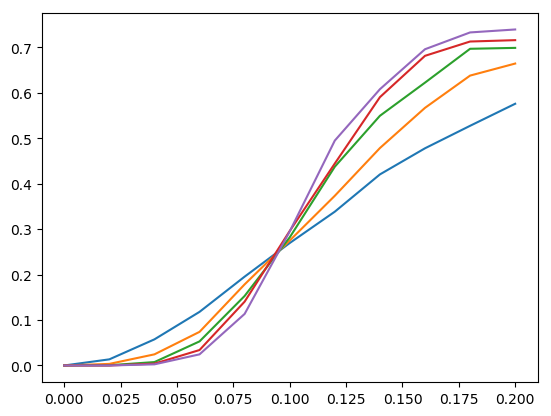

In [93]:
#pvec = np.arange(0., .5, 0.25)
import numpy as np
pvec = np.linspace(0, .2, num=11)
success10 = [];#[0]*len(pvec);
logerr10 = [];#[0]*len(pvec);
cnt=0;
#print(np.shape(successL16))
#p=0.2;
#successL16.append(Threshold(100, p, 5))
Lvec = [3, 5, 7, 9, 11]
#Lvec = [10]
logerr6 = []; logerr10 = [];logerr18 = [];logerr26 = [];logerr34 = [];
success6 = [];success10 = [];success18 = [];success26 = [];success34 = [];
success = np.zeros((len(Lvec), len(pvec)))
logerr = np.zeros((len(Lvec), len(pvec)))
np=0; nl=0;
plt.plot()
for L in Lvec:
    np=0;
    print("L = ", L)
    for p in pvec:        
        print("p = ", p)
        tempsucc, templog = Threshold(2000, p, L)
        print("success = {}, logerr = {}".format(tempsucc, templog))    
        success[nl, np] = tempsucc
        logerr[nl, np] = templog
        np+=1;
    plt.plot(pvec, logerr[nl, :])        
    nl+=1;
    
    #cnt+=1   
plt.show()

In [95]:
print(logerr)

[[0.000e+00 1.350e-02 5.750e-02 1.180e-01 1.955e-01 2.695e-01 3.385e-01
  4.205e-01 4.780e-01 5.275e-01 5.760e-01]
 [0.000e+00 3.500e-03 2.450e-02 7.400e-02 1.785e-01 2.750e-01 3.735e-01
  4.785e-01 5.670e-01 6.380e-01 6.645e-01]
 [0.000e+00 5.000e-04 7.500e-03 5.300e-02 1.530e-01 2.820e-01 4.375e-01
  5.495e-01 6.225e-01 6.970e-01 6.990e-01]
 [0.000e+00 0.000e+00 4.000e-03 3.400e-02 1.405e-01 2.960e-01 4.445e-01
  5.905e-01 6.815e-01 7.130e-01 7.160e-01]
 [0.000e+00 0.000e+00 2.500e-03 2.450e-02 1.135e-01 2.950e-01 4.950e-01
  6.080e-01 6.960e-01 7.330e-01 7.395e-01]]


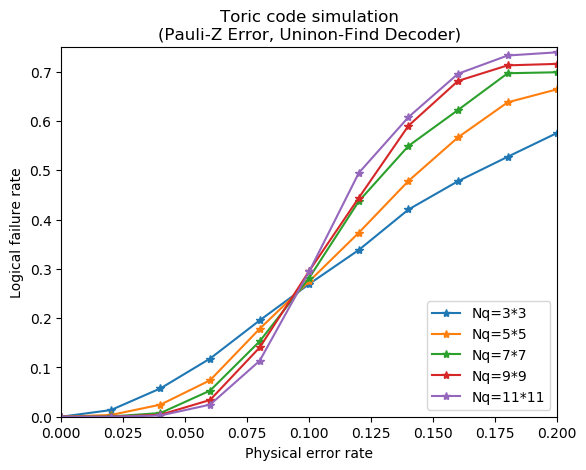

In [104]:
Lvec = [3, 5, 7, 9, 11];
fig = plt.figure(1, figsize=(12, 9))
plt.title('Toric code simulation\n({}, {})'.format("Pauli-Z Error", "Uninon-Find Decoder"))
plt.xlabel('Physical error rate')
plt.ylabel('Logical failure rate')
plt.xlim(0, 0.2)
plt.ylim(.0, 0.75)
# add data 
for nl in range(len(Lvec)):
    plt.plot(pvec, logerr[nl, :], '-*', label="Nq={}*{}".format(Lvec[nl], Lvec[nl]))        
    nl+=1;

plt.legend(loc='lower right')
plt.savefig('ToricCodeUnionFindZError3,5,7,9,11.png', dpi=450)
plt.show()    

#for code, xys in code_to_xys.items():
#    plt.plot(*zip(*xys), 'x-', label='{} code'.format(code))

L =  3
p =  0.0
successRate/Nsamples =  1.0
logicalError/Nsamples =  0.0
success = 1.0, logerr = 0.0
p =  0.05
successRate/Nsamples =  0.912
logicalError/Nsamples =  0.088
success = 0.912, logerr = 0.088
p =  0.1
successRate/Nsamples =  0.756
logicalError/Nsamples =  0.244
success = 0.756, logerr = 0.244
p =  0.15000000000000002
successRate/Nsamples =  0.576
logicalError/Nsamples =  0.424
success = 0.576, logerr = 0.424
p =  0.2
successRate/Nsamples =  0.37
logicalError/Nsamples =  0.63
success = 0.37, logerr = 0.63
p =  0.25
successRate/Nsamples =  0.322
logicalError/Nsamples =  0.678
success = 0.322, logerr = 0.678
p =  0.30000000000000004
successRate/Nsamples =  0.278
logicalError/Nsamples =  0.722
success = 0.278, logerr = 0.722
p =  0.35000000000000003
successRate/Nsamples =  0.26
logicalError/Nsamples =  0.74
success = 0.26, logerr = 0.74
p =  0.4
successRate/Nsamples =  0.274
logicalError/Nsamples =  0.726
success = 0.274, logerr = 0.726
p =  0.45
successRate/Nsamples =  0.28
lo

successRate/Nsamples =  0.23
logicalError/Nsamples =  0.77
success = 0.23, logerr = 0.77
p =  0.75
successRate/Nsamples =  0.254
logicalError/Nsamples =  0.746
success = 0.254, logerr = 0.746
p =  0.8
successRate/Nsamples =  0.24
logicalError/Nsamples =  0.76
success = 0.24, logerr = 0.76
p =  0.8500000000000001
successRate/Nsamples =  0.208
logicalError/Nsamples =  0.792
success = 0.208, logerr = 0.792
p =  0.9
successRate/Nsamples =  0.068
logicalError/Nsamples =  0.932
success = 0.068, logerr = 0.932
p =  0.9500000000000001
successRate/Nsamples =  0.0
logicalError/Nsamples =  1.0
success = 0.0, logerr = 1.0
p =  1.0
successRate/Nsamples =  0.0
logicalError/Nsamples =  1.0
success = 0.0, logerr = 1.0
L =  11
p =  0.0
successRate/Nsamples =  1.0
logicalError/Nsamples =  0.0
success = 1.0, logerr = 0.0
p =  0.05
successRate/Nsamples =  0.992
logicalError/Nsamples =  0.008
success = 0.992, logerr = 0.008
p =  0.1
successRate/Nsamples =  0.73
logicalError/Nsamples =  0.27
success = 0.73,

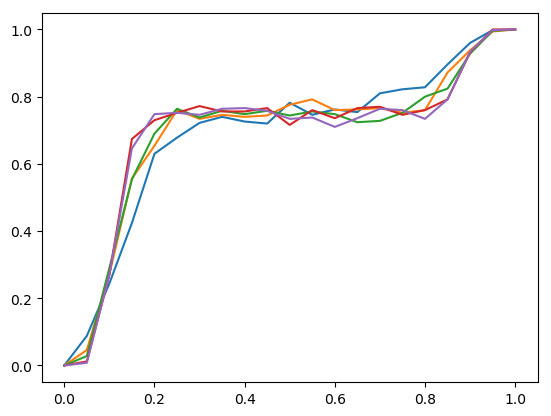

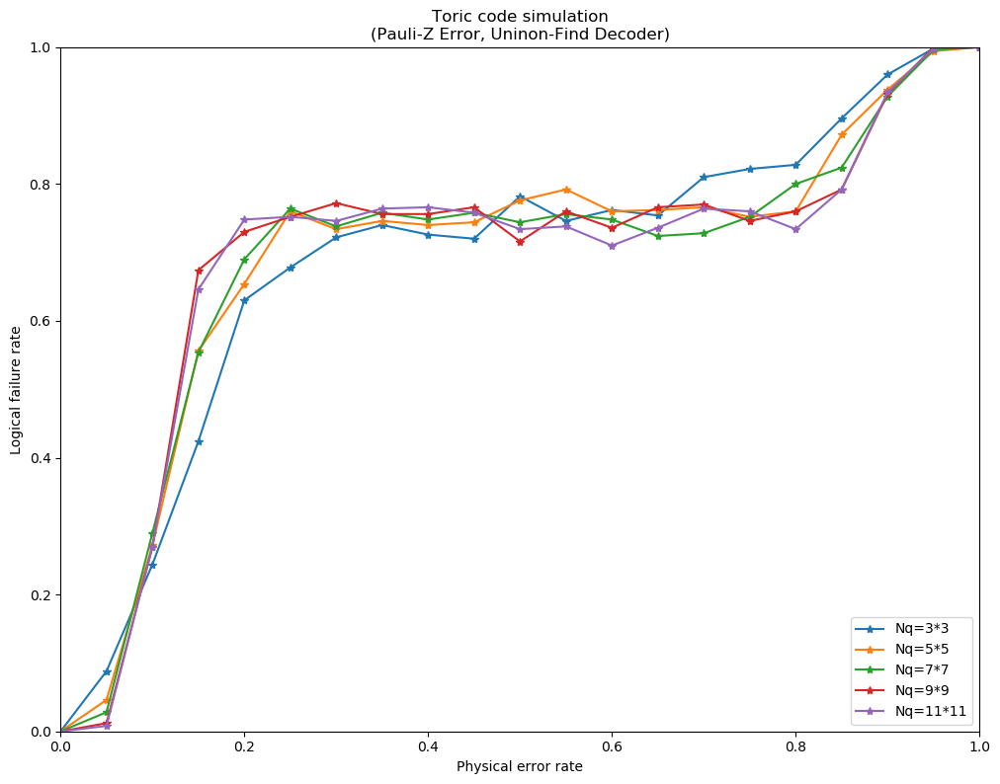

In [111]:
import numpy as np 
PMin = 0; PMax = 1;
pvec = np.linspace(PMin, PMax, num=21)
success10 = [];#[0]*len(pvec);
logerr10 = [];#[0]*len(pvec);
cnt=0;
#print(np.shape(successL16))
#p=0.2;
#successL16.append(Threshold(100, p, 5))
Lvec = [3, 5, 7, 9, 11]

success = np.zeros((len(Lvec), len(pvec)))
logerr = np.zeros((len(Lvec), len(pvec)))
np=0; nl=0;
plt.plot()
Nsample = 500;
for L in Lvec:
    np=0;
    print("L = ", L)
    for p in pvec:        
        print("p = ", p)
        tempsucc, templog = Threshold(Nsample, p, L)
        print("success = {}, logerr = {}".format(tempsucc, templog))    
        success[nl, np] = tempsucc
        logerr[nl, np] = templog
        np+=1;
    plt.plot(pvec, logerr[nl, :])        
    nl+=1;
    
    #cnt+=1   
plt.show()

success10 = [];#[0]*len(pvec);
logerr10 = [];#[0]*len(pvec);
cnt=0;
Lvec = [3, 5, 7, 9, 11];
fig = plt.figure(1, figsize=(12, 9))

plt.title('Toric code simulation\n({}, {})'.format("Pauli-Z Error", "Uninon-Find Decoder"))
plt.xlabel('Physical error rate')
plt.ylabel('Logical failure rate')
plt.xlim(PMin, PMax)
plt.ylim(.0, 1)
# add data
for nl in range(len(Lvec)):
    plt.plot(pvec, logerr[nl, :], '-*', label="Nq={}*{}".format(Lvec[nl], Lvec[nl]))        
    nl+=1;

plt.legend(loc='lower right')
plt.savefig('ToricCodeUnionFindZErrorPMin{}PMax{}Nsample{}3,5,7,9,11.png'.format(PMin, PMax, Nsample), dpi=450)
plt.show()    


RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00050480000100020000080080", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00904000010002000004010000", 98], "step_errors": [["00050480000100020000080080", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00100060000000080000800080", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["10006000000008000080010000", 98], "step_errors": [["00100060000000080000800080", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["94202241b40042001120880400", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["950004a80000440082400c0000", 98], "step_errors": [["94202241b40042001120880400", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["30001040021010000100204100", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["60080085100020212000000000", 98], "step_errors": [["30001040021010000100204100", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["80400008001280000800820840", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["c0000400128000080101084000", 98], "step_errors": [["80400008001280000800820840", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["4000000c101420000110090840", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["80000400140020011203044000", 98], "step_errors": [["4000000c101420000110090840", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00020050200010200420100400", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01004000000000241861000000", 98], "step_errors": [["00020050200010200420100400", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000020000040001810022400", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00002000000040004120004000", 98], "step_errors": [["00000020000040001810022400", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["0420000002020a000000010100", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["2800000202000a000000840000", 98], "step_errors": [["0420000002020a000000010100", 98]], "step_meas

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00080180000001000088020800", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["08018000000002008802080000", 98], "step_errors": [["00080180000001000088020800", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["08000401100214000084100000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["11000500020028008210000000", 98], "step_errors": [["08000401100214000084100000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["80440000109208000004000b00", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["c00804009200080002000d0000", 98], "step_errors": [["80440000109208000004000b00", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["10082002000008000001000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["28200200000008000100000000", 98], "step_errors": [["10082002000008000001000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00401000800400a00000402000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["40100080040060000040200000", 98], "step_errors": [["00401000800400a00000402000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["001004040110800008000c2040", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["11000605108000080200410000", 98], "step_errors": [["001004040110800008000c2040", 98]], "step_meas

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000100000041418200404000800000806080000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["040000010305080100004200000201820000000000", 162], "step_errors": [["000100000041418200404000800000806080000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000020800400042090030000500000040200c80", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000008100100010824006000140000008038100000", 162], "step_errors": [["000000020800400042090030000500000040200c80", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["008080000000820000004040800000004100002000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["085020008800080000811418c00000000400004080", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["d04002100020000104005280000000100000840000", 162], "step_errors": [["085020008800080000811418c00000000400004080", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["004010800008000700100020004000001001808880", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["80458200a044200040004001000000400502440000", 162], "step_errors": [["004010800008000700100020004000001001808880", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["40402c008818000004000020220260080080080000", 162], "error_model": "Dep

 [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["0580450000000038120400c0002001128018010200", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["1a1800000000807810000000800245001820040000", 162], "step_errors": [["0580450000000038120400c0002001128018010200", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["080040200000102001800000401002000800004900", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["100000000040800102000080800800200000c40000", 162], "step_errors": [["080040200000102001800000401002000800004900", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["400040000001004000000040200004088020000000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["040008040000001000000004000220000001008000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["084020000000400000001000088000000402000000", 162], "step_errors": [["040008040000001000000004000220000001008000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["2c10040089000408400416080000041002040a1200", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["78201a180060190010002a00000820200424500000", 162], "step_errors": [["2c10040089000408400416080000041002040a1200", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["100060100040005000540000000821221120802000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["802000100048000024014200040041040040024300", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["004000012000008808004210010410010010800000", 162], "step_errors": [["802000100048000024014200040041040040024300", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}


 RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6)

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000810000004802100000004200000010200842000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["204000000a04800000002880000004080108940000", 162], "step_errors": [["000810000004802100000004200000010200842000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["401400800080020205200002000600000000020040", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["d00200020004101880000800000c00000008010000", 162], "step_errors": [["401400800080020205200002000600000000020040", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["040064000000240100021008120000000002000a00", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["81800000000200000500000400000000880202000900000080800200004000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["83000000200000500000400000000041a01000900000080800200004000000", 242], "step_errors": [["81800000000200000500000400000000880202000900000080800200004000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["20000024000800001800000000000002000012000000000c00001000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["40024000400000003000000000000002012000000000c00001000000000000", 242], "step_errors": [["20000024000800001800000000000002000012000000000c00001000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["02082001800640641020008040002004001000020300100030004080801100", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["860861106000a13e000402008208000a800040240200030002080981400000", 242], "step_errors": [["02082001800640641020008040002004001000020300100030004080801100", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["1c20008000040004400038008000800e1002400020000220020c0040000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["384800006002202c8000000088080002240002000022061000040000000000", 242], "step_errors": [["1c20008000040004400038008000800e1002400020000220020c0040000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["7500c808000800600000508100401812800480000c40100000280080020080", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["99008800400600600880208411800022a870112030002001000000a0000000", 242], "step_errors": [["7500c808000800600000508100401812800480000c40100000280080020080", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["402000000040040a4082050400000024102000081102012040008200000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["804000040040a10900044c000000002a20010120401804c008200000000000", 242], "step_errors": [["402000000040040a4082050400000024102000081102012040008200000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["1008012440a20000a202018a000000880820822041002044010000004000c0", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["a002200020a00020860462000008004a00819003000200c002004408140000", 242], "step_errors": [["1008012440a20000a202018a000000880820822041002044010000004000c0", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["80010120402100800000000090008040c08080200000040000000048000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["88011800502001000004080008000048080100000040000000044000000000", 242], "step_errors": [["80010120402100800000000090008040c08080200000040000000048000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000011010000040310002040084000000008289000020180081000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["0000001000a050100000022000000008000008289000040140080805000000", 242], "step_errors": [["00000000011010000040310002040084000000008289000020180081000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["041008000c0004080040200000040202080400008402040040000000000900", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["888000c0004080040200000180180042400008202040040000000001100000", 242], "step_errors": [["041008000c0004080040200000040202080400008402040040000000000900", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (10, 9)]
self.code =  Rotat

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["10000020080000000001000000600008000002040000280000801000100000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["20020080000000001000000600000008002040000480c01002000100000000", 242], "step_errors": [["10000020080000000001000000600008000002040000280000801000100000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["11a000c410000010000040402020014a900000000004001400200010100080", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["6540810000010000040402020010004aa00000004000c00200010080400000", 242], "step_errors": [["11a000c410000010000040402020014a900000000004001400200010100080", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["8a400440600801100a000029000050811802114d0000000000140c008805000000800028c0081908028000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["9580608640000140580900040a00c5029c5980200000001d04200500000c0020000a3002064200c0000000", 338], "step_errors": [["8a400440600801100a000029000050811802114d0000000000140c008805000000800028c0081908028000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["01011400000000408800110218200001000000001100810800010000200c46080004500000808a00400880", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["4700000000102200044106040000400000000440004300004000760080010c010c00004020000405000000", 338], "step_errors": [["0101140000000040880011021820000100000000110081080001

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["8800a44001000002060081000001081002000034062402062000000042011c2008000001288000001a0100", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["b9040080000087801040000042040080000901a00068080c000009608808010000004a2000000080100000", 338], "step_errors": [["8800a44001000002060081000001081002000034062402062000000042011c2008000001288000001a0100", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["0000080208000000452000006001c010000004018c00000000504000040218010010022000000000008200", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["020082000100014800000601000800600260600000000014100001008000100100d8030000000041000000", 338], "step_errors": [["0000080208000000452000006001c010000004018c0000000050

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["0004000000080000811800000000420044000c000280000400008200000088004420000100400886000140", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["80000002000020460000000010e00200830000a00001000010800000240021080000407001100014500000", 338], "step_errors": [["0004000000080000811800000000420044000c000280000400008200000088004420000100400886000140", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["000001000800000c0000000100000c20208040008000000200000210040000000080c0064010401c00c300", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00200700500000000000201302080420100020000000800000840100000000204802500210010001400000", 338], "step_errors": [["000001000800000c0000000100000c2020804000800000020000

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (11, 4)

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00080000400008040010040000a00008000000000000000000000000400008040002500004000000100000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00101000010100040100001800020000000000000000000000001000020100008c00010000000400000000", 338], "step_errors": [["00080000400008040010040000a00008000000000000000000000000400008040002500004000000100000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["001010000808014800000a2a200000400008042a02c0001000140400200100010001000000000c00100000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["0450600090410080010a8c0620208000010180800042003501000800200540304000000003000200500000", 338], "step_errors": [["001010000808014800000a2a200000400008042a02c000100014

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["18000000010000000080004004010080000000100004000000244008200010400001008042000411005000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["30040000000000200010010040200000000000200008000910020800041000004620208187080810400000", 338], "step_errors": [["18000000010000000080004004010080000000100004000000244008200010400001008042000411005000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000040000800000000828302010000804100500010000020000400000019414180002000802000280", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000100002000004180000240084060021001800040000080001000000005060600008002009800000000", 338], "step_errors": [["0000000004000080000000082830201000080410050001000002

self.code =  RotatedPlanarCode(13, 13)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), 

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["28400001080001008103004000000004000080000015200000840020001010800000000002010040000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["5ce0810001202b40001000000001000020000000002a202080040064012030000000008040100000000000", 338], "step_errors": [["28400001080001008103004000000004000080000015200000840020001010800000000002010040000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["5800001800012000000800408008080080008000a80400008000011000001600204080000401000004f400", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["d005000048006000000040810000200020002a0000082000004400000400041020000100400000c5000000", 338], "step_errors": [["5800001800012000000800408008080080008000a80400008000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["022000000040040000001400000000000022200000510000000020030000000a0000000800000000020000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["04400010010000000500000000000008880000000062000010000000000280000002000000000080000000", 338], "step_errors": [["022000000040040000001400000000000022200000510000000020030000000a0000000800000000020000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["22200008200080100002200000080820004040000001300004008041080001000020002410400000000800", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["444208002004000048000002020e0020100000000002010010104200002000080009041000000004000000", 338], "step_errors": [["2220000820008010000220000008082000404000000130000400

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["012880a8040840000002020cc0c00000000000020480840040020022000000110240400000000001010040", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["22658000000900280041300000000000000081200000800380088000000240a00800000000004040100000", 338], "step_errors": [["012880a8040840000002020cc0c00000000000020480840040020022000000110240400000000001010040", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["18040002100100200000042a00000910101408040000420001080080000000420100000408080804020000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["b0008401c00400004109000402040005220100000041804800100000000880800001020202010080000000", 338], "step_errors": [["18040002100100200000042a0000091010140804000042000108

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["0000a400a00001000800280200120a1060004000402050160c104800810000501000010100300020008000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["30808403002000800000b01502680100a00010000023a34410003041000405000840000800100000000000", 338], "step_errors": [["0000a400a00001000800280200120a1060004000402050160c104800810000501000010100300020008000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["00000028400204000409a0000020010802100000250000001404000000000000a40002000005c000009810c401000000028000000800000400", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["0028400202000809c000c020001000200100210004000404000000000000a2000e001802100e408510a0015000c00180000004000004000000", 450], "step_errors":

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0000401080008000001003000c0000600000000000000400008018034400000c000040100008008004810100200042400000201000800e0280", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["401080008004000005000000000000c0010002000400008198000000480a000040100004010006010200400082400000201000800805000000", 450], "step_errors": [["0000401080008000001003000c0000600000000000000400008018034400000c000040100008008004810100200042400000201000800e0280", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["00010040002014040c004080000000000808200000020400000800052010018000104602020220410000000004045400001000000000000300", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["804000201204000040800000000008082000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000100280029080000100240000028004100010000004000040000000000801000108400408002008000040400000000002020000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000001003000010828004002800600240040800200000040000400000000008008002084004100010080000404000000000020200000000000", 450], "step_errors": [["000000000100280029080000100240000028004100010000004000040000000000801000108400408002008000040400000000002020000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["1000028800208000000000001c8408040208000000800001002000001000034404000010400000810642260001042000001000000800000080", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["229000108000000000000482380802080000008

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-1, 0), (1, 0), (3, 0), (5,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["28000045112000000204080000020100040028400c00013000000000100090208002400010220e000021008002010400040000881480200000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["504110c804400d0410003002000000002140019802000000000000006838a00160003022300002110300030100000c00090800000900400000", 450], "step_errors": [["28000045112000000204080000020100040028400c00013000000000100090208002400010220e000021008002010400040000881480200000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["01140400251100000680000004190030140000000002202050001004208a220042000000cb002000001400100a000100002142040000080000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["072c25190000010009000801000014000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["054000001010800040020004200003000081200040002188040080010080008000420802200500861000018000009000282410400000400000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["0a806810100100010004200002006281800080004008a70000018000000000c1108210850000110c020001008c000844308020000001000000", 450], "step_errors": [["054000001010800040020004200003000081200040002188040080010080008000420802200500861000018000009000282410400000400000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["00800000002002400000000000a040000084000000011000484000010008000000100020088000000010010000000100000084004040100000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["0100004002800000000000a0400000840000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["08000020000001000000080202100041100a0400130008000048022004000200080008000080040181200020800c00000b0004000004403800", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["1020000001000000080402020045101a0140000024002048022000000a000e0004000080040001148029800000000900020000044040000000", 450], "step_errors": [["08000020000001000000080202100041100a0400130008000048022004000200080008000080040181200020800c00000b0004000004403800", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000400000000000a68000008100000001000401030080002004802000020000000000005200000448042002000012008522560010020001000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000c00080002100908041800080000006010080

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0004004000240020000001080020c0000280800000080000001000000002000000060000080000840114600001004000800080000008040240", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["003500c00000002001080020c00002808000000800000010000000000004000d00100840000200000430d100000000000001000c0414400000", 450], "step_errors": [["0004004000240020000001080020c0000280800000080000001000000002000000060000080000840114600001004000800080000008040240", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0008000000980400008800600010000000100000004050044000400262044000000c0000000400210008802000000041401008122010000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["001000800444000000900010000000100000004

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0082400000200600062000000145000841100000010c2200000080000000000040900b01020000200020108c01800000000003002000604480", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["4104002000000a2000118100004440100000010c22000000800000000000411008010200004000d0110c024000000000030020000044400000", 450], "step_errors": [["0082400000200600062000000145000841100000010c2200000080000000000040900b01020000200020108c01800000000003002000604480", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0004000006020022041600001000000800000010180052800110021001004000034100000200000008020010010040000c0009400000040800", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000d00100c04042218082008000000100030004

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0001008100300000200800001804026000000440800420840014021000008040c014000000040008000000200280000040a080020002010000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["809900000000200800000004320000c0004088042082000002200000604000140000000400080018001002400060200040c380010100000000", 450], "step_errors": [["0001008100300000200800001804026000000440800420840014021000008040c014000000040008000000200280000040a080020002010000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0440010400001103000020000820083010000000b4020510010000100000001200000980000010c01410040000009000520100000080000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["0d801809d9009000981100040000000020008b8

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["004040028400002008042000208080040000040000014040004000202000446000802000c02020004a0010144402008200c0020200000a040c00900080200001184022110800900040", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["808f10008080101100004202001000001000000500800000000080210e098dc0400200000020919943020fc0000a02008888402008004013800d00818004a08108850004d004000000", 578], "step_errors": [["004040028400002008042000208080040000040000014040004000202000446000802000c02020004a0010144402008200c0020200000a040c00900080200001184022110800900040", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["02010048004400000040280020000104020014400800a4800182012020002000000004c000018004002200000000400020000082010

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1, 13), (3, 13), (5, 13), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["08121000001840009610000210001c00040000002004800103080005082000b080000000040108001200e2200320908180200e20000080040000000001844000461000100000020000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["50240001003200204c380000480010000000800a00100c0c000421040200000100000000300420060a84cc604209608008800002001000000000000904810400100010200010000000", 578], "step_errors": [["08121000001840009610000210001c00040000002004800103080005082000b080000000040108001200e2200320908180200e20000080040000000001844000461000100000020000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["000100000400200a8008002044100880000011100001000280020200000004000020000080080050001018045000003020080040100

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["001011002104c00102046003003000064080000000a008080040000002000a000a040000010800801082200309020801801800032a4008800400064484300102000025200002044000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["c420441480180806000020a00829010000000400228001900020100044001810000000000008249084c02008220000850000308016001200181209c0090419011860c0001104000000", 578], "step_errors": [["001011002104c00102046003003000064080000000a008080040000002000a000a040000010800801082200309020801801800032a4008800400064484300102000025200002044000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["1414000000040000000400002a220200014000003000100100c4020002000000004000208a02000020020000a002000001210000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00a00880880400210808c0008088010800203204091000000008010050080004004000241050104044800001040430004044c184000808001400000404048000000402020001000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["43c21130001210100002062000200080d01028400000001004014020001000800050000001a0ac0080e248020408011005100058404460240004100000070008080400040000000000", 578], "step_errors": [["00a00880880400210808c0008088010800203204091000000008010050080004004000241050104044800001040430004044c184000808001400000404048000000402020001000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000182088105020000000200500409100400414000280000200000009400100040028020040480000880880002000110080054c802

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0080004020006000020880100001420010004100284000000105488028000105000022204000000410007000100040080040850000002084048020000002a0500418108a8100411400", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["020040000001082300408002c8024001820084400cb80218c100500404080008888200004010200040008001002001020c000c00821012008000000d014430024a1800000050000000", 578], "step_errors": [["0080004020006000020880100001420010004100284000000105488028000105000022204000000410007000100040080040850000002084048020000002a0500418108a8100411400", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["001008010000004080200800020000000400000060000a0401812000000010000014020000080482800000004240040040000008000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["1000021030080000000000010804060100010400809400000a04000000000080001000400010008008040000000004208002420000000000404a102140000014020010000020000500", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["d02024080c0c0000001a20010013100800020c506080181000000000020000400100000002202010000000001084000a08000000000101304089006000600800400000800014000000", 578], "step_errors": [["1000021030080000000000010804060100010400809400000a04000000000080001000400010008008040000000004208002420000000000404a102140000014020010000020000500", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000040000000440028002018000100010004400000000002900200001d008000240211012000000000280a00140010040204800080

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["000008028000000008a0028000002080030008200040100108240040000000008200100000000401400100000410003001000000008000000060000000020020000000000000100000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["200f00008000048001000600810009002200004040a4209001000004000188018000000028050004000009c000000200000002000000000000c0000800800000000000004000000000", 578], "step_errors": [["000008028000000008a0028000002080030008200040100108240040000000008200100000000401400100000410003001000000008000000060000000020020000000000000100000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["420400808080804000002d0404180600000000000080800001e00900080002888000000121000000012c40000801060200050200080

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0001080000020e0082000000200042088004040401050d108080000040800004220100000002840402002400400a001010002000400000120092cc8802402000284100031340801000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["20020008200204018006200220221016181480100826020a000202000008880800000000081284009001002800404001000020011030921104130c0103000102500c03024140000000", 578], "step_errors": [["0001080000020e0082000000200042088004040401050d108080000040800004220100000002840402002400400a001010002000400000120092cc8802402000284100031340801000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000008104020800000000000200000000010180002040010000002130021060010100008008004081010400000000430900000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["30000280600200000040040080200210008000a82008000000000600000040002000400018000142b8080404402000004010000a202000040004000000000000810020040000210000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["7200440882001000008200c008000040020080100000000000000c0100008001000000002b0c80c11000010900c200400030808c001000100000000000020400801000008400000000", 578], "step_errors": [["30000280600200000040040080200210008000a82008000000000600000040002000400018000142b8080404402000004010000a202000040004000000000000810020040000210000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00404000001103c00010210000006408000010c108400000000002085020001000000180002000008008a7c50000108010007004000

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1, 13), (3, 13), (5, 13), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["02000000806008000200c0000108000000820800400014030000000001000000083010002100000050104400101000000086000000400084a000100100601000008201000400000280", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["0402400000c60000040004200000010820008000900c000000000400000020c04000000062011041100040400000021800000080021300008004000040c00208040010000014000000", 578], "step_errors": [["02000000806008000200c0000108000000820800400014030000000001000000083010002100000050104400101000000086000000400084a000100100601000008201000400000280", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0020000080104041000000484200041002040510a402013100002022200001008100800000000001410820008000402420000200010

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["400002000000004210820440008002040004000400001000080000100000400040000000200001008001002129400020004011000002000040800c0004000000180000082000006000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["880000000110140422000200081000100010000040002000002000210009000000000000240200040104a4400040010044000008000102003000100000000000302080000000000000", 578], "step_errors": [["400002000000004210820440008002040004000400001000080000100000400040000000200001008001002129400020004011000002000040800c0004000000180000082000006000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["80000000000880000000000000002140010002100000028420808a480900000000100200400000000020001810000020000010204080000000000000104007a0048080080080000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["800000220000000000000400810001000aa000101207118801032800000000400800000040000080006040000080000040810200000000000000410001001c42070000100110000000", 578], "step_errors": [["80000000000880000000000000002140010002100000028420808a480900000000100200400000000020001810000020000010204080000000000000104007a0048080080080000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00020001000400008001000000005010a000000402300000000104020400c0000400000000000008008240000000000000012842210

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["40180009001000280c1080000080200000210200002002002200800500000810000100004001201808000000000008000088080000060c000000c04000001089000000280010000002000000080000080000000000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["80a019060180000800200801000002102000020020022008005000008080004000080006000200301000000000000700803000612000300c0200014108a00000028001000000200000008000008000000000000000000000000000", 722], "step_errors": [["40180009001000280c1080000080200000210200002002002200800500000810000100004001201808000000000008000088080000060c000000c04000001089000000280010000002000000080000080000000000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00102000812008040200010418000000000000408600000010040010810000001040000006200000000004000010001040401a012001000002040000001c0400040001880000008040000000300020002003100401000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00385401008010001040000030000000040800000a010080010810000001000000806200000000000000080000240421a0110010000020400600010040004000188000000804001800000002018200008040200000000000000000", 722], "step_errors": [["00102000812008040200010418000000000000408600000010040010810000001040000006200000000004000010001040401a012001000002040000001c0400040001880000008040000000300020002003100401000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["2e010100080490000808040000020a00004080844000480800000000000000000002008801040004000284002011408080004048000000220000000500016000602082200000000001000020000200000000880000400140002000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["52fd020088302e404c2618206480051804000613800300080000000000018020470001a00202000000010800002a9904c8400000022000000028001900021a0821000000000010000200004000720000c000940000000100000000", 722], "step_errors": [["2e010100080490000808040000020a00004080844000480800000000000000000002008801040004000284002011408080004048000000220000000500016000602082200000000001000020000200000000880000400140002000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["210280000404000480001c0204004c40828000414908a21000001000044004104100600000000000002401040800814000008210020000040082080600010000208484510000000080100002000080300800000000101200820000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["4305004008480040402e7001040888000014880a2208000000004400410410000000c004000082401040800000009a883a0045000d0004108000000400011048461000000008010000400004030080000006010000080400000000", 722], "step_errors": [["210280000404000480001c0204004c40828000414908a21000001000044004104100600000000000002401040800814000008210020000040082080600010000208484510000000080100002000080300800000000101200820000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["01030400400040000800400909009a0000002000001000102000000000a0040080100000002020800000029010008188000000000004006004a0c044805000148002008100408000000040400940000000801801c0000000480800", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["42060004c000804400e0900120009002040000000102000000000a0020080980009002040800a000150100000060828000000020000c24aa1084c0000008001008100408000000026400200010860c0ea0e4041887001000000000", 722], "step_errors": [["01030400400040000800400909009a0000002000001000102000000000a0040080100000002020800000029010008188000000000004006004a0c044805000148002008100408000000040400940000000801801c0000000480800", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["208004001810008000220100004004000450220100420200284004000040860104200011000000000000008000104002000e080004241100400000000042281001002101004420120000a001100214000900000000200000400400", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["81000100200000201020040120000e8221000404200004001000080e0010918002a00000000000000800000000010084c00d322120080000008004148100a802009006320090002200140020800090000000020000040040000000", 722], "step_errors": [["208004001810008000220100004004000450220100420200284004000040860104200011000000000000008000104002000e080004241100400000000042281001002101004420120000a001100214000900000000200000400400", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["088044290000000800000000900002000000000000000000200010080030c000200004c01002400800000880048c44025484020020880000000000000080200000000140100000000000590002100202200841200002902448c000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["3390cc0008800040000080011000000000000000000200011880001200004000020108060002400918008000002226430e010b40000000000000080200000000140100000000000268012000600211001037000802415400000000", 722], "step_errors": [["088044290000000800000000900002000000000000000000200010080030c000200004c01002400800000880048c44025484020020880000000000000080200000000140100000000000590002100202200841200002902448c000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["081800100000100001480100000100020c002102800000883881800020210c0000449450000080000010001000000800000004400000a000000800000000001081480800048000c000101084000802422800046000002810000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["113000010000144010000011002080040028c40008020808300002108000084945000004000001000100000000000800420000ca000000800000000001101483400048000c00010108400100240b000312180c0000805050000000", 722], "step_errors": [["081800100000100001480100000100020c002102800000883881800020210c0000449450000080000010001000000800000004400000a000000800000000001081480800048000c000101084000802422800046000002810000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["08810108000085011400140002800000000000000000000000000100002100000000000008000000028000001400008080001200000000023401800020020008000000000000000082820400001000000000000c00008009000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["1e0202005030400280002800000000000000000000000000080001100000000000008000000028000001400000100082200000060023800000010010008000000000000000082820400001000000000000c0000800880000000000", 722], "step_errors": [["08810108000085011400140002800000000000000000000000000100002100000000000008000000028000001400008080001200000000023401800020020008000000000000000082820400001000000000000c00008009000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["10000000404180014000001440098040002000228000000400000008c202200000288000101000001000004001000200202020010005000008205000200016080144000008008004544100100004100008000802000a0200300400", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["200405e0002b180004238031140c80000208000380000988005a40212c00019000020104000600010400280000020002005000580000020310032400c260218401400040104a401000000000800880000240080c21090000000000", 722], "step_errors": [["10000000404180014000001440098040002000228000000400000008c202200000288000101000001000004001000200202020010005000008205000200016080144000008008004544100100004100008000802000a0200300400", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00400000002400480010001000000000000000020000000000010000000084080040002081000400040002000000108201001000040000041000800000448000800005000021000000203440000200003000810200020001000100", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00801440004000000120000000000000002000000000000800040008a0801800018810004000400010000000002028810000400000210004006004440008000030000e1000007c034a200004000000081020002000080010000000", 722], "step_errors": [["00400000002400480010001000000000000000020000000000010000000084080040002081000400040002000000108201001000040000041000800000448000800005000021000000203440000200003000810200020001000100", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000125801208000028100010000000000080000000420000084000000880000540081020304800b800080001040000c24001020010140800084000800080410000004100520008000004002302800428000828047c0", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00001e0000820041000c00d01000900000000000800000004200000820001008840003a0095440010400880000000182000004400042004014040008400080004041000001a1001000002000e0181000000406000c080500000000", 722], "step_errors": [["00000000000000125801208000028100010000000000080000000420000084000000880000540081020304800b800080001040000c24001020010140800084000800080410000004100520008000004002302800428000828047c0", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["240000440848808000180140000080004200000000100001820801108002015200400000111003010900041000101000220004000000000000000041901000000040000040450480880801002000200500008000a0000000082000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["7a2088440801804024200008000420000000008000102081108838100a2000000080910000108800020008000024080083000000000000780416010000000400060404904808808010020182006000680006000000010400000000", 722], "step_errors": [["240000440848808000180140000080004200000000100001820801108002015200400000111003010900041000101000220004000000000000000041901000000040000040450480880801002000200500008000a0000000082000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["02008000004400810000a0010100402060490020019000001000004004008000500008148000020504810200080900440001200040004000008080a2103004001102840080000002201200440020040002000000828200c1000400", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["0c010440080800488000200005869c6005000000030100000400401000000100411000034050441010008000005200e000113e013820c5141203000400000048020408200120012024440180c00e180041084600002c0044000000", 722], "step_errors": [["02008000004400810000a0010100402060490020019000001000004004008000500008148000020504810200080900440001200040004000008080a2103004001102840080000002201200440020040002000000828200c1000400", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["10400001000000400040180200810001080420900004284000120000800040042000000000000200000028000008200000802008000120040500501000040200480002102000000000000000021002100800002190000014000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["20901000000004000020201003108042050000428200018000640008004200000000000020000002800000000008300202000024003890140082404010028600204200300000000000002100210080000219000001400000000000", 722], "step_errors": [["10400001000000400040180200810001080420900004284000120000800040042000000000000200000028000008200000802008000120040500501000040200480002102000000000000000021002100800002190000014000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00080000020000140000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["08000002000014000000000000", 98], "step_errors": [["00080000020000140000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00020200001000000180000800", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01020000100000000300080000", 98], "step_errors": [["00020200001000000180000800", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["001200002a0000082000260200", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["1100002a000010100020080000", 98], "step_errors": [["001200002a0000082000260200", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00020400000000000309001000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000800906040000", 98], "step_errors": [["00020400000000000309001000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000041000200002000000100", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00004100020000200000010000", 98], "step_errors": [["00000041000200002000000100", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000008004000400404200000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000400008040040220000000", 98], "step_errors": [["00000008004000400404200000", 98]], "step_meas

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00200080040000501040421000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["200080040000580001400c0000", 98], "step_errors": [["00200080040000501040421000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["0e002000020204003000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["10180002020018000000000000", 98], "step_errors": [["0e002000020204003000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000410000000000009004000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01000020000000000900400000", 98], "step_errors": [["00000410000000000009004000", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00020041102000010020881000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01004500100000804044080000", 98], "step_errors": [["00020041102000010020881000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["6020800061880000408020c480", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["80400001088000204040050000", 98], "step_errors": [["6020800061880000408020c480", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00041101400181830804000040", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["006002c0810042113004084000", 98], "step_errors": [["00041101400181830804000040", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000200a40000000000520000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01000344000000000052000000", 98], "step_errors": [["00000200a40000000000520000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["1189808000000084c000000080", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["39808000000042300000010000", 98], "step_errors": [["1189808000000084c000000080", 98]], "step_measurement_errors": [["000000000000", 48]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00011000001000000800100840", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01100000100000080010084000", 98], "step_errors": [["00011000001000000800100840", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00028000000400044000000200", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01800000040004400000040000", 98], "step_errors": [["00028000000400044000000200", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["01000000000c88800000001600", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["80000006008048000000080000", 98], "step_errors": [["01000000000c88800000001600", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["0901000000000040806a8480840012000020400340", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["16000000000480a19a000a90004800010020850000", 162], "step_errors": [["0901000000000040806a8480840012000020400340", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["810000010c0800001142406004000204000008a000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["82000408220081810a0020a0100810000044d50000", 162], "step_errors": [["810000010c0800001142406004000204000008a000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000800004001000010000000010020000010000", 162], "error_model": "Dep

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["480000000000000020032400400000000020008000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["900000000000009800002900000000008002000000", 162], "step_errors": [["480000000000000020032400400000000020008000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["0081000000040208000001400401000a0024004080", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["05000010000420000000029004004430880c840000", 162], "step_errors": [["0081000000040208000001400401000a0024004080", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000040040000000410000000208001000040000000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000403000800000000000000000000001000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000080000200000000000000000000000400000", 162], "step_errors": [["000000000403000800000000000000000000001000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["002040000000400700000000204000002042000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["804080000104000802000081000000810800000000", 162], "step_errors": [["002040000000400700000000204000002042000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000000108004049000010000001840000", 162], "error_model": "Dep

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000600000000010400004102000202020004000040", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["180000000004100000004c00100404001000010000", 162], "step_errors": [["000600000000010400004102000202020004000040", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["0800040c8000100800006400000800000804000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["104800008000000802006800100000402000000000", 162], "step_errors": [["0800040c8000100800006400000800000804000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["0000110c0400000200081000088000101001001400", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000400000100010000000000200000800400", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000100004000004000000000080000100100000", 162], "step_errors": [["000000000400000100010000000000200000800400", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000001010200220000000020001021001100000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["0000000000a0008000000008000404400440000000", 162], "step_errors": [["000000001010200220000000020001021001100000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000181241104000000000000401208030000208000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["0912080420801040000000c0010080040304060840082080010020a0800000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["b31010042680908c1001804004000020400108308408c010020a0800000000", 242], "step_errors": [["0912080420801040000000c0010080040304060840082080010020a0800000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["40000005010200000010100100000400000002840000000000400080000200", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["81806010200000010080200000400000002840000000000400080000400000", 242], "step_errors": [["40000005010200000010100100000400000002840000000000400080000200", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000100000000608240000800002000008080000000104220012400000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00100000000008840c00800002000008080000000104220612800000000000", 242], "step_errors": [["00000100000000608240000800002000008080000000104220012400000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["2050200000040204000001400001481008108080000102000400a001108400", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["c2800000402040000004020014800040e8380180202000400a00090d400000", 242], "step_errors": [["2050200000040204000001400001481008108080000102000400a001108400", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000200004080025000000011040100000000040040040000040008820080", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00100004080021008004001000180000000040020080000040004840040000", 242], "step_errors": [["00000200004080025000000011040100000000040040040000040008820080", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["8000420800000000000810018088000c080104004002000004000080000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["821040000000181c0480b00200c80040082008002000004000080000000000", 242], "step_errors": [["8000420800000000000810018088000c080104004002000004000080000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}


 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (10, 9)]
self.code =  Rotat

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["a0800001000800400000008000080050404100000000200001000004064100", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["c1001000400400000004000080000064880000000200001000002008040000", 242], "step_errors": [["a0800001000800400000008000080050404100000000200001000004064100", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["40000000002000001000108000809030000000020000000004004400000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["80000002000001000104000809000000000020000000004002400000000000", 242], "step_errors": [["40000000002000001000108000809030000000020000000004004400000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["002020100020205104100a004000000080000000101088c20a858000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["024118000425d0408080000080080000800001016480c09458000000000000", 242], "step_errors": [["002020100020205104100a004000000080000000101088c20a858000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["20000000080200200000081000000000000000100000280100040000004840", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["40000080200200000081000000000000000100000300200040000005040000", 242], "step_errors": [["20000000080200200000081000000000000000100000280100040000004840", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["000840008045208020006240400204800220000020900000001120a0010040", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["840009e41000208236040000904000220000020900000001120a0008040000", 242], "step_errors": [["000840008045208020006240400204800220000020900000001120a0010040", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["40002008210000020000040020000000001000008000010004000011000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["82108010400020060080020000000001000008000010004000011000000000", 242], "step_errors": [["40002008210000020000040020000000001000008000010004000011000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["000000121002100020080004000840200100000c0020021004000800048400", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["000120801100010080004000840000480a0000020020804000800028540000", 242], "step_errors": [["000000121002100020080004000840200100000c0020021004000800048400", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["0210010040000000c008000008101001000008200600006004000005081800", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["8400000000000800000000810100000200810020000000800000308c000000", 242], "step_errors": [["0210010040000000c008000008101001000008200600006004000005081800", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00200010000000004000822804000000100000400000800000010022018000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["0041000000000000902600b000000000200400000400000010022000000000", 242], "step_errors": [["00200010000000004000822804000000100000400000800000010022018000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["01000023100020000000000000c02000020001000010000010020000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["03820100020000000000001401000020001000010000008010000000000000", 242], "step_errors": [["01000023100020000000000000c02000020001000010000010020000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["80400001000400001000188000400400300840005100002018002200080060000000300208084420002040", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["8080400100000400002030100080060220001440000800401280cc00080100100b00040021000050100000", 338], "step_errors": [["80400001000400001000188000400400300840005100002018002200080060000000300208084420002040", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000000020810004200400200300001008a00000040000000010418010100200100000090404100000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000102080001009c01000000002021800000000080000041060040401000800600140810800000000", 338], "step_errors": [["00000000000020810004200400200300001008a0000004000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["1810410010002a008220000040012842100102080005202000008004000010000800009480008401140000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["2010000031800088000010002a6c6000808100000004200010008000040001000025200020804880000000", 338], "step_errors": [["1810410010002a008220000040012842100102080005202000008004000010000800009480008401140000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["08009801000c00000000000000000000009040010014900e0040060000800000000014600080080008a000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["3000100000000000000000000000002410004000002b401001800020000000000500008001000250000000", 338], "step_errors": [["08009801000c00000000000000000000009040010014900e0040

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["000a40001000008008011000400502018000c0004000052000080000400400040000800080800050002000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["90100400002004004c002811600086008000100000480802000010010001000020002021800000d0000000", 338], "step_errors": [["000a40001000008008011000400502018000c0004000052000080000400400040000800080800050002000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["0400040002000020004c04410a000040042000000002240200000020108025008081100032010200080000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["09000080000800120100220302100108000000000002c80000100500002008408680008040800200000000", 338], "step_errors": [["0400040002000020004c04410a00004004200000000224020000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["a010000244140000080001a0800000000000000002d0000000200240001002001000000004000010004100", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["a03011870008024004100400c0000000000000a00060000800900004010008000000010000020040400000", 338], "step_errors": [["a010000244140000080001a0800000000000000002d0000000200240001002001000000004000010004100", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["20000000814000800000401140400000400420000030100000118820001004210880000000200200000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["4004201001c001005e00201c00000000080800200000200452080002013841200000000800800000000000", 338], "step_errors": [["2000000081400080000040114040000040042000003010000011

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["10010000008000002200080400000400000000101408048000000000201081040102000002000000100800", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["60040000010000802200001000000000000005200030080000001004802200408000008000000404000000", 338], "step_errors": [["10010000008000002200080400000400000000101408048000000000201081040102000002000000100800", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["20004000000003800000201e80000820080011000810000008000002800000000000000400040001000400", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["50040020000001000000000302080200042001000060010018006000000000000001000100004001000000", 338], "step_errors": [["20004000000003800000201e8000082008001100081000000800

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["2002000101000000101001c080808000000007020010802004800000000008009000005086220802800000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["c004400000000402004020102000000000408c00003101100000000004000c014018200888009000000000", 338], "step_errors": [["2002000101000000101001c080808000000007020010802004800000000008009000005086220802800000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["01122000093000000080020000000003000c1008000083400004180100200011100008400000200a001480", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["93d6b20000000020008000000000a00004010000006881210900a000803844000210000010022000400000", 338], "step_errors": [["01122000093000000080020000000003000c1008000083400004

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["800000040002130400040000008400000040000000002000260000400001004000000900000310000042000000050000040008001900000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["800100081304000400060088000000400000000020002600004000000042000009018000100000420000000500000400100025000000000000", 450], "step_errors": [["800000040002130400040000008400000040000000002000260000400001004000000900000310000042000000050000040008001900000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0200200a0020000000000a0000502000c000000800000000800020000004000003100000800084000008001060000100000000004000100000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["24090020000000000a100010400000000008000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["004520002000010000040010a00022000200000400000002011000001012d08001400000a00000081010911049000822400810010000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["a0882000010000046010600022000200000400000002011000000000695a02800000a00000081008f0a10c0304225808200100000000000000", 450], "step_errors": [["004520002000010000040010a00022000200000400000002011000001012d08001400000a00000081010911049000822400810010000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["40200000008000600000040c02003130002000000800004600000000001000000040003004080201014010860c000100000010830200050800", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["804000800000012606001800023000200000080

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000004210040000000010400000a00000102002202800000001000008004020000200000080000000091204800010001410402004049000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["04210040000000010400000a00400002002202800000001000008000020800200000080000000091202800010000a100220800400014000000", 450], "step_errors": [["000004210040000000010400000a00000102002202800000001000008004020000200000080000000091204800010001410402004049000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["004400001000000040040000002000000080010000004200000000200022040500000200200280000014000000000080000021000000001000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["008810000000400400100000004000000100000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000800080000000000110020041030800401000001020210040088000004000000001000010080000200044800208000808300000a00040000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["0018000000040001061010100001828208860808041c6e00040080000008000010000080830002000428004100c20100030004000800000000", 450], "step_errors": [["000800080000000000110020041030800401000001020210040088000004000000001000010080000200044800208000808300000a00040000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0030092500800080000000a4242100d00000040000000000000001000018001000000040400000121210004804000000000000040000008000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["095100880080000000842401001000000000080

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000008000000000c00000000400010000200000000101000000100000800040300040004000000002c00088040000000000808028000800000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["080100020000000000004000100002000000001000002001000000000c0280040002000000002c000880400000000009880000020005000000", 450], "step_errors": [["000008000000000c00000000400010000200000000101000000100000800040300040004000000002c00088040000000000808028000800000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0004000032000000001000000a000001000200040800000002000a00010200001c000000000000200500000080010002000000000300050000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["180802000004000000000a00000080010004080

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["040000000f000000240000b8000000080000000082100000005000000040200005000008020020110000000000400000480080008020000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["0fe000d8004024800000009000280040019880a003600090000000002080050000080200200900000000004000004800800080200000000000", 450], "step_errors": [["040000000f000000240000b8000000080000000082100000005000000040200005000008020020110000000000400000480080008020000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0000000410000000000800200d00000800000a0010002000080000000000000200000000004480100400000000080000080000010000004000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000010080004000000100d0006080a000100000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0200000000001802000000500001000000000000020000080840000800000020000004030000a8280000800000000220000000000220110000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["040000001802000000100081000000000000020000080840000800000020000002031400802850004000000002200000000002200900000000", 450], "step_errors": [["0200000000001802000000500001000000000000020000080840000800000020000004030000a8280000800000000220000000000220110000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["c00200802080004000000000200000000000204000000800000001802000020050400000000840001000000a00001000418004100000208000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["808420e00080000000002000000000002040000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0004800008000824000002008000000400084000108000240804000044020c0000000e50004009002000000100022000084040020402000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["80080800082400000200800000040008400010800024080400000000438404080040020014001c0000008001207e0942420000000804000000", 450], "step_errors": [["0004800008000824000002008000000400084000108000240804000044020c0000000e50004009002000000100022000084040020402000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["002420000440200000500020000008080000000042001080000100000002004002600000882000101000040400000000200008400000000800", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["204804402004004000100000080800000000420

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["00000800008000421004401001320000000000004000000a4000000000000000004000000a0020002000000000000000000000050000000200", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["0800008000421003c0010108000c000000004000000a4000000000000000004006000000340010000000000000000000000500000004000000", 450], "step_errors": [["00000800008000421004401001320000000000004000000a4000000000000000004000000a0020002000000000000000000000050000000200", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0021041020031b000100822000000000204201000000410000502081000000000000898400804110c800000000004000000020000020100080", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["844940482580020082100000186010020100000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["084802400000024010040000001800ac000801020020001042000080001000010000840004204030200001800002002800000042002600010010000021000040400000000001400200", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["199000000900001020000000028000200208020000810800020000440000000110000000088080000000030800a0000001080080000800200000840001010000000000028015000000", 578], "step_errors": [["084802400000024010040000001800ac000801020020001042000080001000010000840004204030200001800002002800000042002600010010000021000040400000000001400200", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0001000005600000002200000022000020080000b010000000000020200502020000000000008100002000020200040000110100000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00004000000118000000ac00210000000280000000a0000600030120004064081440122400242000000008000820540012800000104000001018020100818090002030000a00081200", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["800000020003100320002400300011000a0000400080060001800200104088b0445000006028200010002080d0008a0000004080600010182010098c01828080600000005450000000", 578], "step_errors": [["00004000000118000000ac00210000000280000000a0000600030120004064081440122400242000000008000820540012800000104000001018020100818090002030000a00081200", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["200000000004004010000100000c080000400000090000842000400a004020400008208100108c18000000200000000200060000000

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1, 13), (3, 13), (5, 13), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["20000200008200000012400100001040003020000400000040202000000003000041200000000580000000000009000000000820000b00800241000010101100080000840024000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["4800020800000051000800004080000080001000000080802000280006000200800200001000030000000024000000002080002c02000904000020400c0004000e1000900000000000", 578], "step_errors": [["20000200008200000012400100001040003020000400000040202000000003000041200000000580000000000009000000000820000b00800241000010101100080000840024000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0400008000000000002020100890100410084040002000000000480000000000c010000002000000800008400010100004480802000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000800408000020040000800000000000290002200020844282040800000a102008801002000000000044100200000000101000000080020020100241410004000004080010000800", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["0011600020801000020004000200004200040000c3892b041f20000030408c210040000002000001104008000000004040000002000800804011030803100060101000400040000000", 578], "step_errors": [["0000800408000020040000800000000000290002200020844282040800000a102008801002000000000044100200000000101000000080020020100241410004000004080010000800", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00150800002000400408000000000000002000000300820000010010010001000004000000ae8000000000210204a00804080000009

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000001000080018d000000040800002008000000200000001840102830000101000000200004008000000000800000020608010000000500102060000c2008040000008080", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000020001000634000000102000008020018000200030018081306018000804000000800010020000000002000000080020080000000a0048006240a020104000300404000000", 578], "step_errors": [["00000000000001000080018d000000040800002008000000200000001840102830000101000000200004008000000000800000020608010000000500102060000c2008040000008080", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00008008080010000004a010401200008000460000000400108180080000021c1000020000004024000000000000c04800800200400

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["000040000100008020000030000010010008100000060190040000200050000100021000000000040080002000000011000020400000022040010080000000100804008080010d0000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["8000040002008180000000004004002040000040000c130001000184000000084000000000100200008000000044000081000000084100040200000000402010020100045400000000", 578], "step_errors": [["000040000100008020000030000010010008100000060190040000200050000100021000000000040080002000000011000020400000022040010080000000100804008080010d0000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["508000400108040000000405810041000220400000008081000010000040004000000008000000000080100000010002c0c02480041

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00001000080000002000040004804240400004040921400020300000000000204e00800022020000048000801000020102402120000002002028000000080000000000002220420000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["200010000000900000000200808040c150091a48008000904029c00280801801f000000022021400010020003404108088400000080080a00000002000000000000088809000000000", 578], "step_errors": [["00001000080000002000040004804240400004040921400020300000000000204e00800022020000048000801000020102402120000002002028000000080000000000002220420000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["080000004000840000008100000000018008109008001000110000100000000400000c0004000000000042000000482000000000004

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["08000001044000000210001800000010800000200003800008210222400180284210050000000008020001000100100c000400084000001000014004040080018000c0142108028100", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["1004108000c00820005000000042018000a000000018c09800e70225005110401800000000380800040004004030001000210000004000050010100200000061801822024115000000", 578], "step_errors": [["08000001044000000210001800000010800000200003800008210222400180284210050000000008020001000100100c000400084000001000014004040080018000c0142108028100", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["40000400101000040000000c180004840280001000040200031100a0000020080040000008104000080000000000800004028000014

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0080024082120c010000002080001000000000200021124200010020000212000040200a00000128000326000000001048002840000040100010810000008001100121000000100000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["0a6208003020000a0081000040000000008000644900000000840004480001008028000004c6000080000c000040c000508000c1004000220400000400074002840000004000000000", 578], "step_errors": [["0080024082120c010000002080001000000000200021124200010020000212000040200a00000128000326000000001048002840000040100010810000008001100121000000100000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0810004240000200004204040400002020001000000000000400000003000000008220c004004021200080000021020022000090110

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1, 13), (3, 13), (5, 13), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["500400200044804000100040021011000040000000000140c000080020280008000000020004040800200002001a002300000080002002000000800000000000001410040000800100", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["a17401ee0100004001000040400001000000000005030000200080c0001000180004000010480130014801300020005001300080080000020000000000600000402000020004000000", 578], "step_errors": [["500400200044804000100040021011000040000000000140c000080020280008000000020004040800200002001a002300000080002002000000800000000000001410040000800100", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000240000000008000004200000000100000020000000004220000085000000000060000000100004000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00101100800000800000080000000080000008002000610000000300000000818000000200000804000080400000040400002040000000000000010000402000002400400014006100", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["4422000002000000200000000200000040012801480000000c000004020200000008000020100002010000001010000081000000000000000200020080000090016000000054000000", 578], "step_errors": [["00101100800000800000080000000080000008002000610000000300000000818000000200000804000080400000040400002040000000000000010000402000002400400014006100", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["02040404008200012400002410010008000088001000000001000406422000001100000001002280000000021200000000800000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["10010080080400020020000100000000800880000000444008800810000000010000040612100204000020002408008044040204410000c0308200c002400040000000842a0040040800200c02a000020309000102000018000200", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["280280400020024000000180004001610022a00008000000880000a000020002000090841010001000018000000e20a1904040010004a42100000400000001000862a0000020000e10c03600843800128000100200004010000000", 722], "step_errors": [["10010080080400020020000100000000800880000000444008800810000000010000040612100204000020002408008044040204410000c0308200c002400040000000842a0040040800200c02a000020309000102000018000200", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["02000400000000001000004000000080000000850000080001508904008050000000002000000504020000100219000000000002200001000100200060000004028000800000a040820840a8000000001004600000000000088000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["4400000000010000040000000800000004500001000025089020080900000000020000005040380002002000002a0000002100001000100200060001804000000ce00110042c808706800000000100400000c00000011000000000", 722], "step_errors": [["02000400000000001000004000000080000000850000080001508904008050000000002000000504020000100219000000000002200001000100200060000004028000800000a040820840a8000000001004600000000000088000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["0080000300d40800001002000000000214000e000240140e40010000900881082000030000000800000000020800420081006800004008000000000081000002010100080120008000000800400008010000000001000000000400", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["63300140800000002020000100210000800030014214004800024090e08080000000000080000000002080000010aa05e000080080000000000810000020101000800a000800000080040000801000000000100000000040000000", 722], "step_errors": [["0080000300d40800001002000000000214000e000240140e40010000900881082000030000000800000000020800420081006800004008000000000081000002010100080120008000000800400008010000000001000000000400", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["000a0120204000020000028c0000200000000000000000046000000500100300000000000030008000020002a0000404b0102004000001000010011000080082000000000204000002a00061802040000000180000000010010000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["121604000020060028000001000000000000000000000008c050410020000000000003000800004000260000002a890d004060000400020010800100081000000000204000002a0006140204000000000000300001001000000000", 722], "step_errors": [["000a0120204000020000028c0000200000000000000000046000000500100300000000000030008000020002a0000404b0102004000001000010011000080082000000000204000002a00061802040000000180000000010010000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

 RotatedPlanarCode(19, 19)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["02130000228004050228200082010800000420040000480001000080001004008000280200000a0009010100008501000010000000821000400180d400000000400000040000040040044902004000000100000000840000004000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["8426100020b0280000c000100200098200e0001080031000100002002010090000803004a000101010000800000a0280000008410008600000c3000000020000004000184000802400200800000010000000084000000400000000", 722], "step_errors": [["02130000228004050228200082010800000420040000480001000080001004008000280200000a0009010100008501000010000000821000400180d400000000400000040000040040044902004000000100000000840000004000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000004000048280210010c28020080000800000400000000000008800440100100000000000102004800012000100008000024000100000054010000400048200200800002000004104300200200000000000000012600", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000200010450320101181001000000000000800008800084000000030810e8000240002001010048000000002c000b00003a00020000005401000020004420020098000100001c10400020010000000000000001400000000", 722], "step_errors": [["00000000000004000048280210010c28020080000800000400000000000008800440100100000000000102004800012000100008000024000100000054010000400048200200800002000004104300200200000000000000012600", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["240200004030040240d0800400001000080021452100404140000000400080000000008400204002800c00043000000020200400000410400000800000154010a29000000000004000200000000000000000000000400000020000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["48080300202400080000000900000183858242a008110000c06400020001210034000404008800d20040c0000004038080000041040000080000014c01092900000000000400020000000000000000000000040000004000000000", 722], "step_errors": [["240200004030040240d0800400001000080021452100404140000000400080000000008400204002800c00043000000020200400000410400000800000154010a29000000000004000200000000000000000000000400000020000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["000400000300200000000109012800044020200080904a0010000000001500080402400100000000000110000200020204018000000000008080d0000200200000000025000800000030020804200000000000000200088c000100", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["0014100098002c401480158000a40200040fa80453810008000006d00010402800100000000000108000100000204208000000000010040e0000200200000000045000401800000020804200000000000000460084000010000000", 722], "step_errors": [["000400000300200000000109012800044020200080904a0010000000001500080402400100000000000110000200020204018000000000008080d0000200200000000025000800000030020804200000000000000200088c000100", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

 RotatedPlanarCode(19, 19)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["80000000000010800802100600001020200000080208080202000010010004040000140800200100080000084200000000301008c000040011008018049004000400050001820008000200010000000a2000180200004000040100", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["8000000108008041000400110201800004802001001008000200100020400801400002041000000010842000000002e101000030200110080080490040004000500008200080002000100000012200318020000200010010000000", 722], "step_errors": [["80000000000010800802100600001020200000080208080202000010010004040000140800200100080000084200000000301008c000040011008018049004000400050001820008000200010000000a2000180200004000040100", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["2000000400d1000000000001080028040000001000000400001080042020006090100008001020828020080050088c00020468800006000000c400150600800808000000010000401200100830400800000040204040000640a600", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["604001100000000000088001804000000100000040000108004202000009004000b0008208180200800500000008b8a116010a20213002000080600200804000000008000401201900800400800000040204040000041414000000", 722], "step_errors": [["2000000400d1000000000001080028040000001000000400001080042020006090100008001020828020080050088c00020468800006000000c400150600800808000000010000401200100830400800000040204040000640a600", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["02000400100800120000142020000000400900000000060000800000000080000800010004200420001880200404010004000000190008081010800000200080000000200000408000020040000400000002120210000c00100800", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["440101000108000242020000000400900000000060000800018000200004000100001e0049800100020f40000008420000001000a88102080001820020000300020000040800002004000040000000412054800808000000000000", 722], "step_errors": [["02000400100800120000142020000000400900000000060000800000000080000800010004200420001880200404010004000000190008081010800000200080000000200000408000020040000400000002120210000c00100800", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00010800c008000000000aa000008180200008884080880000404440000008020000041080100008002005000000008c204000002000000400000000c0080004040040400000a02800000004400002020800080011201210880000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["800e1100002980038580040019048021c4804008711604409a08024000101000448801a0008c020010000800006204800001000000400000000c0080004020040800000a0100003000440000203880040000020103090440000000", 722], "step_errors": [["00010800c008000000000aa000008180200008884080880000404440000008020000041080100008002005000000008c204000002000000400000000c0080004040040400000a02800000004400002020800080011201210880000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["0401040000044300105000000000012004804040810200000804004018a000000008000000808000000c000001020082000002200048002400000002100040000040000000004200200c4884000000000010004000000600000040", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["48020044280106000000000112000804040810200000804004004a002000008000000804000000c000001000003a188060000b4002400000002100040000040000000004200200a488400000000001000200000000001404000000", 722], "step_errors": [["0401040000044300105000000000012004804040810200000804004018a000000008000000808000000c000001020082000002200048002400000002100040000040000000004200200c4884000000000010004000000600000040", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00004200000000001090010002000004000000044080002000010002000005000000040020000000000010000000002180000000001808008001000000000000022040009600008011000000900000425008000000020008000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["20008000000088002020200000400000004410000100001000204000400000004002000000000001000000000000002300000000803800080003000000002204000f00014401200000050000022500400000002000800000000000", 722], "step_errors": [["00004200000000001090010002000004000000044080002000010002000005000000040020000000000010000000002180000000001808008001000000000000022040009600008011000000900000425008000000020008000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000080001000005040000800", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00008000100000504000080000", 98], "step_errors": [["00000080001000005040000800", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00210100000000108c00010000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["208200000000687c0001000000", 98], "step_errors": [["00210100000000108c00010000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00040096000200000042000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["0008e500020000004200000000", 98], "step_errors": [["00040096000200000042000000", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["10014806200080102403100000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["e188002c00801044c310000000", 98], "step_errors": [["10014806200080102403100000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000001000000000000004100", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000100000000000000410000", 98], "step_errors": [["00000001000000000000004100", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["40000006000000000001400000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["8000000c000000000140000000", 98], "step_errors": [["40000006000000000001400000", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00464200800000032100408040", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["39420080000002a10020404000", 98], "step_errors": [["00464200800000032100408040", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000000002040000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000204000000000", 98], "step_errors": [["00000000000000002040000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00024002000004010001020000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01400200000008800081000000", 98], "step_errors": [["00024002000004010001020000", 98]], "step_meas

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["01004001400010802000380000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["80400140000060e00034000000", 98], "step_errors": [["01004001400010802000380000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00002000000000001000100000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00200000000000100010000000", 98], "step_errors": [["00002000000000001000100000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["02088080000000000040000800", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["08888000000000004000080000", 98], "step_errors": [["02088080000000000040000800", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000800000000000402080000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00080000000000040204000000", 98], "step_errors": [["00000800000000000402080000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000010000004000200000100", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000020000008010000010000", 98], "step_errors": [["00000010000004000200000100", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["04000004410080010010018040", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["0c080642800000801000054000", 98], "step_errors": [["04000004410080010010018040", 98]], "step_meas

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["01100000000010080000090000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["90000000000028000005000000", 98], "step_errors": [["01100000000010080000090000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000000800800000800", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000040080000080000", 98], "step_errors": [["00000000000000800800000800", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000100000002100060008000000003014000300000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["040000000840018002000000000a00028000000000", 162], "step_errors": [["00010000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["0008002000020000000000040010000100000000c0", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["200080000800000000001000400004000000050000", 162], "step_errors": [["0008002000020000000000040010000100000000c0", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000020000000050080000000040000000081000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["0040000000040a0000000010000000020400000000", 162], "step_errors": [["000020000000050080000000040000000081000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000280000040100004000800400000000000000000", 162], "error_model": "Dep

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["420104228180008000010100005000001040020080", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["880880050601000004000583810080012000000000", 162], "step_errors": [["420104228180008000010100005000001040020080", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["008000000408020000008000004200101100040040", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["010000102004000002000180088000022000110000", 162], "step_errors": [["008000000408020000008000004200101100040040", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["089001804000000060200008080021000100100000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["80008400000000000080a000040000000000000400", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["821000000000000102006020000000000000100000", 162], "step_errors": [["80008400000000000080a000040000000000000400", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000014000003004020000000080000008040", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000102040200000004000000040300002010000", 162], "step_errors": [["000000000014000003004020000000080000008040", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000200040084000200050001000200020005020280", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000080020000108000000000820100800041000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000020008004002000000000110080206040100000", 162], "step_errors": [["000000080020000108000000000820100800041000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000040000808000008000000a000000000000c0040", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000080102000002000000380000000006000010000", 162], "step_errors": [["000040000808000008000000a000000000000c0040", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["004000054000016000000020000224000091000000", 162], "error_model": "Dep

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000214005000000400000001080008000002000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000102040800000100000000420002000000800000", 162], "step_errors": [["000000214005000000400000001080008000002000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["10880000200000100008080000001000002c000480", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["21000080000040002000080000400000c844500000", 162], "step_errors": [["10880000200000100008080000001000002c000480", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["08080200080000000003842000000c000000000100", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00402000001010200900000000002000240000000008100000000100001100", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["02800000012200900000000002000040200000008100000000100001100000", 242], "step_errors": [["00402000001010200900000000002000240000000008100000000100001100", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000208000000400004000000480000000104440000000010001000200000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00108000000401000000000480000000084440000000010001000200000000", 242], "step_errors": [["00000208000000400004000000480000000104440000000010001000200000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

 [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000002000000004000201000000204000001000000000020100000000100", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00002000000000008201000000200008001000000000020100000000100000", 242], "step_errors": [["00000002000000004000201000000204000001000000000020100000000100", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["22000040180080000000080000000010008000040000000000000800001000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["44040180080000000080000000000028000040000000000000800001000000", 242], "step_errors": [["22000040180080000000080000000010008000040000000000000800001000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["0000c010000000000000000600020018004001040000000400080700010000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["0c010000000000000000000c1000002c001040000000400100400008000000", 242], "step_errors": [["0000c010000000000000000600020018004001040000000400080700010000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["0800200480000000040020000040000c000028400800080001100000020000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["12004800000000400200000400000000028400800080001100000020000000", 242], "step_errors": [["0800200480000000040020000040000c000028400800080001100000020000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00200000000000002022800800000000000400081020000081000080040000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00400000000000021007800000000000400081020000081000080040000000", 242], "step_errors": [["00200000000000002022800800000000000400081020000081000080040000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}


 RotatedPlanarCode(11, 11)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9)

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000108000004000000000080100000010000000802200000000000080000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00108000004000000000100200000010000000802200000000000080000000", 242], "step_errors": [["00000108000004000000000080100000010000000802200000000000080000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000200800221000008000000004400008110420310800", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000400400211000008000000002414040000660009000000", 242], "step_errors": [["00000000000000000000200800221000008000000004400008110420310800", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["0400000000000004000000000240000a000400205000000000000001200100", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["0800000000004000000000240000000a400105000000000000001200100000", 242], "step_errors": [["0400000000000004000000000240000a000400205000000000000001200100", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["0010001000000010000040408020200008a0a8002008000000a02040101000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["8001000000010000040408020200004b83e0c8004000001201040700400000", 242], "step_errors": [["0010001000000010000040408020200008a0a8002008000000a02040101000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["08001002003400080000000000200204002801000a00000001002000100000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["10900a0040008000000000020020000a802000a00000001002000100000000", 242], "step_errors": [["08001002003400080000000000200204002801000a00000001002000100000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["10102000000002000020868000000088000000080000004000404400000080", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["a2000000002000020864000000080008000080000004000402400000100000", 242], "step_errors": [["10102000000002000020868000000088000000080000004000404400000080", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000200000000000800000060000000000000020000010400000029000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00100000000000800000000080080000000020000010400000025000000000", 242], "step_errors": [["00000200000000000800000060000000000000020000010400000029000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["0021000008040008000000000001000410800004080000010000000000c000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["104000804000800000000000100000062180108c000010000000000c000000", 242], "step_errors": [["0021000008040008000000000001000410800004080000010000000000c000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

 RotatedPlanarCode(11, 11)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9)

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00010010000100000000040080001010000000021008000008080080002020000040010008200000010800", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["40040000400000000100200004040000000084000008020200200004080000100020010800000044000000", 338], "step_errors": [["00010010000100000000040080001010000000021008000008080080002020000040010008200000010800", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00004208040080104000004000000212000200000000002100000000080002000080000008040100002000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["10820100210400000010000000848000800000000008400000000200008000200000020100400010000000", 338], "step_errors": [["0000420804008010400000400000021200020000000000210000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["000000008800060000001804000000000000000020000000000400020000000c0200000000000000001000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["0000220000000c000001300000000000000008000000000100008000000300800000000000000004000000", 338], "step_errors": [["000000008800060000001804000000000000000020000000000400020000000c0200000000000000001000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["0002000004000002000000800000001000002010000000008000000201400000400600000a204008080000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["80000100000080000020000000040000080000200000200000008030030010018000048840010200000000", 338], "step_errors": [["0002000004000002000000800000001000002010000000008000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000200000000000109040020100000000080480000000100000000000000000010000010000048040000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00800000000000424100080400000400001100000000a00000000000000000040000040000120080000000", 338], "step_errors": [["00000200000000000109040020100000000080480000000100000000000000000010000010000048040000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00880000000000000102c208000000040b0000000100040000400000080081602000000018058000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["011000000000004030800008002104400c0000400000081000000400103809000000000150000000000000", 338], "step_errors": [["00880000000000000102c208000000040b000000010004000040

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000440800401c02044000000000220000000201a00000020000200a81022000000010110009000000500", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["01004084014000104008000000880001800006a0000008000080b204d080c0000020408018000001400000", 338], "step_errors": [["00000440800401c02044000000000220000000201a00000020000200a81022000000010110009000000500", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["04000041000900000010000048000058014400800080000820800000000048000004000024002000400040", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["0c004082400000040000120000100001032000200003882000000000140030010000090008006804500000", 338], "step_errors": [["0400004100090000001000004800005801440080008000082080

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000020400000080100802000400000402020005400000000010000060480402000000000241110003a00", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00041000000200402008001000000008880015000000000040000181201008000000001104820041000000", 338], "step_errors": [["00000020400000080100802000400000402020005400000000010000060480402000000000241110003a00", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["402001c00200400010004000800040100800000000001000f0010820000000200040000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["804003001000040010002000100402000000000000001a0102040000000800100000000000000000000000", 338], "step_errors": [["402001c00200400010004000800040100800000000001000f0010820000000200040000000000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["80000200000008004004020000000020000080000040000100000004002000000000000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["80800000000000000088000000080000200000000040400000008004000000000000000000000000000000", 338], "step_errors": [["8000020000000800400402000000002000008000004000010000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00800040401000000000000000000113000000000000428420000000000400000000004181000000100000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["0100108400000000000000000044c0000000000000618b0000000001000000000008008300000200500000", 338], "step_errors": [["00800040401000000000000000000113000000000000428420000000000400000000004181000000100000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000112100002d10000001000040000110000400000020201400020420200004800000000008000208000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["0027009bc07420024008001100800440001000000067000c03080880400011000000000020001041400000", 338], "step_errors": [["00000112100002d1000000100004000011000040000002020140

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["000000430000010024500001000000100401401000006000000800000000480000000010002000e0080400", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["1800008001a006140000400000040500100000200000e00100000000120000000004001000d004c1500000", 338], "step_errors": [["000000430000010024500001000000100401401000006000000800000000480000000010002000e0080400", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000080048180040000080020100000050100a02000100008024040008000041050080000000001000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["002001200002000002000804000005400028080000002200901000200000840002c0000000004000000000", 338], "step_errors": [["00000080048180040000080020100000050100a0200010000802

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["105080080100004040210040000040018000000000080000200280000060400000000200201080200080208080000080010000000000500080", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["a0a8010000404021000000804001800000000008000020028000000040a0000002002010802000804080400000800100000000002800400000", 450], "step_errors": [["105080080100004040210040000040018000000000080000200280000060400000000200201080200080208080000080010000000000500080", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["00000c00000000008000080000088000000900000000020800800008400002000000040040040400100400c000040000000001000000108000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["0c0000000000800008000008800000090000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["040000000000000000040000000040010080000001000008090404400000000000000500002220000000000080400000000000210400002000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["080000000000000400000000400100800000010000080904044000000000000005000022200000000000804000000000002104000040000000", 450], "step_errors": [["040000000000000000040000000040010080000001000008090404400000000000000500002220000000000080400000000000210400002000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000240820000040008180000000001682000081400000300008012010000004000200880040c00100000008c1000040a000001204440010080", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["410503000200040000080008005824000014080

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["c0210001220000410080000040010000824000014000e1010400000060108000110000a0000008002000082000200400810050000200000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["c04122000041008000004001000084401001000001012400000000006020110000a00000080020000820002004008100500002000000000000", 450], "step_errors": [["c0210001220000410080000040010000824000014000e1010400000060108000110000a0000008002000082000200400810050000200000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["00000000004004000008500100000000010004000000000020801080800c000000000000000020000000000000800000001000020040004000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000400400180860010000004000000000080

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["100040000000000000000021002020040000808080000000002000080800200640008000020000008050100200084000400000044010000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["6000000000000000001100204004c0008080800000000020000800002800000c00008200860012512c00180b88003001000040000040000000", 450], "step_errors": [["100040000000000000000021002020040000808080000000002000080800200640008000020000008050100200084000400000044010000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["004182100000000600000000000120088002050001000020000020800000411800800000000000000000800440011200048000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["029100020006000000000001400840020100090

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["104002001040240080868000000280408002011200200000003010000c30000000000001820100000001001100110088001008000012081000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["228010402401008400030003004200070100000200240000100000000000000000000202000000010010801400840010080000120810000000", 450], "step_errors": [["104002001040240080868000000280408002011200200000003010000c30000000000001820100000001001100110088001008000012081000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0282000004420010100001004000200000200001040c0c00000000084501001000000000004000802000500000100008800602000002000400", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["070404420000102001004000200000200001020

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000008000010200000024000000000100800020200050c00008000000020240000001800010120000080000004100081080082000100000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000080000102000000140000004000008000202060500000080000000202400000000003100a00000800000040800810800820000800000000", 450], "step_errors": [["000000008000010200000024000000000100800020200050c00008000000020240000001800010120000080000004100081080082000100000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000010800040000000000100000000000044420000004010000000000000084010001000040010800000000000200300000080a81000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000108000400000000001000000000100404

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0010000001000002000080c0600000000000000200040010000000041000000a00000000000000601000000000000080100000420000000200", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["002001000002000080800080c0000000000200040010000000040000200a000000000000000010c00000000000801000004200000004000000", 450], "step_errors": [["0010000001000002000080c0600000000000000200040010000000041000000a00000000000000601000000000000080100000420000000200", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["024080010840200000000020000000401002100000000000000000400004400080200404000100000000000000000800040000802000002000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["848110401000000000100000004008022000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0000000090a0000008010010000200000408000000000040804000400000100088110000000081000020000002040000020000004030002000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000090a00000080100100002000004080000000000208080004000001000881100000000810000100000020400000100000040300040000000", 450], "step_errors": [["0000000090a0000008010010000200000408000000000040804000400000100088110000000081000020000002040000020000004030002000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000010100000442010000000880000000000004006000200020028000000000800002010080000024200000004004001010001000000100", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000101000004420100060004800000000100000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["01201102040100a001000081202400040000008800008040000000100280098000009010210000408050000200000004000000208000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["1341040100a0010000812022000800000088000080400000001000000d000f0090102100604040518001000600080018001080000000000000", 450], "step_errors": [["01201102040100a001000081202400040000008800008040000000100280098000009010210000408050000200000004000000208000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["60000000000000902202000110005800001000004200008000080401000000000000000001000000000000001100000088002480000400002100000002040010000000080000010000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["c000018

 RotatedPlanarCode(15, 15)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["000000000000800000808001002202940400400a00000400010000004080000000002000004000000000000000004000c00001022000210000000000000000002a1000300000014000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["0000000200000402030381142a8019910200000c100004000001020000000000800000000080000000060004000000000408800084000000000000000000a84000c000000500000000", 578], "step_errors": [["000000000000800000808001002202940400400a00000400010000004080000000002000004000000000000000004000c00001022000210000000000000000002a1000300000014000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000008040008102001040080000608010000100020a201000205000000081000800000000000040000040800020000400011000080

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["08000240a03020080004000130000000008020000022c0080400448006000000001104000000010050180000000200009004000000c000000010300082010a44020000000000020000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["190240c0802000100004c00000000100801e00440020100174002b0001800080100200000401200000300008000240100000028000000020a002580401100400000000001000000000", 578], "step_errors": [["08000240a03020080004000130000000008020000022c0080400448006000000001104000000010050180000000200009004000000c000000010300082010a44020000000000020000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000001008c0080008020000000010200800000b000000a001000000000000000000160080000010004004000009000004000800000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000000404800040000020500000009004210800010005100000400800000200030000000100000002400008000010200000000822000400008002a800002004800800100180200100", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["001014000200000080c000c00240108438001040180000010020000010000000000000000200090000200000408000000020880010000400081000c080120040007000008504000000", 578], "step_errors": [["0000000404800040000020500000009004210800010005100000400800000200030000000100000002400008000010200000000822000400008002a800002004800800100180200100", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["12000400100100010040000220000022008010000002004000010c00000100a00000000001080000000000040000000110000000004

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000200000c00000304000004481920400000018000408040000048000000002812002005000100000400000180000102600c902000080000002000010000260020000010080000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["8600000000008107a00542040010c000000000402020000012000000000a04800800000040000100000000005020a83324080002000000080000200021800400000402000000000000", 578], "step_errors": [["0000200000c00000304000004481920400000018000408040000048000000002812002005000100000400000180000102600c902000080000002000010000260020000010080000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["080410080000000002400000002a200000200000010000400000400820014d002020000107000000002000000020000000051000200

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["8601000100080100180800000000c001200000000024001000080050040000400800010801008000000440800c00002000000000900200000012000000040008020000000000008000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["8c060020040010202000000300048000000000100000001001401000010020000420000002008011020028000080000000024008000000280000000800200800000000000400000000", 578], "step_errors": [["8601000100080100180800000000c001200000000024001000080050040000400800010801008000000440800c00002000000000900200000012000000040008020000000000008000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00820100080000000020000008240400100040000001800400000040000400000001001500410080000000000080000004140200000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00002000a00000120000000000000008002414000000810000200000080005140001100400001210100000008000000000008004000282010000000004004000050002b20000800240", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["80024000004800000000000000200090500000020400008000002000144800084010000048402000000200000000000200080006080400000000100100000d80001003100000000000", 578], "step_errors": [["00002000a00000120000000000000008002414000000810000200000080005140001100400001210100000008000000000008004000282010000000004004000050002b20000800240", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000008000000089800010000000008000400001000004000004000108000020200000000000001000002040c000080000002000002

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00200000000000002000080080100000812200000000008010164020880000000040000004000000000000001200000060000000409020000008004038002000040000200000002000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["004000018000000000020020003200880207800424043302a0c8082312080e0000000000080000000000480000000000c0010240800000200101000010002000008000000100000000", 578], "step_errors": [["00200000000000002000080080100000812200000000008010164020880000000040000004000000000000001200000060000000409020000008004038002000040000200000002000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["000002040010020000000100040c0000000040020000001044000000004000400000060008088000000000000000008002120000020

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["1400100080000010000a00080080000000000041000000010900000000010000054000008a00400040000800000400040040000001088024c0000000a4000008000000002000000040", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["6802000000200018002002000000010000040000000424000000000400001500000200000a020000100000100010010000000424005000000002900000200000000080000001000000", 578], "step_errors": [["1400100080000010000a00080080000000000041000000010900000000010000054000008a00400040000800000400040040000001088024c0000000a4000008000000002000000040", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00020801000420000000410100802000000012202000920004000000034060012000400000000400060210c00000008002005000000

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1, 13), (3, 13), (5, 13), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00020042000400000803048200021000042000000000000000002200000000000882008000010020000200000004020000088000021000000003000800010000000000000001004000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["010c00100018000002080008200020800000000000000000880000000000220802000000008200080000001004000022000008400000000c0010000400000000000000040100000000", 578], "step_errors": [["00020042000400000803048200021000042000000000000000002200000000000882008000010020000200000004020000088000021000000003000800010000000000000001004000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00044000000000002004300000600002000000010000400002006030020000008000002090042000008010000000100800100100040

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["40000800004000000140001800001004020001001080000040040000020000000000000020008000002200000002010480080880010004800808000000420000000000000010040000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["a0000100000005000000003040100800020040000081001000000800000000000000000020008088000000080472001021000400120020200000010800000000000000401000000000", 578], "step_errors": [["40000800004000000140001800001004020001001080000040040000020000000000000020008000002200000002010480080880010004800808000000420000000000000010040000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["1000080040040000008000004000000000888800800400000800000000005000000000200d00200021020200004005002000100000400400200000000400000000000a000000100000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["2000001080000200000100000000012220020010000020000000000140000000008000004400a608010002001401000080006080200080000000100000000000280000004000000000", 578], "step_errors": [["1000080040040000008000004000000000888800800400000800000000005000000000200d00200021020200004005002000100000400400200000000400000000000a000000100000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["90200008000000000820000000000000008000802000100004000000140401020512000000400014000000000410000000000001104

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["04001002001000040c000000800000000c02010000000008042001000004a00230000a0000000000920000000002000841000030008e62000000000000000000800008000402500080000050001100050000001000990000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["8c200106004000400000000100008020000004000000440810a000260029000060000004000820000000000000661000050008202000c00000000000000800004000402500081800000000500060000002800900000c0000000000", 722], "step_errors": [["04001002001000040c000000800000000c02010000000008042001000004a00230000a0000000000920000000002000841000030008e62000000000000000000800008000402500080000050001100050000001000990000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000010000000680000011000000000000040000001190000800180800000000000000000800028008100020000000009000200200003008800000100000020000000040000000480400000000101000000400050100000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000001000000010000f0110000000000000400018011c000040000080300000000000000100000000820000000060000501820008000000880000010000002000000004000000048040000000010100000040003010140000000", 722], "step_errors": [["00000000000010000000680000011000000000000040000001190000800180800000000000000000800028008100020000000009000200200003008800000100000020000000040000000480400000000101000000400050100000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["80000000000000000400012840002000000000000001040000001000000900000090000000240020008000000c40000000000004000200000420000000000000100000020000104800020400000000000000120040000000000040", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["80000000000040001284000100000000000000104000000100000090000009000000024002000806000000000040000000400020000042000000000000010000002000010480002040000000000000012004000000000004000000", 722], "step_errors": [["80000000000000000400012840002000000000000001040000001000000900000090000000240020008000000c40000000000004000200000420000000000000100000020000104800020400000000000000120040000000000040", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00240000300002002200000200000000c80840000000000000000100000021000200000080002000800800000040120000100000001000000000002000440400000440000000000080080000009100000040000000400400000080", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["004b0000200220000020006000008084000000000000000010004002000020000010000100080080000000000040228000000100000000000400048040000044000000000008008000000910000004000000020040c00010000000", 722], "step_errors": [["00240000300002002200000200000000c80840000000000000000100000021000200000080002000800800000040120000100000001000000000002000440400000440000000000080080000009100000040000000400400000080", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["000000000020001002000000008004040010100020010000c00001490008000000000010200000000000c000800000000000004000000020000000080200080a000200000000000024800000004000002810000000000020004400", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["0000020001002000000008005840020100020010000c00001290004000000000010200000000000c000800000000000004000000020000000080200080a00020000000000002480000000400000281000000600010000000000000", 722], "step_errors": [["000000000020001002000000008004040010100020010000c00001490008000000000010200000000000c000800000000000004000000020000000080200080a000200000000000024800000004000002810000000000020004400", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["0000102000200080000100002080010220050000000024040100804000021002000040008000000400020001a0000008100010004002000000900000b1100280000000120000004030000128000000800040000000000100099000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["8200040008a00004000170000122021000280000c00020000400002100400008000800000040004000160000004100010004002000000500000a910000000500000000240400000012800000080004000000000010010100000000", 722], "step_errors": [["0000102000200080000100002080010220050000000024040100804000021002000040008000000400020001a0000008100010004002000000900000b1100280000000120000004030000128000000800040000000000100099000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000048000080000004004000000080800000000200000000040000008020000000100000030000002001500000000004000000000002401000080040401200000000000000020008004010422022080004008000001010300000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["0480100802000040040000000808000000002000000000400000080200000001000000240002fc001ac00000000040000000000024010000e004080120000000000000002000800401042402204000400800000101050000000000", 722], "step_errors": [["00000048000080000004004000000080800000000200000000040000008020000000100000030000002001500000000004000000000002401000080040401200000000000000020008004010422022080004008000001010300000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["0c0000402800000010000005000000400000004008080100908020062000102000000200009000c0000004800002000020108000000800000280001040000000010004000040400000100400000000010000400060000002000400", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["1c028000000100400040000104002000000080001011080100040013c20220006400600000c000000800080000018108000000800000240000840000000010004000040400000100400000000010000400000000c0200040000000", 722], "step_errors": [["0c0000402800000010000005000000400000004008080100908020062000102000000200009000c0000004800002000020108000000800000280001040000000010004000040400000100400000000010000400060000002000400", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["000000400200800a0010211064008000000000000040000000028040000000000010208000000800020000018000000000010000040000108838004080800004080020000100010020000000080004100040000020000000006000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["0400100800c000081146800000008000000004000000002804000000000001020800000100001000001800000000000e00010000290880e00404080000408002000008001002000000008000410004000002000000000000000000", 722], "step_errors": [["000000400200800a0010211064008000000000000040000000028040000000000010208000000800020000018000000000010000040000108838004080800004080020000100010020000000080004100040000020000000006000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00100010000000200204000400682000000006408001010000608110800000000000200010101000000040300000080000000000100102a00000141000000003000000800000100000400810020200100018090000040000100000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["012010000000204000400701003000006408001010000608110800000000000200010101000018040000000000000800000080101a0000014080018000000000080000010000040101001040010c00009030004000010000000000", 722], "step_errors": [["00100010000000200204000400682000000006408001010000608110800000000000200010101000000040300000080000000000100102a00000141000000003000000800000100000400810020200100018090000040000100000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["08120002800c00100060000000008000100000000010088000040080400000004000000000800200012000100004090001408202000030008000000000080020000800000040020050a00000080000001000410000001400100000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["161c0000010006000060000000000000240002008800004008040000000400000000080040000600020000000008000823380000000800000000008002000080000004004005000000c08000000100041000000140010000000000", 722], "step_errors": [["08120002800c00100060000000008000100000000010088000040080400000004000000000800200012000100004090001408202000030008000000000080020000800000040020050a00000080000001000410000001400100000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["000104000040800008000000000000080001000000000000220801000000008020000104100001000004100000000482000000000000000000002000000800c0020000000001004080000000400000080108048280000008000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["40020408000080000000000001000020000000000002208010004000000201001000800020000041000000000020088000000000000000020000608000002000000000100408000000040000008010804828000000800000000000", 722], "step_errors": [["000104000040800008000000000000080001000000000000220801000000008020000104100001000004100000000482000000000000000000002000000800c0020000000001004080000000400000080108048280000008000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["0000028001000000000481000000450000000000080000a200000044000000000004c08060000001000000000206800040008004000000608800000008000000000400001100000000000000002043204010000000802000000100", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["28001000000000481000000050008000000080000c1000c0044000000060004008060000001000000000200000088008004000000608800000008000000000400001080000000000000002042a020200c000080200000010000000", 722], "step_errors": [["0000028001000000000481000000450000000000080000a200000044000000000004c08060000001000000000206800040008004000000608800000008000000000400001100000000000000002043204010000000802000000100", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000080024000000000800000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00008002008000000080000000", 98], "step_errors": [["00000080024000000000800000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00800001000000400000000100", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["80000100000040000000010000", 98], "step_errors": [["00800001000000400000000100", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["40000200200000800088000400", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["80020020000040008800040000", 98], "step_errors": [["40000200200000800088000400", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["01000010000000000004040000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["80000020000000000204000000", 98], "step_errors": [["01000010000000000004040000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["02004000000000401000000700", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["04400000000040100000010000", 98], "step_errors": [["02004000000000401000000700", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000000000400000100", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000040000010000", 98], "step_errors": [["00000000000000000400000100", 98]], "step_meas

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00400000080040200000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["40000008000060000000000000", 98], "step_errors": [["00400000080040200000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["808000000c0040400000040000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01020600000040000004000000", 98], "step_errors": [["808000000c0040400000040000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00404000000000000001000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["20800000000000000100000000", 98], "step_errors": [["00404000000000000001000000", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["08040000000020020000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["10080000000022000000000000", 98], "step_errors": [["08040000000020020000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00200100050000308084001000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["20010005000048000304000000", 98], "step_errors": [["00200100050000308084001000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["20000000002010010000000200", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["40000000100020800000040000", 98], "step_errors": [["20000000002010010000000200", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["060000040000200002000002001200000020010000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["0c0010000080000800000800480000008004000000", 162], "step_errors": [["060000040000200002000002001200000020010000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["0020000000000c0000004110000200000200040000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["804000000020080000004200080000080010000000", 162], "step_errors": [["0020000000000c0000004110000200000200040000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000020040000000000000001100040000022040", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000008010000000000000000440010000008810000", 162], "step_errors": [["000000020040000000000000001100040000022040", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["010000002000000000000000000000000000002200", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000020000008004400800200000400000003000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000008000002001100000880000100000000c00000", 162], "step_errors": [["000000020000008004400800200000400000003000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["020001000000000000010000000000000002000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["040400000000000004000000000000000800000000", 162], "step_errors": [["020001000000000000010000000000000002000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["800000000080400030001000000000482000180000", 162], "error_model": "Dep

 [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000101040000208000000000008000001000090000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["040410000082000000000002000000400024000000", 162], "step_errors": [["000101040000208000000000008000001000090000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["400100100808000000802008000400000004110000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["844000102000000100001800100000006800440000", 162], "step_errors": [["400100100808000000802008000400000004110000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000010200000100000000000083480000000000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000800000000000000088000018100000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000200000000000000002080000010300000000000", 162], "step_errors": [["000000800000000000000088000018100000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000085000002000000000000800000010000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["021400000800000000000200000004000000000000", 162], "step_errors": [["000085000002000000000000800000010000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["0000000800500002004000000004202a0001400000", 162], "error_model": "Dep

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000400000000000000900010000000000000004000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["100000000000000140004000000000000000800000", 162], "step_errors": [["000400000000000000900010000000000000004000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["100100200000000820080860809000000000100000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["240080000000208020004d02400000000040000000", 162], "step_errors": [["100100200000000820080860809000000000100000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["008000024041000000100400000024000000000800", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["80000001400020009000000013000800000000800110014800000009000080", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["80101000020009000004003000800000000800110014800000005000100000", 242], "step_errors": [["80000001400020009000000013000800000000800110014800000009000080", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000400024000020220080008000000000200000000010010040020000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000824000020220084000010000000200000000010010040020000000000", 242], "step_errors": [["00000400024000020220080008000000000200000000010010040020000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00200000000000000800000000040001508000400080000400000000420100", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["0040000000000080000000000008000ca00400080000400000000420100000", 242], "step_errors": [["00200000000000000800000000040001508000400080000400000000420100", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00822000000000000100001080000008001000010100100000000800000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["23000000000000100001080000000009000010100100000000800000000000", 242], "step_errors": [["00822000000000000100001080000008001000010100100000000800000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000004000000000000000480000150400000010000048000400004004000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["0000400000000000000048000010006100401801000810000100000c000000", 242], "step_errors": [["00000004000000000000000480000150400000010000048000400004004000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000040040000800500000004000000000020020002000000000000040", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000040040000800500000004000000000020020002000000000000040000", 242], "step_errors": [["00000000040040000800500000004000000000020020002000000000000040", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00220a00880206001000002000004002110000440000200800001000002000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["2090010008030980880480500800000a220400100000c00800002000000000", 242], "step_errors": [["00220a00880206001000002000004002110000440000200800001000002000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00040010001000000002000080000020020000000800000001200000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["40010000002000002000080000000018000000800000001200000000000000", 242], "step_errors": [["00040010001000000002000080000020020000000800000001200000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00020008000408000100003044000000010000000204000080001000200000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["20008000408000100003044000000010000000204000080001000200000000", 242], "step_errors": [["00020008000408000100003044000000010000000204000080001000200000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000401000204400020044800002000100220002000000000002001001000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["0000180020440104208480000200000022000200000000180080400d000000", 242], "step_errors": [["00000401000204400020044800002000100220002000000000002001001000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["c0000000000000000000000000200040080000000400000000000000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["80000000000000000000000200000060000000200000000000000000000000", 242], "step_errors": [["c0000000000000000000000000200040080000000400000000000000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00090000000001002000004010000180148000080000800000000000000040", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["90000000400000002000000000180048200080000400000000000000040000", 242], "step_errors": [["00090000000001002000004010000180148000080000800000000000000040", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["30040000200000008080020808108818020010100000204000800004004000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["60000200000008080020808108800008020100000204000800002008000000", 242], "step_errors": [["30040000200000008080020808108818020010100000204000800004004000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["21000040000000020000000008002000800020000000010100000080201000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["42040000000020000000008002000000820000000010100000080400400000", 242], "step_errors": [["21000040000000020000000008002000800020000000010100000080201000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000000000000002000200010000080000000040000000000080000140420100008000043004000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000004000800040000200000000000040000000200000500880860010018100010000000000", 338], "step_errors": [["00000000000000000002000200010000080000000040000000000080000140420100008000043004000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00200040000022000000000002044001010000000100100000000000000020000401020000808000000080", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00400080088000000000010104008040000000400000200000000000080001004080002020000000400000", 338], "step_errors": [["0020004000002200000000000204400101000000010010000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000080004800084000000000040000080000002100000040000200000000000000021000040000001080", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00200012010200000000000100000200000008400000100000800000000000000084000100000004400000", 338], "step_errors": [["00000080004800084000000000040000080000002100000040000200000000000000021000040000001080", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["000040000c000001400000404010002000000000040001280002000000a004000028080000000000000200", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["1060000001002004002810040008000000000100004e0001000c00240100000a0200000000000001000000", 338], "step_errors": [["000040000c000001400000404010002000000000040001280002

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["40080000004000800040020000020000000018000120000000020000400000010000200400400004000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["80100010002000080040000080000000060000400020000080001000000040000801001000010000000000", 338], "step_errors": [["40080000004000800040020000020000000018000120000000020000400000010000200400400004000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["0000000420020000000000000200c000000080000006100000000010040000000000086000080040000400", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["0001080080000000000007000c00000020000000000a200000040100000000000218000200100001000000", 338], "step_errors": [["0000000420020000000000000200c00000008000000610000000

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (11, 4)

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000b00000020000000000050000000080000080000008100080010000000000009000100040000440", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["07801000000080000000000140000000200000200000020200100040000000000024000200100001100000", 338], "step_errors": [["00000000b00000020000000000050000000080000080000008100080010000000000009000100040000440", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["000020040000010004090020008a0000000000c08001003002000000800200840000050000000000204000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["080100000040010240080012800000000030200000080080000020008026802400000c0000000810000000", 338], "step_errors": [["000020040000010004090020008a0000000000c0800100300200

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["000000000000802000000000001000200001800000020080000000101000100003000c0010000080000080", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000200800000000000400080400200000000022000000040400040000a00000040000100000400000", 338], "step_errors": [["000000000000802000000000001000200001800000020080000000101000100003000c0010000080000080", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00020c00000000010000010011008000000000080000100600000000008000049000804000040000040000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["8300000000002004000000000400c0000001000000024000000000200001240020100000800c0080000000", 338], "step_errors": [["00020c0000000001000001001100800000000008000010060000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["40000000000010000010000140000404100004000100000000020000000200000000400000200002000100", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["80000000000020040000500000810400010000400000000080000000800000000800000800008000400000", 338], "step_errors": [["40000000000010000010000140000404100004000100000000020000000200000000400000200002000100", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["000040000000421084201020020000000000000000000008041000a1000002000010000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["10000000088501000430008000000000000000000002010200184000008000040000000000000000000000", 338], "step_errors": [["000040000000421084201020020000000000000000000008041000a1000002000010000000000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["20000500000010004100000801002800002040060010040200000008002180000000800400001020004000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["41400000010020400002000008000008100180000020880000020004000300004002000004080010000000", 338], "step_errors": [["2000050000001000410000080100280000204006001004020000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000022000000200000200020020000000000404000000011000080000000000400010000100000008000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00048000000800000800080080000000001010000000024000200000000001000040000200000040000000", 338], "step_errors": [["00000022000000200000200020020000000000404000000011000080000000000400010000100000008000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00400100000008204000010000000000000000000000200000000004002100000080800000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00c00000000800000040000000000000000000000000200000008004400000202000000000000000000000", 338], "step_errors": [["0040010000000820400001000000000000000000000020000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["808000004000400020800000000001044000000220008008000000000040200004002000104008000000008200000000000040040000000200", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["810020008000208000000000000442000002400040080000000000002080040020001040080000000082000000000000400400000004000000", 450], "step_errors": [["808000004000400020800000000001044000000220008008000000000040200004002000104008000000008200000000000040040000000200", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000400000000000000200000402180000000000020000000011008000002100200080800001000000010800000000001800200000020000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["004000000000000002000004021800000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0840000600800800101c20000200840000002200000080003010028400220000004000200a02000001000a0020001000100100001808000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["1080008a0802100020000400880000002100600044002010028400000024003000a00b02040008801900000028000000c00414000010000000", 450], "step_errors": [["0840000600800800101c20000200840000002200000080003010028400220000004000200a02000001000a0020001000100100001808000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000012088800000000010406020010002001200000000000020000000200010008000000000000012900080000001000000000000000020000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["120888000000018100860b00020004011000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["480800000224000040080000000000041000000000001000000000040000010011000000000500000000000209000040388000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["901102200000400800000000000410000000000000002000000400000100110000000005000000000002090018200840000000000000000000", 450], "step_errors": [["480800000224000040080000000000041000000000001000000000040000010011000000000500000000000209000040388000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000402000800200000000002000000000000000000020000200000800002000004000000000000200810002008000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["020810001000000000020000000000000000000200002000008000000002040000000000002008100020080000000000000000000000000000", 450], "step_errors": [["000402000800200000000002000000000000000000020000200000800002000004000000000000200810002008000000000000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000800000000000020001000000000848000000000800010000040200004200000000000010008002000024000000000004010001000221000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["001000000000200010000000004480000000008

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0000002040000002204004000c1000000000000000000000000000800000000000000000100000400040102000021000000000000800004200", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["002040000002204002000010000000000000000000000000008000000000000000001000002000801020000210000000000004000044000000", 450], "step_errors": [["0000002040000002204004000c1000000000000000000000000000800000000000000000100000400040102000021000000000000800004200", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0000000000000000808000000440000400000200000000000000010000000800c0010000005000000220020000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000808000100400000400000100000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["400010800010000000000000000000010048020100002000020000002000004000080000000000000000202040000000000210100100004200", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["908000100000000000000000000100480101000020000200000000002040000800000000000000004020800000000002101001000044000000", 450], "step_errors": [["400010800010000000000000000000010048020100002000020000002000004000080000000000000000202040000000000210100100004200", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["00008000100000000500002000100008000000681000000100000000000000000a000000000010000000000400040024000002000000020000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["80011000000005000000002800780000001008f

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["400800020000000400000000000040120040102000000020000041081204002100080002000000000000200800020800000000000000208000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["801100000004000000000000401200401020000000200000010880002230800900020000000000002008000208000000000000002100000000", 450], "step_errors": [["400800020000000400000000000040120040102000000020000041081204002100080002000000000000200800020800000000000000208000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["001000000000080002800000005010000000000002001000040000000008000000000000000000000008080000000000010000000000002040", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["002000000800028000180020100000000000020

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["00008020000000000001000010040400000000040004000000000018000000000200001000800400080600000000000a000208000000000400", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["80200000000000010000100404000000000200080000000000180000000002000010008004000800000a000a00060002080000000004000000", 450], "step_errors": [["00008020000000000001000010040400000000040004000000000018000000000200001000800400080600000000000a000208000000000400", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["08004400c000010000000002000000000000800000000800221020210402020040010080201201400600080000404000000000021100101080", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["340000000100000000020000000000008000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["02000000000000108040000000000c00000000002202000200a000020000000000000008002000000000060000000000010000010040000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["0400000000008000008000800c00000001002002040200a00002000000000000001000100000000000000c0000000100000100400000000000", 450], "step_errors": [["02000000000000108040000000000c00000000002202000200a000020000000000000008002000000000060000000000010000010040000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["0002000840008000040020022000000800108000000004008008100000002024200000000a0018011000000001080000000802004000088200", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000c40008000040020022000001000208000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000000000000000a00000408082000002000000200000000202030000000000008000482a000000000000002000000040410040050000000000000001014180000000000140006000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["0000000000028000010202080000080000008000000010080000000000000200012000002a000000000080000001010401001400000000000000040506000000000005000000000000", 578], "step_errors": [["0000000000000000a00000408082000002000000200000000202030000000000008000482a000000000000002000000040410040050000000000000001014180000000000140006000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000001020000088000080202040000080100003000020040080800000000000100000000000004012000004000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0020000000008040000040000000000000000000080208000000201000120000401108000000000000000020009200404040000000004000040104800000110c003001002008840000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00400002010000010000000000000000000020082000000080400046000200402002000000000000010002880101010000000001000008040000088046700000040080221000000000", 578], "step_errors": [["0020000000008040000040000000000000000000080208000000201000120000401108000000000000000020009200404040000000004000040104800000110c003001002008840000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["20000000100080000000000800008020010000000000040000000010000220902008080010000040000040000000000400000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00010100400001040000000000880010010008000000004002280000000040040000400002800000200000000000080000400008004004040000002000140000000800000008200000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["04030000041000000000022000400000220000000080081000200001001000010000000002808000000000002000010000200080101000000080004800600010000000208000000000", 578], "step_errors": [["00010100400001040000000000880010010008000000004002280000000040040000400002800000200000000000080000400008004004040000002000140000000800000008200000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0810000002010001080000018010050002102000002400000020004000040000000000010400200000008100c000000040400080000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000000000080044000a10021000000004804000000028804000800042080800180200000000080000040122000400000000000002402000000014002000400320400400ac00000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["0000004000c000c02004000020001901020180006201000400020840202800003002000020000008048400100000000000000880800000005001000820001100400180000000000000", 578], "step_errors": [["0000000000080044000a10021000000004804000000028804000800042080800180200000000080000040122000400000000000002402000000014002000400320400400ac00000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000002000a00000000002044000001000044100002000010c000408005400000000000400000010005000000204000000001008000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00020040000000000000804800030010004010000004400000004040000000010000000000000000000000800200000400410008812208000000000000000020000000008000040000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["01040000000000020138000000400100400000110000000101000004000000000000000000000000020008000010008201610448200000000000000000800000000100001000000000", 578], "step_errors": [["00020040000000000000804800030010004010000004400000004040000000010000000000000000000000800200000400410008812208000000000000000020000000008000040000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00800040800008000800000000400001020000204400004100480000800014010008020000400020480000000000000000000020800

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00400200000400200000000020401000000000021000000000008004000600000000000000200000000200200000000010300000000002000000000000000002010200002000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["0880001000800000000081004000000000084000000000120000000400080000000000000020000800800000000040c000000000080000000000000000040408000080000000000000", 578], "step_errors": [["00400200000400200000000020401000000000021000000000008004000600000000000000200000000200200000000010300000000002000000000000000002010200002000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000800000000000000002000800100002420200400070000001040040000942004000000400500000000000000080000000082

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000009000400000004000008000804200000220002000001000000000800000000c00000050006100080080002100004000c02100004010301800000820080000000000000200000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00240010000000100000400008108900020800480000040000600004000a000000000000002a2002002180088000700060081000380400060000040801000000000000008000000000", 578], "step_errors": [["00000009000400000004000008000804200000220002000001000000000800000000c00000050006100080080002100004000c02100004010301800000820080000000000000200000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000009000000201000000000002000000000000000188000004000020008000000000000000006000000100000080000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000200000000000204000208800090000000200000000000800100000004020400008000000000000008000002000004000848000000120000000000480000000000082200", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000008000000000008000000240001400000008000000000020004000000100810000000008000000000200000080000100021200000004800000000012000000000004110000000", 578], "step_errors": [["00000000000200000000000204000208800090000000200000000000800100000004020400008000000000000008000002000004000848000000120000000000480000000000082200", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000240482008000800003001000400100020104000008014000000280004000004000000000020201004000400000800800a000800

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000000000000000001400800000000280000000000000000000000008000010880000000000100020000000000a004000000001480400000000000000000000840000084000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000005002000000000a0000000000000000000000002000004220000000000040008000000000280100000000052010000000000000000000021000002100000000000000", 578], "step_errors": [["0000000000000000001400800000000280000000000000000000000008000010880000000000100020000000000a004000000001480400000000000000000000840000084000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00001008800000040020500000000800000000000001022800000808000010000028000000004804400000002000280004000000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00001000000000000200000000000000000000000000800000002005001000000400040200100000000000000044001000200002000001001004400800001000000000000000020000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["40000000000008000000000000000000000000020000001080040040000010001008000000200000000000900080008000080000040040110010000040000000000000001000000000", 578], "step_errors": [["00001000000000000200000000000000000000000000800000002005001000000400040200100000000000000044001000200002000001001004400800001000000000000000020000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["000400023000000040200008801000000012000800002000400000000120200000400200010a0001180000000000000020080000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00001080004800028008000040840000003000004800000010000000000000001640000200000800040000004000001028040000000200000410100000000000040000000820000100", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["42000120000c00250002021001800000000120000000400000000000000039003008000040002000000100000020a02000000008000010204000000000001000000041005144000000", 578], "step_errors": [["00001080004800028008000040840000003000004800000010000000000000001640000200000800040000004000001028040000000200000410100000000000040000000820000100", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["04000010000002040041100000000000800000000400100020800000000000000000000002040000000001020800000000000002400

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["000400001004000001040000000000008010020000000000000000000000200000002000001000840000000000000000000102020000024040020000000008000000000002000400004000100020000a0020000042000000400000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00090040000010400000000000080100200000000000000000000002000000020000010008400000000000000000000820200000240400200000000080000000000020002000100002000400006002000004200000040000000000", 722], "step_errors": [["000400001004000001040000000000008010020000000000000000000000200000002000001000840000000000000000000102020000024040020000000008000000000002000400004000100020000a0020000042000000400000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

 RotatedPlanarCode(19, 19)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["0010000800000004000000280005000008020040000000010000000000000000000004000000000008200000000008000000000000003000140100042004000000002000000000000084040000020a020000000000000000000080", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00a0000000400000050000a000008020040000000010000000000000000000004000000000008200000000000000080000000005000180100042004000000002000000000000082040000020a02000000000000000000010000000", 722], "step_errors": [["0010000800000004000000280005000008020040000000010000000000000000000004000000000008200000000008000000000000003000140100042004000000002000000000000084040000020a020000000000000000000080", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["80000002000000850000080002202100000412000000000000000000004080000041420000184014000000002040000000080000400000000000001400000000000010000000020000002040000000a00000082008020000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["8020000008500000800022011000004120000000000000000000040800000014588008840000003000020000004000e0000400000000000000c00000000000010000000020000002040000000a0000008200802000000000000000", 722], "step_errors": [["80000002000000850000080002202100000412000000000000000000004080000041420000184014000000002040000000080000400000000000001400000000000010000000020000002040000000a00000082008020000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["002000020002000000100000000000000800800000082000000080000000000800000a01000804004000000001040000010000000000000000000000000c00402000000000000000000000800000000500a0140201080008000080", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["0060002000000000002000000000800800000082000000080000000000800000a01000804004000000001000000810000000000000000000000000c004020000000000000000600004000660608206048020d04000800010000000", 722], "step_errors": [["002000020002000000100000000000000800800000082000000080000000000800000a01000804004000000001040000010000000000000000000000000c00402000000000000000000000800000000500a0140201080008000080", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["8228000604400000200000010004000000000020000000001000000200800000000000000106000000000200c240140003042000001000000088000080000004100000000000000000004084000008000000030000000103022100", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["8470040008020040000000400000000002000000000100000020080000000000000010600000006010002000004000a200000100000004800008000000410000000000000000000408400000800000003000000010284410000000", 722], "step_errors": [["8228000604400000200000010004000000000020000000001000000200800000000000000106000000000200c240140003042000001000000088000080000004100000000000000000004084000008000000030000000103022100", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000020040800006400000004000000000002000000500000000042000000900000020000800140280001000000002010000800002022000002000000000001000000200000000001000000400000018800600800108000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["0000100408000004000c000000008000000200000018000900004200000090000002000500007030000200000000200800080000202200000200000000000100000020000000000100000040000000080050080010800000000000", 722], "step_errors": [["00000000020040800006400000004000000000002000000500000000042000000900000020000800140280001000000002010000800002022000002000000000001000000200000000001000000400000018800600800108000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["01000400000012000020000000000000240000000000008104000000000400208004022000000008000204000000800000000008020010020080000000000001200040002080400000000000100002000008000004000100010000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["4200000120000200000000010002000000000000081040000000004002080040220000000100001000000800000080000080200100200400000000000012001c000108040000000000010000200000800000400010001000000000", 722], "step_errors": [["01000400000012000020000000000000240000000000008104000000000400208004022000000008000204000000800000000008020010020080000000000001200040002080400000000000100002000008000004000100010000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000200000000004000800920400002000000040a00000000000000000204000000100000220000000582000200000000000800002000000410000400000000000200002002000004000302000000000000000000000081100100", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["200000000004005000810400002000000040a0000000000000000020400000010000022000000038100c20000000000080000200000041000040000000000020018200160001000000200000000000000000000008090010000000", 722], "step_errors": [["00000200000000004000800920400002000000040a00000000000000000204000000100000220000000582000200000000000800002000000410000400000000000200002002000004000302000000000000000000000081100100", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000004001400000000000000600080000000000000000020000680000000000001000000010200000011008000010002000000000000000000000040000000000000001010000000000000000000800004020000000008804000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00400140000000000000060008000000000000000002000068000000000000100000000020020001100800000000220000000000000000000004000000000000000101000000000000000000080000402000000000880400000000", 722], "step_errors": [["00000004001400000000000000600080000000000000000020000680000000000001000000010200000011008000010002000000000000000000000040000000000000001010000000000000000000800004020000000008804000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["0000200004000002030020004000000000001000221004001400000000200804082000000000800000000120000000020402000000000010000000002000004001100802000a800000001000020400000000200000000000900000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["000040000820300200040000000000008404100080014000000004008080810000000000000080001200000000204020000000000080003000041800c1001040419000980018000200002040000000020000000000090000000000", 722], "step_errors": [["0000200004000002030020004000000000001000221004001400000000200804082000000000800000000120000000020402000000000010000000002000004001100802000a800000001000020400000000200000000000900000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["20000008008000001020080000084000400840000200000000010000000000000000020000000000210000028000004000004000000800041000000000000000000100080000000000004000000000000000000000108200004400", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["40800800000102008000008000048084000020000000001000000000000000002000000000021000002800000000008400000080004100000000000000000010008000000000000400000000000000000000011040051040000000", 722], "step_errors": [["20000008008000001020080000084000400840000200000000010000000000000000020000000000210000028000004000004000000800041000000000000000000100080000000000004000000000000000000000108200004400", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["10000080000001000000100000008000008080000108080800002000400040400000004000008400000100010000000001000000810000080080092020000000000081080000001000200020200000100800000000000004008000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["28000000100000010000000800000808040010008090000200040004040000000400000440000010001000000000100000081000008004009202000000000008108000000100020002020000010080000000000000401000000000", 722], "step_errors": [["10000080000001000000100000008000008080000108080800002000400040400000004000008400000100010000000001000000810000080080092020000000000081080000001000200020200000100800000000000004008000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000004000000004000c0040000020000000000000000440000000000200900a0001200000000008c8000000020020002000040002000400000010100000000010000000200000000000000001000090000000000040000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00001400020006400000040000020000000000000000440000000000200900a0001200000000008c800000000002020200004000200040000001010000000001000000020000000000000000100009000000000004000000000000", 722], "step_errors": [["00000000004000000004000c0040000020000000000000000440000000000200900a0001200000000008c8000000020020002000040002000400000010100000000010000000200000000000000001000090000000000040000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000500040000000080", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000050004000000010000", 98], "step_errors": [["00000000000500040000000080", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000008080000000040", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000006000000004000", 98], "step_errors": [["00000000000008080000000040", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000010010000000000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000021000000000000000000", 98], "step_errors": [["00000010010000000000000000", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["10000000008000000000050000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["20000000800000000005000000", 98], "step_errors": [["10000000008000000000050000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000200", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000040000", 98], "step_errors": [["00000000000000000000000200", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["04001000800102000c00400000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["08100080010006000040000000", 98], "step_errors": [["04001000800102000c00400000", 98]], "step_meas

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00040000000000000000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00080000000000000000000000", 98], "step_errors": [["00040000000000000000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000800000000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000080000000000000000", 98], "step_errors": [["00000000000800000000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000008000000000000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000400000000000000000000", 98], "step_errors": [["00000008000000000000000000", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000200000001400000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000020000000140000000000", 98], "step_errors": [["00000000200000001400000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000004000000000402000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000008000000040200000", 98], "step_errors": [["00000000004000000000402000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000900000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000090000000", 98], "step_errors": [["00000000000000000000900000", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["08000002050004000000000840", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["10000409000008000000084000", 98], "step_errors": [["08000002050004000000000840", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000200000000000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000020000000000000000000", 98], "step_errors": [["00000000200000000000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000800000000000400000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00080000000000040000000000", 98], "step_errors": [["00000800000000000400000000", 98]], "step_meas

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000000040000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000004000000000000", 98], "step_errors": [["00000000000000040000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["080004a0000044000210000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["1100a000000048011000000000", 98], "step_errors": [["080004a0000044000210000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["020001000000000000000000008000000000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["040400000000000000000002000000000000000000", 162], "step_errors": [["02000100000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000800000000000002000004080400000000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["200000000000000800001020100000000000000000", 162], "step_errors": [["000800000000000002000004080400000000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000200000000000000000000000000100000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["080000000000000000000000000040000000000000", 162], "step_errors": [["000200000000000000000000000000100000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["002202000020000008100001000000000000000800", 162], "error_model": "Dep

self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1)

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["080000020000400102000000000000000000010000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["100008000104000800000000000000000004000000", 162], "step_errors": [["080000020000400102000000000000000000010000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000420000000224000000000000000200", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000104000000005200000000000000100000", 162], "step_errors": [["000000000000420000000224000000000000000200", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000008010000000000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["100000000800080010000000000000000000280000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["2000001000200040000000000000000000a0000000", 162], "step_errors": [["100000000800080010000000000000000000280000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000040100808000042000000100004000000200000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["004080102000010800000020000800000080000000", 162], "step_errors": [["000040100808000042000000100004000000200000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000020020000000400000000000100000000000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["420008000000000000082000002000000008000400", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["842000000000000020002000800000004030100000", 162], "step_errors": [["420008000000000000082000002000000008000400", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000010002400004000040000000000000400000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000004000900001000000080000000000100000000", 162], "step_errors": [["000000010002400004000040000000000000400000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["100000040000000000000800000400000000000000", 162], "error_model": "Dep

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000200800800000000000000004000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000080200200000000000000001000000000000", 162], "step_errors": [["000000000200800800000000000000004000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000000200020000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000000000000000080008000000000", 162], "step_errors": [["000000000000000000000000000000200020000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["080000000100000000000000000000820000000100", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["420000000400000100502100800002000000800800", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["840000100004000140002180000800000100400000", 162], "step_errors": [["420000000400000100502100800002000000800800", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["100800000000000010010004800000000000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["200000000000004004001200000000000000000000", 162], "step_errors": [["100800000000000010010004800000000000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000080000000800000000000000000000008000", 162], "error_model": "Dep

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000001000000000000000000000000000000800000000000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000400000000000000000000000000000000400000000000000000000", 242], "step_errors": [["00000000000001000000000000000000000000000000800000000000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000004800000000000000000000000110000000080000001080000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000004800000000000000000000000110000000080000001080000000", 242], "step_errors": [["00000000000004800000000000000000000000110000000080000001080000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000100000080000000000000040000000000000000000000000000400", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000100000080000000000000000040000000000000000000000000400000", 242], "step_errors": [["00000000100000080000000000000040000000000000000000000000000400", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000020000000000080080000000000002050000000000048000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000020000000000080080000000000002050000000000048000000000000", 242], "step_errors": [["00000000020000000000080080000000000002050000000000048000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000010000200011000000000000000000008080080000800", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000010000200011000000000000000000008080080001000000", 242], "step_errors": [["00000000000000000010000200011000000000000000000008080080000800", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["08000000000000000000000004010004200001000001a00008008000018000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["10000000000000000000004010000008201000001600008008000000000000", 242], "step_errors": [["08000000000000000000000004010004200001000001a00008008000018000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000400000000000000000000000000000200000000010000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000400000000000000000000000000000200000000008000000", 242], "step_errors": [["00000000000000000400000000000000000000000000000200000000010000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000008000000000000000000000000000004000000080000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000008000000000000000000000000000004000000080000000000", 242], "step_errors": [["00000000000000008000000000000000000000000000004000000080000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00208000100000001008004200010004004000000080000800002000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["0840010000000100800420001000000c000000080000800002000000000000", 242], "step_errors": [["00208000100000001008004200010004004000000080000800002000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["20000010200000000000000000000010000008000000000000008000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["40010200000000000000000000000020008000000000000008000000000000", 242], "step_errors": [["20000010200000000000000000000010000008000000000000008000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000080000080000000081800000000000000000050000100040c00000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["000000800000800000000818000000000000000000300c0100640000000000", 242], "step_errors": [["00000000080000080000000081800000000000000000050000100040c00000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000002000000000000000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000000000002000000000000000000000000", 242], "step_errors": [["00000000000000000000000000000000000000002000000000000000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000400000000080420000000216100000000000000800000000000080080", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000800000080420000000419280000000000000400000000000100400000", 242], "step_errors": [["00000400000000080420000000216100000000000000800000000000080080", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00100000000004040000003000001000000000000002020000801000008000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["80000000004040001800000001000000000000002020001002006004000000", 242], "step_errors": [["00100000000004040000003000001000000000000002020000801000008000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000200000804480000100020000010000000000000200001000401200000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000800000010200400000080000040000000000000800004000804400000000000000000", 338], "step_errors": [["00000000000000000000200000804480000100020000010000000000000200001000401200000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00005000008000000000000000000000000000000000000000004000000000000000000000004000000040", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["14000020000000000000000000000000000000000000000010000000000000000000000010000000100000", 338], "step_errors": [["0000500000800000000000000000000000000000000000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000018000000000040800000000020000008000000000004000000000000000002000010000004000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000030000000102000000000080000020000000000010000000000000000008000040000010000000000", 338], "step_errors": [["00000018000000000040800000000020000008000000000004000000000000000002000010000004000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00002000000000800400000000080001200010000000000000000000000300100102000000100000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["08000000004002000000000200004400040000000000000000000000c00400408000000200000000000000", 338], "step_errors": [["0000200000000080040000000008000120001000000000000000

 RotatedPlanarCode(13, 13)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["0000002000000100000200000000000000011000040400c000000800000000000000000402000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00040000004000004000000000000400040001000020000002000000000000000001008000000000000000", 338], "step_errors": [["0000002000000100000200000000000000011000040400c000000800000000000000000402000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000040000000000100000200020002000000000280200020000000000880000000010001000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000080000000400000800080008000001800600000280000000002200000000040004000000000000000", 338], "step_errors": [["0000004000000000010000020002000200000000028020002000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["01200008000000240000000000000000000040880000100000002000000000000000000002000020044000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["02420000000900000000000000000000102100000000200008000000000000000000008000080090000000", 338], "step_errors": [["01200008000000240000000000000000000040880000100000002000000000000000000002000020044000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000001000000000000002000000000200020440000001200000000000000000000000000100010200", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000004000000000000008000000000800081000040004800000000000000000000000000400041000000", 338], "step_errors": [["0000000000100000000000000200000000020002044000000120

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["20000008000000000800000042000000000000000010040004000010000000002001000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["400200000000020000001080000000000000000000600a0000040000000008004000000000000000000000", 338], "step_errors": [["20000008000000000800000042000000000000000010040004000010000000002001000000000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["20004140000000000000002000000000000040000110000020000000200000000000000080000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["50200380000000000008000000000000100000400020080000000800000000000000200000000000000000", 338], "step_errors": [["2000414000000000000000200000000000004000011000002000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000000002000020000800000000000000000000000000000001200000000000000002800001000080", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["0000000000800008000200000000000000000000000000000000480000000000000000a000004000400000", 338], "step_errors": [["00000000000002000020000800000000000000000000000000000001200000000000000002800001000080", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00010008010000000008000000040080003000400001008004000000000040000000000000001800000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["20050000000000020000000100218000001000000042020000000000100000000000000006000000000000", 338], "step_errors": [["0001000801000000000800000004008000300040000100800400

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00400800000000000040000000000004000000040000200400000001000040000000400002000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["02800000000000100000000000010000000100000001200000004000100000000800008000000000000000", 338], "step_errors": [["00400800000000000040000000000004000000040000200400000001000040000000400002000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00004000000004000000000000000104004000000000002000000000000002000000000080000000000040", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["10000000010000000000000000410010000000000008000000000000008000000000200000000000100000", 338], "step_errors": [["0000400000000400000000000000010400400000000000200000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000820000010000000000000008000000040000004000000000000100604000001000000000000240040000400000000002040000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000008200000100000000000000080000000400000040000000000001000040c00010000000000004400800004000000000020400000000000", 450], "step_errors": [["000000000820000010000000000000008000000040000004000000000000100604000001000000000000240040000400000000002040000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000840012900000000010040001000101000000000000000200000008000001014000000000000200000000800001000000001001100000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["008100009024002800100400004002010000000

self.code =  RotatedPlanarCode(13, 13)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), 

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["002000400000000000000100000481000002080100000000000000000010000000000000800000800002008000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["008000000000000001000004800002020801000000000000000000000020000000008000008000020080000000000000000000000000000000", 450], "step_errors": [["002000400000000000000100000481000002080100000000000000000010000000000000800000800002008000000000000000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000000000000008000002000000000000000001000040000000000001000000000000060000010000080000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000000000000000000000080000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["10040008000000000010040400006000800a000000000004008080080800000400100000800002000400100040050000040000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["2004000800040000040400000000400a0000000000040080800800000802000400308000040010004006801100280430000000000000000000", 450], "step_errors": [["10040008000000000010040400006000800a000000000004008080080800000400100000800002000400100040050000040000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["040000000040000000000000000040000000004000000000001000080200000000200000010202000000000000000000000000000008000400", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["080000400000000000000000400000000040000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["110000000000201080000000000000000000000000000002200000000080000040001008400000400000000000000000000000011000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["220000004000402000000000000000000000000000022000000000000080400010084000004000000000000000000000000110000000000000", 450], "step_errors": [["110000000000201080000000000000000000000000000002200000000080000040001008400000400000000000000000000000011000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000002000000000000000000000040000000000080000800000000000000010000000000000000000008000000000080420014000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000020000000000000000000000400000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000401280000010040000000000000924000c00420000000000000000003000400000000204000000000004920002020100010000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["012400080100400000000000005220000004200000000000000000000004000000002040000000000029200038202000100000000000000000", 450], "step_errors": [["000401280000010040000000000000924000c00420000000000000000003000400000000204000000000004920002020100010000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000100000000000000100004000800000000000000000000010000000000000000000000004000002004000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000001000000000000001000020004000000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000400010020000000000000001002000000100102000000000000000000000080100000000000000000000000000100811000000000400000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000900200000000000000010020000001001020000000000000000000000801000000000000000000000000000808110000000004000000000", 450], "step_errors": [["000400010020000000000000001002000000100102000000000000000000000080100000000000000000000000000100811000000000400000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["220100000000000000800000000180800000000000000000000001001000020000000800000000080000044000400000000080000200008000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["c40000000000008000000001804000000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000001402000000004000000000000000000000000000000000000000000002010000000008000000000000000000000800000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["014020000000040000000000000000000000000000000000000000000020100000000080000000000000000000008000000000000000000000", 450], "step_errors": [["000001402000000004000000000000000000000000000000000000000000002010000000008000000000000000000000800000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000008400000000000200040000000001000008000001000000200000000062000040000000000204000000000000000000000000000010000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["084000000000002000000080000010000080000

 RotatedPlanarCode(15, 15)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000400000000000000000200000000090081000000040000040000000000080000800000000000004000000000400000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000004000000000000000002000000000880820000000400000400000000000800008000000000000040000000004000000000", 450], "step_errors": [["000000000000000000000400000000000000000200000000090081000000040000040000000000080000800000000000004000000000400000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["100000000008020010200000000008000001000000000008000080000000000000140100080000400000008000002000000000040000480100", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["200000080200102000000000080000010000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["04002000000000004000020000008040000000000000000008000000010008400100000002001000000000002000000000004000000000000002001004000000008000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["88000000000100000800000201000000000000000000200000000200220004000000000042000000000080000000000100000000000000080040100000000200000000000000000000", 578], "step_errors": [["04002000000000004000020000008040000000000000000008000000010008400100000002001000000000002000000000004000000000000002001004000000008000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00220000000000800000800000011020004400008480010000100000cc0000000008000000014000000000400000400000008800000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000004000000000000000020000040000000000040800000000100004400001000002000020000004000010005000010040000098000201000400000000080000200000000001400", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["001000000000000000008000010000000000000200800000040001000008400000800000000201000004000c000c401000002000034040010000000002000008000000000050000000", 578], "step_errors": [["00000004000000000000000020000040000000000040800000000100004400001000002000020000004000010005000010040000098000201000400000000080000200000000001400", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000200000008000000000000000000000020004000000000000800000000080000000000000000000104000000400

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["02000000008004000c00008800001000080000000000000000000000000000240000000000000000000008000600000400000011800000000040000000000000000000040000080000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["04006200000000000220000040002000000000000000000000000000008800080002000000000000100008000010000000400003000001000000000000000000001000004000000000", 578], "step_errors": [["02000000008004000c00008800001000080000000000000000000000000000240000000000000000000008000600000400000011800000000040000000000000000000040000080000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00040000000000000000000009100000140000000000000000008010000000000010000002020000000000000040000004890004084

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00002201000000102080900000000000000080040000000000020000000400000000000000000000800400000000480000000200000440000000000002000000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["88020003004082024000000000000002001000000000000800000000000800000000000000020010000000012000000008000011000000000000080000000000000000000000000000", 578], "step_errors": [["00002201000000102080900000000000000080040000000000020000000400000000000000000000800400000000480000000200000440000000000002000000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000006000000200080002000000210000000000000000000400080100400000000000080000000080040000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["0000000000004000000000000000000000300000000008002080000001800004020000000000800000002000000000000000000000000000000000000000000000c000022100000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000001000000000000000001800000000000002000820000000600001008000000000000008000800000000000000000000000000000000000000006000000000884000000000000", 578], "step_errors": [["0000000000004000000000000000000000300000000008002080000001800004020000000000800000002000000000000000000000000000000000000000000000c000022100000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00400000000000000000000000000000000400000000000000000202000000008000000000204000200000200000000000000000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00203010000000100000000000000000000000100001000040008000000000200040109002040008000000000800000004000000002000080000000020004000000000000000280000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["c0800000004000000000000000000000004000040007000100000000010001c0424000000228000000002000000010000000008000200000000080010000000000000000c000000000", 578], "step_errors": [["00203010000000100000000000000000000000100001000040008000000000200040109002040008000000000800000004000000002000080000000020004000000000000000280000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["10000040082002000000000000000200000000000000400080100000000008000000000010000000041081000000200000000900000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00010800000000000000000080000080000800000000000000000000004100000200000000000000000000000000050000000000000400000000020000000000002000000000080000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["20020000000000000002000002000020000000000000000000000104000008000000000000000000000000001400000000000010000000000800000000000080000000004000000000", 578], "step_errors": [["00010800000000000000000080000080000800000000000000000000004100000200000000000000000000000000050000000000000400000000020000000000002000000000080000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["01000001000000000200000400040000008000000008000240000000020000000000000000880000804400000100000200020001004

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00802000002000000040000000000200000090010000000000008108000000001000020000400002000008000020000800000800000048000000000600004000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["81000080000001000000000008000002400400000000000204200000000040000800000000880000100000800020000020000001200000000006000e00000000000000000000000000", 578], "step_errors": [["00802000002000000040000000000200000090010000000000008108000000001000020000400002000008000020000800000800000048000000000600004000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000004000004000000000000020080000000000000400050100000000008008000000000000002000000010000000000010

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000040000100100000401000000220080002000000000800000000010800000000000000000020000180000000000800008000000001000000000400000000000400000016000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["01000004004000010040000008802000080000000020000000000420000000000000000000800006000000000020000200000000040000000010000000000010000000200044000000", 578], "step_errors": [["00000040000100100000401000000220080002000000000800000000010800000000000000000020000180000000000800008000000001000000000400000000000400000016000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["10000000100000000000000000040000000000400000000010000000004000000000000000040000080000000001000000100000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000020000040000200000000020000000000000000002002400000000000000022000000000000021020000000000000010000000000000000001001000000400000000011000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000800001000008000000000800000000000000000080090000000000000000880000000000000840800000000000000400000000000000000040040000010000000000440000000", 578], "step_errors": [["00000000020000040000200000000020000000000000000002002400000000000000022000000000000021020000000000000010000000000000000001001000000400000000011000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000010000040000000000020000000000000000040000000000000000000000000000000000000000000000000000000000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000020000000000000100006000000200000000020000000000000000000000000800000000010000000000000080001000000100200000000000000000000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00800000000000002000240000008000000000400000000000000000000000010000000000400000000000002000020000004008000000000000000000000000000000000000000000", 578], "step_errors": [["00000020000000000000100006000000200000000020000000000000000000000000800000000010000000000000080001000000100200000000000000000000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000282000400000000002000280000000000000100040000001400000001000200000000000140200200000000001000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00020200000000000000000004008000000000000000001000000000000000001008101000000400000000010010010100000000000000000800000000400008000000000000000080000000000000080000002200000080008000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["20040000000000000000400800000000000000000100000000000000000100810100000040000000001000000030020000000000000100003000020000400000000000000008000000000000008000000220000008001000000000", 722], "step_errors": [["00020200000000000000000004008000000000000000001000000000000000001008101000000400000000010010010100000000000000000800000000400008000000000000000080000000000000080000002200000080008000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00a04000000010000000010400001080000000004000000000000000000008800000000088000040000080040000000000000001000000000200010040000000000000002000000000000000400000000044000020000000020000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["01408001000000001040000108000000000400000000000000000000880000000008800004000008004000000000000000100000000020001004000000000000000200000000000000040000000004400002000000004000000000", 722], "step_errors": [["00a04000000010000000010400001080000000004000000000000000000008800000000088000040000080040000000000000001000000000200010040000000000000002000000000000000400000000044000020000000020000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00040000000000001000000000000080000000000000000000000000000002008000000100000000000000004001000000000040004800000000000000000000040000000000000000000000004000080000000000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00080000000100000000000008000000000000000000000000000000200800000010000000000000000400000002000002000440000000000000000000004000000000000000000000000400008000000000000000000000000000", 722], "step_errors": [["00040000000000001000000000000080000000000000000000000000000002008000000100000000000000004001000000000040004800000000000000000000040000000000000000000000004000080000000000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000100000100000200000000010000000200008000000000084000228000000000000200000000000001000400002000000000008000004002000040020100000000000000002000000000000000000000040000000000800080", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["10000010000020000000001000000020000800000010008000022800000000000020000000000000100040000000002000001000030400400008001010000000000000000100000000000000000000004000000000080010000000", 722], "step_errors": [["00000100000100000200000000010000000200008000000000084000228000000000000200000000000001000400002000000000008000004002000040020100000000000000002000000000000000000000040000000000800080", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

 RotatedPlanarCode(19, 19)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00400000000400100000620000001000400000048020000000000000002000000000000000000000080000000008200000000200080000010100000000200000024210000010000200000000000000008000000000000010000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00800040010000002000c001000400000048020000000000000002000000000000000000000080000000000000082000200080000010100000000200000044210c0000800010000000000000000800000000000001000000000000", 722], "step_errors": [["00400000000400100000620000001000400000048020000000000000002000000000000000000000080000000008200000000200080000010100000000200000024210000010000200000000000000008000000000000010000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000040800800008000400000000000000000000004001040000080000000400000800000000001000000000000001000000000004000000800000000000000000000000000000000000001200000400000000080800000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000080000000400040000000000000000000000400104000004000000040000080000000000100000000000000100000000000200000080000000000000000000000000000000000000120000040000000004080000000000000", 722], "step_errors": [["00000000040800800008000400000000000000000000004001040000080000000400000800000000001000000000000001000000000004000000800000000000000000000000000000000000001200000400000000080800000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

 RotatedPlanarCode(19, 19)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000010000000000004000000020000000000000000000400000000000000000004000000020001000000000010000008004000000002000000000000010000000002000200000000000000010002004000000000804000200000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["01000000000000400000002000000000000000000000000800000000000000400000002000100000000000000060800800018000100000000000001000000000200020000000000000001000200400000000080400040000000000", 722], "step_errors": [["00000010000000000004000000020000000000000000000400000000000000000004000000020001000000000010000008004000000002000000000000010000000002000200000000000000010002004000000000804000200000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["02000000000000808000000000200000000000000000620040000500000000000020400000000002010080000001000000000000c04400000000100000020000000001300000000000000000000010208000000000000040000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["04000000080800000000020000000000000000002004c000500000000000010400000000002010080000000000020000000c0440000000010000001000001800100000000000000000000000820800000000000004000000000000", 722], "step_errors": [["02000000000000808000000000200000000000000000620040000500000000000020400000000002010080000001000000000000c04400000000100000020000000001300000000000000000000010208000000000000040000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00064000000000100000000188000000000000000000000000000004000804000008000000000000020000000200022000000000080000000080000000000000000000000000100002000404000000000000000000110000040000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["000c8000010000000000800100000000000000000000000000400080200008800080000000002000000020000000022000008000000004000000000000000000000000008000100040400000000000000000011000004000000000", 722], "step_errors": [["00064000000000100000000188000000000000000000000000000004000804000008000000000000020000000200022000000000080000000080000000000000000000000000100002000404000000000000000000110000040000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000200000000000000002000000408000000000400000400004000000000010000008000000000000000000200000100000000000000001000000000000000000240000200002000000040008000004000000000000000000100", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["20000000000000000200000040800000000040000010000800000000001000000800000000000000000020000010000000000000000100000000000000000024000020000100000004000800000400000000000000000010000000", 722], "step_errors": [["00000200000000000000002000000408000000000400000400004000000000010000008000000000000000000200000100000000000000001000000000000000000240000200002000000040008000004000000000000000000100", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["0000800000040000a000000080000800000210000004000080020002008400000090000000000080000200008000000000000200000002000400001420080100002002000040010001000008000008000000000040000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["000100200006000000080000800000210000002000040020002008400000090000000000080000400004000000000000200000002000400000c2008010000200400008001000100000800000800000000004000000000000000000", 722], "step_errors": [["0000800000040000a000000080000800000210000004000080020002008400000090000000000080000200008000000000000200000002000400001420080100002002000040010001000008000008000000000040000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000200240000800200000008020040200000040084000000008000000000000000000008000000480000000000000400120000000000000004010000100008021040000000000000000000400000000204040000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000020024000080020000000802004020000604004400000000800000000000000000000800000000000880000000040012000000000000000400800040000202108000000000000000000040000000020404000000000", 722], "step_errors": [["00000000000000000200240000800200000008020040200000040084000000008000000000000000000008000000480000000000000400120000000000000004010000100008021040000000000000000000400000000204040000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000000800000000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000080000000000000000", 98], "step_errors": [["00000000000800000000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00200000000000100000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["20000000000010000000000000", 98], "step_errors": [["00200000000000100000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000008000000000004000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000800000000000400000", 98], "step_errors": [["00000000008000000000004000", 98]], "step_meas

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3,

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00020000000000010000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01000000000000800000000000", 98], "step_errors": [["00020000000000010000000000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00000000010000000000008000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["00000001000000000000800000", 98], "step_errors": [["00000000010000000000008000", 98]], "step_measurement_errors": [["000000000000", 48]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(7, 7)", "decoder": "UnionFind Decoder", "error": ["00020000200000010000000000", 98], "error_model": "DepolarizingErrorModel()", "recovery": ["01000020000000800000000000", 98], "step_errors": [["00020000200000010000000000", 98]], "step_meas

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000000100000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000000000000000040000000000000", 162], "step_errors": [["000000000000000000000000000000100000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000020000000000000000000000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000004000000000000000000000000000000", 162], "step_errors": [["000000000000020000000000000000000000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000000000080000000", 162], "error_model": "Dep

 [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2), (4, 2), (1, 3), (3, 3), (5, 3), (0, 4), (2, 4), (4, 4), (1, 5), (3, 5), (5, 5), (0, 6), (2, 6), (4, 6), (-1, 0), (1, 0), (3, 0), (5, 0), (0, 1), (2, 1), (4, 1), (6, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (0, 3), (2, 3), (4, 3), (6, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (0, 5), (2, 5), (4, 5), (6, 5)]
self.code =  RotatedPlanarCode(7, 7)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (0, 0), (2, 0), (4, 0), (1, 1), (3, 1), (5, 1), (0, 2), (2, 2

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["001000000000000000000000000000000000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["400000000000000000000000000000000000000000", 162], "step_errors": [["001000000000000000000000000000000000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000000001000000000000000000008000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000002000000000000000002000000", 162], "step_errors": [["000000000000000001000000000000000000008000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000000000008000000000000000000040", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000010000000000000000000000000000400000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["004000000000000000000000000000100000000000", 162], "step_errors": [["000010000000000000000000000000000400000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000240400000000000000000202000000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000090100000000000000000100400000000000000", 162], "step_errors": [["000000240400000000000000000202000000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["001000000000000000000008000000000000000000", 162], "error_model": "Dep

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000100000002000000000000000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000040000000002000000000000000000000", 162], "step_errors": [["000000000000100000002000000000000000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000200000000000000000001000000000000000", 162], "error_model": "DepolarizingErrorModel()", "recovery": ["000080000000000000000000400000000000000000", 162], "step_errors": [["000000200000000000000000001000000000000000", 162]], "step_measurement_errors": [["00000000000000000000", 80]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(9, 9)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000000000000020000", 162], "error_model": "Dep

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000001000040000000000000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000000001000040000000000000000000000", 242], "step_errors": [["00000000000000000000000000000000000001000040000000000000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00200000000400000000020200000000100000000000000000010000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00400000400000000020200000000000200000000000000010000000000000", 242], "step_errors": [["00200000000400000000020200000000100000000000000000010000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6), (1, 7), (3, 7), (5, 7), (7, 7), (0, 8), (2, 8), (4, 8), (6, 8), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7)]
self.code =  RotatedPlanarCode(9, 9)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (0, 0), (2, 0), (4, 0), (6, 0), (1, 1), (3, 1), (5, 1), (7, 1), (0, 2), (2, 2), (4, 2), (6, 2), (1, 3), (3, 3), (5, 3), (7, 3), (0, 4), (2, 4), (4, 4), (6, 4), (1, 5), (3, 5), (5, 5), (7, 5), (0, 6), (2, 6), (4, 6), (6, 6),

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000002402000000000000000000000000001201000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000002402000000000000000000000000001201000000000", 242], "step_errors": [["00000000000000000000002402000000000000000000000000001201000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000200000000000000000000000000020100000000000020000000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00100000000000000000000000000020080000000000020000000000000000", 242], "step_errors": [["00000200000000000000000000000000020100000000000020000000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000000000008000040000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000000000000000008000040000000000000", 242], "step_errors": [["00000000000000000000000000000000000000000000008000040000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000080000000000000000000000000000000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000080000000000000000000000000000000000000000", 242], "step_errors": [["00000000000000000000000080000000000000000000000000000000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (10, 9)]
self.code =  Rotat

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000800000000000000000000001000000000000000000000000000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000800000000000000000000000002000000000000000000000000000000", 242], "step_errors": [["00000000800000000000000000000001000000000000000000000000000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000020000000000000000000002000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000020000000000000000000002000000000", 242], "step_errors": [["00000000000000000000000000000000020000000000000000000002000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000020001000000000000100000000000010000000000000000080000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00020000002000000000100000000000010000000000000000080000000000", 242], "step_errors": [["00000020001000000000000100000000000010000000000000000080000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(11, 11)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000080000000000000000000000000000040000000", 242], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000080000000000000000000000000000040000000000", 242], "step_errors": [["00000000000000000000000080000000000000000000000000000040000000", 242]], "step_measurement_errors": [["000000000000000000000000000000", 120]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"c

 [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (-1, 4), (1, 4), (3, 4), (5, 4), (7, 4), (9, 4), (0, 5), (2, 5), (4, 5), (6, 5), (8, 5), (10, 5), (-1, 6), (1, 6), (3, 6), (5, 6), (7, 6), (9, 6), (0, 7), (2, 7), (4, 7), (6, 7), (8, 7), (10, 7), (-1, 8), (1, 8), (3, 8), (5, 8), (7, 8), (9, 8), (0, 9), (2, 9), (4, 9), (6, 9), (8, 9), (10, 9)]
self.code =  Rotat

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00100000000000000000000000000000000000000000000000000000000000000000000000000000000200", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00200000000000000000000000000000000000000000000000000000000000000000000000000001000000", 338], "step_errors": [["00100000000000000000000000000000000000000000000000000000000000000000000000000000000200", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000010000000000000000000000000000000100000000000000000000000000000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00040000000000000000000000000000000000400000000000000000000000000000000000000000000000", 338], "step_errors": [["0000000001000000000000000000000000000000010000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000100000000000000000000002000000000000000000080000000000000000000001000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00400000000000000000000008000000000000000000200000000000000000000004000000000000000000", 338], "step_errors": [["00000100000000000000000000002000000000000000000080000000000000000000001000000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000000100000000000000000000000010000000000000000000000000000000000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000400000000000000000000000040000000000000000000000000000000000000000000000000000", 338], "step_errors": [["0000000000010000000000000000000000001000000000000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000400000000000000000000000000000000000000100000000000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000001000000000000000000000000000000000000000400000000000000000000000000000", 338], "step_errors": [["00000000000000000000400000000000000000000000000000000000000100000000000000000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00040000000000000008000000000000000000000000000200000000000000000000000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["80000000000000020000000000000000000000000000800000000000000000000000000000000000000000", 338], "step_errors": [["0004000000000000000800000000000000000000000000020000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000000000000400000000000000000000000000000000000000000000000000000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000001000000000000000000000000000000000000000000000000000000000000000000000000", 338], "step_errors": [["00000000000000000400000000000000000000000000000000000000000000000000000000000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000100000000000000000000000000000000000000000080000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000400000000000000000000000000000000000000000200000000000000000", 338], "step_errors": [["0000000000000000000000000000010000000000000000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["01010000000000000000000000000000048000000000000000000000000000000000000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["42000000000000000000000000000120000000000000000000000000000000000000000000000000000000", 338], "step_errors": [["01010000000000000000000000000000048000000000000000000000000000000000000000000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000100000000040000000000000000000000000000000080000000000000000000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000400000000100000000000000000000000000000000200000000000000000000000000000000000000", 338], "step_errors": [["0000000010000000004000000000000000000000000000000008

 RotatedPlanarCode(13, 13)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000100000000000004000000000000000000000000000000000000000000000000000000000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00400000000000000008000000000000000000000000000000000000000000000000000000000000000000", 338], "step_errors": [["00000100000000000004000000000000000000000000000000000000000000000000000000000000000000", 338]], "step_measurement_errors": [["000000000000000000000000000000000000000000", 168]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(13, 13)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000010020000000000000000000000000000000000000008010000000000000", 338], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000040080000000000000000000000000000000000000020040000000000000000", 338], "step_errors": [["0000000000000000000000000001002000000000000000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000200000000000000000000000000000000000000000000000000800001000000000000000000010000000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000400000000000000000000000000000000000000000000008000000002000000000000000100000000000000000000000000000000000000", 450], "step_errors": [["000200000000000000000000000000000000000000000000000000800001000000000000000000010000000000000000000000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000000001000000000000000000000000000000000000000000000000000000008000000000000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000010000000000000000000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000004000000000000000000000000000000000000004000000800000000000000000000000000000000000000000000000020000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000100000000000000000000000000000000000000000040000000000800000000000000000000000000000000000000000000200000000000", 450], "step_errors": [["000000000004000000000000000000000000000000000000004000000800000000000000000000000000000000000000000000000020000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (-1, 0), (1, 0), (3, 0), (5, 0), (7, 0), (9, 0), (11, 0), (0, 1), (2, 1), (4, 1), (6, 1), (8, 1), (10, 1), (12, 1), (-1, 2), (1, 2), (3, 2), (5, 2), (7, 2), (9, 2), (11, 2), (0, 3), (2, 3), (4, 3), (6, 3), (8, 3), (10, 3), (12, 3), (-1, 4), (1, 4), (3, 4), (5, 4

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000000000000000000000000000008000002000000000000000000000000000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000000000000000000000000000000000000080000000002000000000000000000000000000000000000000000000000000000", 450], "step_errors": [["000000000000000000000000000000000000000000000000000008000002000000000000000000000000000000000000000000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000800000000000010000000000080000000000000000000000000000004000000000000000000000000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["008000000000000100000000000800000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000800000000000000000000000000400000000000000000000000000004000000000100000000000000002000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000008000000000000000000000000004000000000000000000000000000040000000000800000000000000020000000000000000000000", 450], "step_errors": [["000000000000800000000000000000000000000400000000000000000000000000004000000000100000000000000002000000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000080000000000000400000000000000000000000000000000000000000400000000000002000220000000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["800000000000004000000000000000000000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 14), (10, 14), (12, 14), (-

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["001004000000000000400000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["042000000000004000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 450], "step_errors": [["001004000000000000400000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["004000000000000000000000000000000000000000000000000000000000000000000000080000000004000002000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["008000000000000000000000000000000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000000200000000000000080000000000000000000000000000000000000000000000000000000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000002000000000000000800000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 450], "step_errors": [["000000000000000200000000000000080000000000000000000000000000000000000000000000000000000000000000000000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000000000000000000000000200000000000000000000000000000000000000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000000000000000000000000000

 RotatedPlanarCode(15, 15)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000002000000000000000000000000000000000000000000000004000000010040000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000000020000000000000000000000000000000000000000000000020000000100400000000000000000000000000000000000", 450], "step_errors": [["000000000000000000000002000000000000000000000000000000000000000000000004000000010040000000000000000000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000000000010000000400000000000000000000000000000000000000000000000080000002000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000000000000000000100000004

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["100000000000000000000000000000000000400000000000000020000800000000000000000000000000000000000000000000000000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["200000000000000000000000000000004000000000000000100000000800000000000000000000000000000000000000000000000000000000", 450], "step_errors": [["100000000000000000000000000000000000400000000000000020000800000000000000000000000000000000000000000000000000000000", 450]], "step_measurement_errors": [["00000000000000000000000000000000000000000000000000000000", 224]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(15, 15)", "decoder": "UnionFind Decoder", "error": ["000000000000000000000000000000000000000000004000000000200000000002000000000000000000000000000000000020020000000000", 450], "error_model": "DepolarizingErrorModel()", "recovery": ["000000000000000000000000000000000000000

 RotatedPlanarCode(15, 15)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (1, 13), (3, 13), (5, 13), (7, 13), (9, 13), (11, 13), (13, 13), (0, 14), (2, 14), (4, 14), (6, 14), (8, 

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000000002000000000000000000000000000000000000000000000000000000000000000000000001000000000000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000000000000080000000000000000000000000000000000000000000000000000000000000000000000040000000000000000000000000000000000", 578], "step_errors": [["00000000000000000000000000000000000000000002000000000000000000000000000000000000000000000000000000000000000000000001000000000000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000004000000000000000000000000000000000000000000000000000000000000000000000002000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000020000020000000000000000000000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000800000800000000000000000000000000000000000000000000000000000000000000000000000400000000000000000000000000000000000000000000000", 578], "step_errors": [["00000000000000000000000020000020000000000000000000000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000001000000000000000000000000000000000000000000000000000000000000000000000000800000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00008200000000004800000000000000000000000000000000002008000000000000000000004100000000002400000000000000000000000000000000000004000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["08010000000110000000000000000000000000000000000080200000000000000000000004008000000088000000000000000000000000000000000000100000000000000000000000", 578], "step_errors": [["00008200000000004800000000000000000000000000000000002008000000000000000000004100000000002400000000000000000000000000000000000004000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000400000000000000000000008000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000000000000000000000000000000000000400000000000000000000000000000000000000000000000010000000000000000000000200000000000", 578], "step_errors": [["00000000000000000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000400000000000000000000008000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000100000000000000000000000000000402000000000000000000000000000100000000000080000000000000002000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000008000000000000000000000000000000000000000000000000000000001000000000000004000000000000000000000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000100000000000000000000000000000000000000000000000000000000040000000000000080000000000000000000000000000000000000000000", 578], "step_errors": [["00000000000000000000000000000000008000000000000000000000000000000000000000000000000000000001000000000000004000000000000000000000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000000000000000000000000008000000000000000000000000000000000000000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000800000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00020000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 578], "step_errors": [["00000000800000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000001000000000000000800400000000000000000000000000000000000000000000000000000800000000000000400200000000000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000040000000000000020010000000000000000000000000000000000000000000000000000020000000000000010008000000000000000000000000000000000", 578], "step_errors": [["00000000000000000000000001000000000000000800400000000000000000000000000000000000000000000000000000800000000000000400200000000000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000800000004000000000000000000000000000000000000000000000000000000000000000400000000000000000000000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000020000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000800000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 578], "step_errors": [["00000000000000020000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000002000000000000000400000000000000000000000000000000000000000000000000000001008000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00008000000000000100000000000000000000000000000000000000004000000000000000000000000000000080010000000000000000000000000000000000002000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00010000000004000000000000000000000000000000000000000100000000000000000000000000000002000400000000000000000000000000000000000080000000000000000000", 578], "step_errors": [["00008000000000000100000000000000000000000000000000000000004000000000000000000000000000000080010000000000000000000000000000000000002000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000008000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000010000000000000000000000000000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000200000000000000000000000000000000000", 578], "step_errors": [["00000000000000008000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000010000000000000000000000000000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000000000000000002000000000000000000000000000000000000000000000000000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000800800000000000100040000000000000000000000000000000000000000000000000000400400000000000080000001000000000000000000000000000000000001000000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00020020000000000004001000000000000000000000000000000000000000000000000000010010000000000002000000040000000000000000000000000000000000040000000000", 578], "step_errors": [["00000000800800000000000100040000000000000000000000000000000000000000000000000000400400000000000080000001000000000000000000000000000000000001000000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000400000000002000000000000000000000000000000000000000000000000000000000000000

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 12), (12, 12), (14, 12), (1

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00200000000000000000000000000000000000000000000000000000000000000000000000100000000000000000000000000000000000000000000000000000000000000000100000", 578], "error_model": "DepolarizingErrorModel()", "recovery": ["00400000000000000000000000000000000000000000000000000000000000000000000000200000000000000000000000000000000000000000000000000000000000004000000000", 578], "step_errors": [["00200000000000000000000000000000000000000000000000000000000000000000000000100000000000000000000000000000000000000000000000000000000000000000100000", 578]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000", 288]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(17, 17)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000004000000000000000000000000000000000000800000000000000000000000000000000002000000

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000040100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000004000000000000000000000000000000000000000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000100000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000400000000000000000000000000000000000000000000000000000000", 722], "step_errors": [["00000000000000000000000000000000040100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000004000000000000000000000000000000000000000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

 RotatedPlanarCode(17, 17)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11), (11, 11), (13, 11), (15, 11), (0, 12), (2, 12), (4, 12), (6, 12), (8, 12), (10, 

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000040000000000000000000000000000000000000800000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001000000000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000004000000000000000000000000000000000000080000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000100000000000000000000000000", 722], "step_errors": [["00000000000000000000000040000000000000000000000000000000000000800000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001000000000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000001000000000000000000000000000000000000000000000010000000000000080000000000000000000000000000840000000000000000000000000000000000000000000008000000000000040000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000100000000000000000000000000000000000000000000001000000000000008000000000000000000000000000084000000000000000000000000000000000000000000000800000000000004000000000000000000000", 722], "step_errors": [["00000000000001000000000000000000000000000000000000000000000010000000000000080000000000000000000000000000840000000000000000000000000000000000000000000008000000000000040000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000000000020000000400000000050000000000000000000000002000000000000000000000000000000000000000000000000000000000000000020000000000000000000000001080", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000000000000002000000040000000005000000000000000000000000200000000000000000000000000000000000000000000000000000000000000002000000000000000000000000110000000", 722], "step_errors": [["00000000000000000000000000000000000000000000020000000400000000050000000000000000000000002000000000000000000000000000000000000000000000000000000000000000020000000000000000000000001080", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000010008000000000000000000000000000000000000000000000000000040000000000000000000000200000000008000000000000000000000000000000000000000000000000000002020000000000000000000000100", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00001000800000000000000000000000000000000000000000000000000000000080000000000000000020000000000800000000000000000000000000000000000000000000000000000202000000000000000000000010000000", 722], "step_errors": [["00000000010008000000000000000000000000000000000000000000000000000040000000000000000000000200000000008000000000000000000000000000000000000000000000000000002020000000000000000000000100", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

 RotatedPlanarCode(19, 19)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000020000000000000000000000000000000000000000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000000000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000002000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001000000000000000000000000000000000000000000000000000000000000000000000000000000", 722], "step_errors": [["00000000000000000020000000000000000000000000000000000000000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000000000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000100000000000000000040000004000000000000000000000000000000000020000000000000000000000000000000000000000000000020800000000000000000000000000000000000000000000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000010000000000000100000000000400000000000000000000000000000000002000000000000000000000000000000000000000000000001080000000000000000000000000000000000000000000000000000000000000", 722], "step_errors": [["00000000000000100000000000000000040000004000000000000000000000000000000000020000000000000000000000000000000000000000000000020800000000000000000000000000000000000000000000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}


code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000000000000000000000000020000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000000000800000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000000000000000000000000000002000000000000000000000000000000000000000000000000000001000000000000000000000000000000000000000000000000000000000000080000000000", 722], "step_errors": [["00000000000000000000000000000000000000000000000000000000000020000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000000000800000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000002000000200000000000000000000000000000100000000000000042000000000000000000000000000000000000000000100000000000000000001020000000080000000000000020000000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000200000020000000000000000000000000000000000200000000004200000000000000000000000000000000000000000010000000000000000000102000000008000000000000002000000000000000000000000", 722], "step_errors": [["00000000000000000002000000200000000000000000000000000000100000000000000042000000000000000000000000000000000000000000100000000000000000001020000000080000000000000020000000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11), (5, 11), (7, 11), (9, 11

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000800000000000000000000000000000000000010000000000000000000000000000000000000000000000000000400001000000000000000000000000000000000000000800000010000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000080000000000000000000000000000000000001000000000000000000000000000000000000000000000000000040000080000000000000000000000000000000000000080000001000000000000000000000", 722], "step_errors": [["00000000000000000000000800000000000000000000000000000000000010000000000000000000000000000000000000000000000000000400001000000000000000000000000000000000000000800000010000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000800000000000000000000000000000000000000000000000000000000000000000000020000000000000000000000008000000000000800000000000000000020000000000000000000000000000000010000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000080000000000000000000000000000000000000000000000000000000000000000000002000000000000000000000000800000000000080000000000000000002000000000000000000000000000000001000000000000000", 722], "step_errors": [["00000000000800000000000000000000000000000000000000000000000000000000000000000000020000000000000000000000008000000000000800000000000000000020000000000000000000000000000000010000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RotatedPlanarCode(19, 19)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1, 11), (3, 11)

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000200000000000000000000000000000000008000000000000000000000000000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000000000000000000001000000000000000000000000000000000000000000000000000000020000000000000000000000000000000000800000000000000000000000000000000000000000000", 722], "step_errors": [["00000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000200000000000000000000000000000000008000000000000000000000000000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De

RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind Decoder", "error": ["00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000020000000000000000000000000000000000000000000000000000000000000000000", 722], "error_model": "DepolarizingErrorModel()", "recovery": ["00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002000000000000000000000000000000000000000000000000000000000000000000000000", 722], "step_errors": [["00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000020000000000000000000000000000000000000000000000000000000000000000000", 722]], "step_measurement_errors": [["000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000", 360]]}
RECOVERY DOES NOT RETURN TO CODESPACE: {"code": "RotatedPlanarCode(19, 19)", "decoder": "UnionFind De


self.code =  RotatedPlanarCode(19, 19)
code._plaquette_indices =  [(1, -1), (3, -1), (5, -1), (7, -1), (9, -1), (11, -1), (13, -1), (15, -1), (17, -1), (0, 0), (2, 0), (4, 0), (6, 0), (8, 0), (10, 0), (12, 0), (14, 0), (16, 0), (1, 1), (3, 1), (5, 1), (7, 1), (9, 1), (11, 1), (13, 1), (15, 1), (17, 1), (0, 2), (2, 2), (4, 2), (6, 2), (8, 2), (10, 2), (12, 2), (14, 2), (16, 2), (1, 3), (3, 3), (5, 3), (7, 3), (9, 3), (11, 3), (13, 3), (15, 3), (17, 3), (0, 4), (2, 4), (4, 4), (6, 4), (8, 4), (10, 4), (12, 4), (14, 4), (16, 4), (1, 5), (3, 5), (5, 5), (7, 5), (9, 5), (11, 5), (13, 5), (15, 5), (17, 5), (0, 6), (2, 6), (4, 6), (6, 6), (8, 6), (10, 6), (12, 6), (14, 6), (16, 6), (1, 7), (3, 7), (5, 7), (7, 7), (9, 7), (11, 7), (13, 7), (15, 7), (17, 7), (0, 8), (2, 8), (4, 8), (6, 8), (8, 8), (10, 8), (12, 8), (14, 8), (16, 8), (1, 9), (3, 9), (5, 9), (7, 9), (9, 9), (11, 9), (13, 9), (15, 9), (17, 9), (0, 10), (2, 10), (4, 10), (6, 10), (8, 10), (10, 10), (12, 10), (14, 10), (16, 10), (1

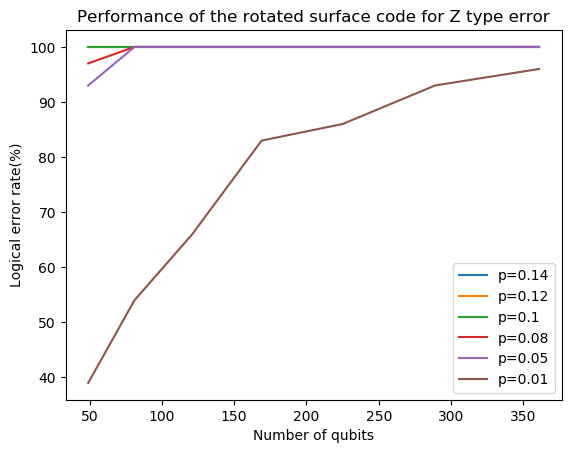

In [590]:
from math import sqrt
from qecsim import paulitools as pt
#from UnionFindDecoder import UnionFindDecoder
from qecsim import app
import numpy as np
from qecsim.models.generic import DepolarizingErrorModel, PhaseFlipErrorModel
from qecsim.models.rotatedplanar import RotatedPlanarCode
import matplotlib.pyplot as plt
my_error_model = DepolarizingErrorModel()
my_decoder = UnionFindDecoder()
error_probability = 0.1
result = []
errorList = [0.14, 0.12, 0.10, 0.08,0.05, 0.01]
maxsize = 21
x = [i*i for i in range(7, maxsize, 2)]
for err in errorList:
    result = []
    error_probability = err
    for i in range(7, maxsize, 2):
        my_code = RotatedPlanarCode(i, i)
        res = app.run(my_code, my_error_model, my_decoder,
                       error_probability, max_runs=100)
        result.append(100*(res['logical_failure_rate']))
    plt.plot(x, result, label='p={}'.format(err))


plt.title('Performance of the rotated surface code for Z type error')
plt.xlabel('Number of qubits')
plt.ylabel('Logical error rate(%)')
plt.legend()
plt.show()
#plt.savefig('test.png')

In [18]:
import numpy as np
from qecsim import paulitools as pt
from qecsim.models.generic import DepolarizingErrorModel
from qecsim.models.rotatedplanar import RotatedPlanarCode
from UnionFindDecoder import UnionFindDecoder

my_code = RotatedPlanarCode(7, 7)
my_error_model = DepolarizingErrorModel()
# set physical error probability to 10%
error_probability = 0.1
rng = np.random.default_rng(14)
# error: random error based on error probability
error = my_error_model.generate(my_code, error_probability, rng)
print('error:\n{}'.format(my_code.new_pauli(error)))
syndrome = pt.bsp(error, my_code.stabilizers.T)
print('syndrome:\n{}'.format(my_code.ascii_art(syndrome)))
test = UnionFindDecoder()
recovery = test.decode(my_code, syndrome)
print('recovery:\n{}'.format(my_code.new_pauli(recovery)))
print('recovery ^ error:\n{}'.format(my_code.new_pauli(recovery ^ error)))
if pt.bsp(recovery ^ error, my_code.logicals.T)[0] == 0 and pt.bsp(recovery ^ error, my_code.logicals.T)[1] == 0:
    print('decode success')
else:
    print('decode fail')

ModuleNotFoundError: No module named 'UnionFindDecoder'

In [259]:
#my_code.__getattribute__(my_code)
# using seed() to seed to 5 again
#np.random.seed=0 ; np.random.rand(4)
np.random.seed = 42.2
#random.seed(5.2)
r=0.1;
a = np.random.random([10]);randB = [1*(i<r) for i in a]
print(randB)
#print(a)

[0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
